In [4]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np
import networkx as nx
from networkx.drawing.nx_pydot import graphviz_layout, read_dot
import pydot
import re

# optional but recomendado: melhora layout se houver Graphviz
try:
    from networkx.drawing.nx_pydot import graphviz_layout, read_dot
    import pydot
    _HAS_GV = True
except ImportError:
    _HAS_GV = False

# [BRACIS] Experimental Analysis

# ──────────────────────────────────────────────────────────────────────────
#### utilidades internas
# ──────────────────────────────────────────────────────────────────────────

In [5]:
def _to_nx_graph(dag_dot: str) -> nx.DiGraph:
    """Converte string DOT → nx.DiGraph (fallback spring_layout)."""
    if isinstance(dag_dot, nx.DiGraph):
        return dag_dot.copy()
    if not isinstance(dag_dot, str):
        raise TypeError("dag_dot precisa ser string DOT ou nx.DiGraph")

    if _HAS_GV:
        try:
            return read_dot(dag_dot)
        except Exception:
            pass  # cai no fallback com pydot

    # parse manual via pydot
    pydot_graph = pydot.graph_from_dot_data(dag_dot)[0]
    return nx.DiGraph(nx.nx_pydot.from_pydot(pydot_graph))

In [6]:
def _bar_plot(data_dict, y_label, *, figsize=(10, 5),
              bar_width=0.6, xtick_rotation=60, color="#4472c4"):
    """Gráfico de barras compacto mas legível."""
    labels = list(data_dict.keys())
    values = list(data_dict.values())
    x      = np.arange(len(labels))

    plt.figure(figsize=figsize)
    bars = plt.bar(x, values, width=bar_width, color=color, edgecolor="black")
    plt.ylabel(y_label)
    plt.xticks(x, labels, rotation=xtick_rotation, ha="right")
    # texto em cima da barra
    for rect, val in zip(bars, values):
        plt.text(rect.get_x() + rect.get_width()/2,
                 rect.get_height() + 0.01*max(values),
                 f"{val:.3f}",
                 ha="center", va="bottom", fontsize=8)
    plt.tight_layout()
    plt.show()

In [7]:
def _plot_dag_with_scores(dag, scores, target, *,
                          cmap="YlOrRd", node_scale=4000, base_size=800):
    """Desenha DAG: tamanho + cor ∝ score; target em destaque."""
    G = _to_nx_graph(dag)

    # valores normalizados para a cor
    vals   = np.array([scores.get(n, 0.0) for n in G.nodes])
    norm   = mcolors.Normalize(vmin=vals.min(), vmax=vals.max())
    colors = cm.get_cmap(cmap)(norm(vals))

    sizes = [base_size + node_scale * scores.get(n, 0.1) for n in G.nodes]

    if _HAS_GV:
        try:
            pos = graphviz_layout(G, prog="dot")
        except Exception:
            pos = nx.spring_layout(G, seed=42)
    else:
        pos = nx.spring_layout(G, seed=42)

    plt.figure(figsize=(11, 7))
    nx.draw_networkx_edges(G, pos, arrows=True, arrowstyle="-|>",
                           arrowsize=12, edge_color="#555555")

    # target: cor distinta
    node_colors = ['#4c72b0' if n == target else colors[i]
                   for i, n in enumerate(G.nodes)]
    node_sizes  = [sizes[i]*1.2 if n == target else sizes[i]
                   for i, n in enumerate(G.nodes)]

    nx.draw_networkx_nodes(G, pos, node_color=node_colors,
                           node_size=node_sizes, cmap=cmap, linewidths=1.2,
                           edgecolors="#333333")

    nx.draw_networkx_labels(G, pos, font_size=9)

    # anota pontuação abaixo de cada nó pontuado
    for n, (x, y) in pos.items():
        if n in scores:
            plt.text(x, y - 0.08, f"{scores[n]:.3f}",
                     ha="center", va="top", fontsize=7)

    plt.axis("off")
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, orientation="vertical", fraction=0.04,
                        pad=0.02, label="Score")
    plt.tight_layout()
    plt.show()

In [8]:
def _slug(name: str) -> str:
    """Normaliza nomes: upper-case, suprime '_' e mantém '-'."""
    return re.sub(r'\s+', '',
                  name.replace('_', '-')).upper()


def _to_nx_graph(dag_dot: str) -> nx.DiGraph:
    if isinstance(dag_dot, nx.DiGraph):
        return dag_dot.copy()
    if not isinstance(dag_dot, str):
        raise TypeError("dag_dot deve ser string DOT ou nx.DiGraph")

    if _HAS_GV:
        try:
            return read_dot(dag_dot)
        except Exception:
            pass
    pydot_graph = pydot.graph_from_dot_data(dag_dot)[0]
    return nx.DiGraph(nx.nx_pydot.from_pydot(pydot_graph))


def _bar_plot(data_dict, y_label, *, figsize=(10, 4.5),
              bar_width=0.55, xtick_rotation=60, color="#4c72b0", title=None):
    labels = list(data_dict.keys())
    values = list(data_dict.values())
    x = np.arange(len(labels))
    plt.figure(figsize=figsize)
    bars = plt.bar(x, values, width=bar_width, color=color, edgecolor="black")
    plt.ylabel(y_label)
    if title:                       # title é uma string ou None
        plt.title(title, fontsize=12, pad=12)
    plt.xticks(x, labels, rotation=xtick_rotation, ha="right")
    for r, v in zip(bars, values):
        plt.text(r.get_x() + r.get_width()/2, r.get_height() + 0.01*max(values),
                 f"{v:.3f}", ha="center", va="bottom", fontsize=7)
    plt.tight_layout()
    plt.show()


def _plot_dag_with_scores(dag_dot, scores, target,
                          cmap="YlOrRd", node_scale=3500, base_size=800, 
                          title=None, y_label=""):
    G = _to_nx_graph(dag_dot)

    # cria mapeamento {slug: valor}
    slug2score = {_slug(k): v for k, v in scores.items()}

    raw_vals, node_vals = [], []
    for n in G.nodes:
        val = slug2score.get(_slug(n), np.nan)
        node_vals.append(val)
        if not np.isnan(val):
            raw_vals.append(val)

    # fallback se todo mundo é nan (evita div/0)
    if len(raw_vals) == 0:
        raw_vals = [0.0]

    vmin, vmax = min(raw_vals), max(raw_vals)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax) if vmin != vmax else None
    cmap_obj = cm.get_cmap(cmap)

    node_colors = []
    node_sizes  = []
    for n, val in zip(G.nodes, node_vals):
        if n == target:
            node_colors.append("#4878d0")
            node_sizes.append(base_size * 1.4)
        else:
            if norm is None or np.isnan(val):
                node_colors.append("#cccccc")
            else:
                node_colors.append(cmap_obj(norm(val)))
            node_sizes.append(base_size + node_scale * (0 if np.isnan(val) else val))

    if _HAS_GV:
        try:
            pos = graphviz_layout(G, prog="dot")
        except Exception:
            pos = nx.spring_layout(G, seed=14)
    else:
        pos = nx.spring_layout(G, seed=14)

    fig, ax = plt.subplots(figsize=(11, 6))
    nx.draw_networkx_edges(G, pos, ax=ax, arrows=True,
                           arrowstyle="-|>", arrowsize=12, edge_color="#555555")
    nx.draw_networkx_nodes(G, pos, ax=ax,
                           node_color=node_colors, node_size=node_sizes,
                           linewidths=1.1, edgecolors="#333333")
    nx.draw_networkx_labels(G, pos, ax=ax, font_size=9)

    # anotação de score
    for n, (x, y) in pos.items():
        sval = slug2score.get(_slug(n))
        if sval is not None and not np.isnan(sval):
            ax.text(x, y - 0.08, f"{sval:.3f}",
                    ha="center", va="top", fontsize=7)

    ax.axis("off")

    # colorbar (só se tivermos range)
    if norm is not None and vmin != vmax:
        sm = cm.ScalarMappable(norm=norm, cmap=cmap_obj)
        sm.set_array([])
        fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.02,
                     label=y_label)

    if title:                       # title é uma string ou None
        plt.title(title, fontsize=12, pad=12)

    plt.tight_layout()
    plt.show()

# ──────────────────────────────────────────────────────────────────────────
#### Função principal
# ──────────────────────────────────────────────────────────────────────────

In [9]:
def visualize_scores_and_graph(dag_dot: str,
                               interval_dict: dict,
                               which: str,
                               target: str,
                               score_name: str,
                               bar_figsize=(10, 5),
                               bar_title=None,
                               dag_title=None):
    """
    1. Extrai min ou max de cada intervalo.
    2. Plota gráfico de barras.
    3. Desenha grafo com scores nos nós.

    Parâmetros
    ----------
    dag_dot : str
        Grafo em formato DOT.
    interval_dict : dict[str, list[float]]
        {'Var': [min, max], ...}.
    which : {'min', 'max'}
        Escolha do valor do intervalo.
    target : str
        Nome do nó alvo (normalmente ausente em interval_dict).
    score_name : str
        Label para eixo Y e legenda (ex.: "PN", "PS").
    bar_figsize : tuple, opcional
        Tamanho da figura do gráfico de barras.
    """

    if which not in {"min", "max"}:
        raise ValueError("which deve ser 'min' ou 'max'")
    idx = 0 if which == "min" else 1

    # ETAPA I – normaliza nomes
    scores = {}
    for k, v in interval_dict.items():
        scores[k] = v[idx] if v[idx] is not None else np.nan

    # ETAPA II
    _bar_plot(scores, f"{score_name} ({which})", figsize=bar_figsize, title=bar_title)

    # ETAPA III
    _plot_dag_with_scores(dag_dot, scores, target,
                          cmap="YlOrRd", node_scale=4500, base_size=850, title=dag_title, y_label=f"{score_name} ({which})")

### exemplo mínimo de uso

```
dot_graph_model2 = """
    digraph {
        "DB_Change"      -> "DB_Latency";
        "DB_Latency"     -> "MS-B_Latency";
        "MS-B_Latency"   -> "MS-B_Error";
        "MS-B_Latency"   -> "MS-A_Latency";
        "MS-B_Error"     -> "MS-A_Error";
        "MS-A_Latency"   -> "MS-A_Threads";
        "MS-A_Threads"   -> "MS-A_Crash";
        "MS-A_Error"     -> "Outage";
        "MS-A_Crash"     -> "Outage";
        "HeavyTraffic"   -> "DB_Latency";
        "HeavyTraffic"   -> "MS-A_Latency";
    }
    """

intervals = {
        "DB_CHANGE":      [0.0035, 0.0115],
        "DB_LATENCY":     [0.0162, 0.0411],
        "MS-B_LATENCY":   [0.1414, 0.1714],
        "MS-B_ERROR":     [0.8602, 0.9311],
        "MS-A_LATENCY":   [0.0758, 0.1184],
        "MS-A_ERROR":     [0.9357, 0.9645],
        "MS-A_THREADS":   [0.1989, 0.2937],
        "MS-A_CRASH":     [0.4437, 0.6387],
}

visualize_scores_and_graph(dot_graph_model2,
                            intervals,
                            which="max",
                            target="Outage",
                            score_name="PN",
                            bar_title="Teste",
                            dag_title="Teste 2")

# ──────────────────────────────────────────────────────────────────────────
# Análises
# ──────────────────────────────────────────────────────────────────────────

# Modelo 1

In [10]:
dot_graph_model1 = """
digraph {
    "NewDeploy"      -> "MemLeak";
    "MemLeak"        -> "MemUsageHigh";
    "MemUsageHigh"   -> "ServiceCrash";
    "ServiceCrash"   -> "Outage";
    "HeavyTraffic"   -> "MemUsageHigh";
    "HeavyTraffic"   -> "ServiceCrash";
}
"""

## M1 - Narrativa 1

### Root Cause: MemLeak

### PN

In [11]:
PN_M1N1 = {
    'NEWDEPLOY': [0.018448668649361313, 0.04495314718612547],
    'MEMLEAK': [0.6793438116064181, 0.795369102403335],
    'MEMUSAGEHIGH': [0.7634709395238268, 0.9233772973502913],
    'SERVICECRASH': [1.0, 1.0]
}

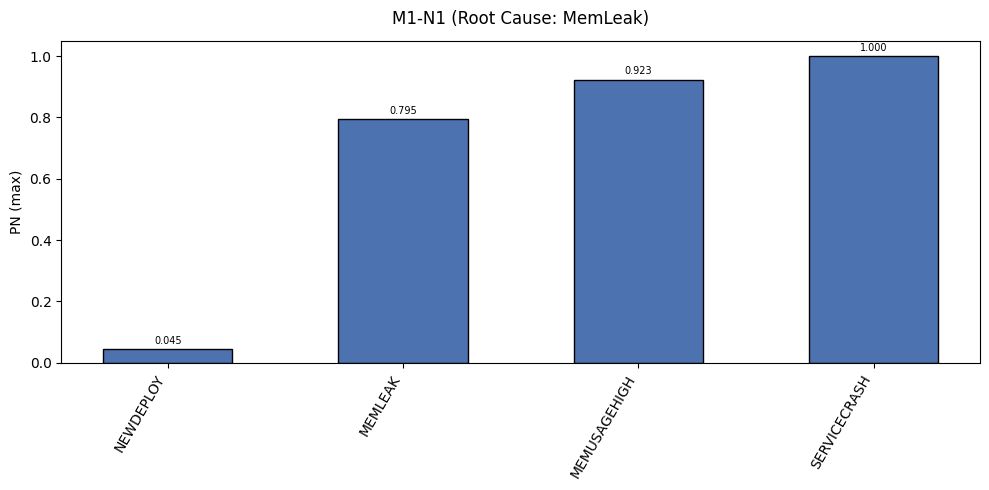

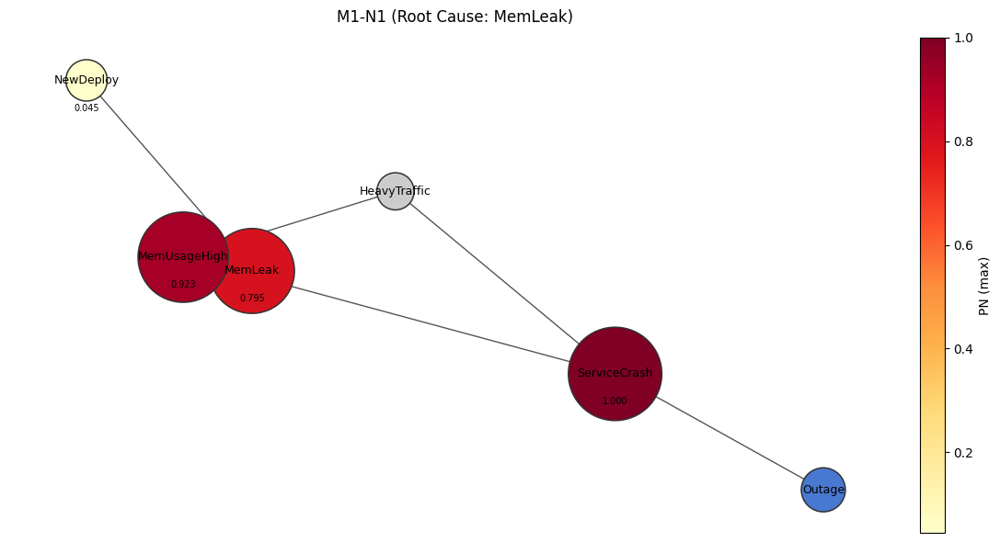

In [12]:
visualize_scores_and_graph(dot_graph_model1,
                            PN_M1N1,
                            which="max",
                            target="Outage",
                            score_name="PN",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

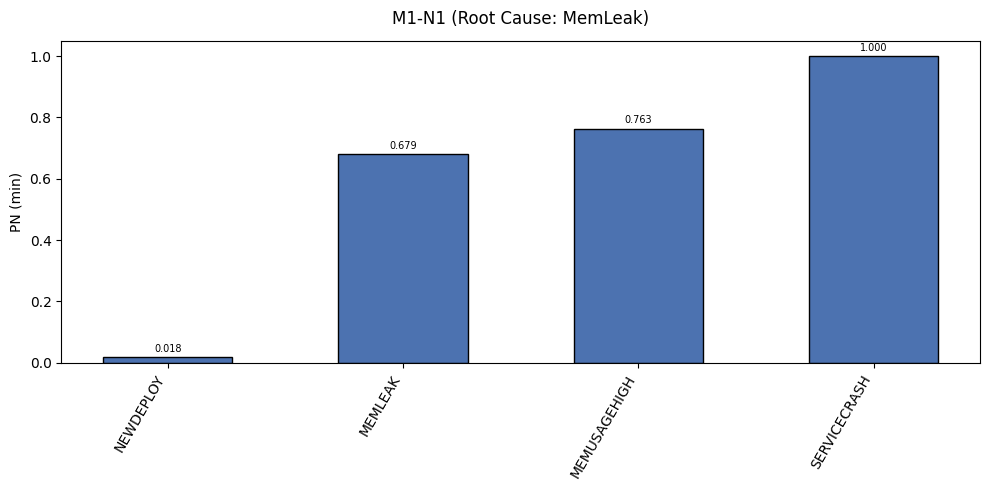

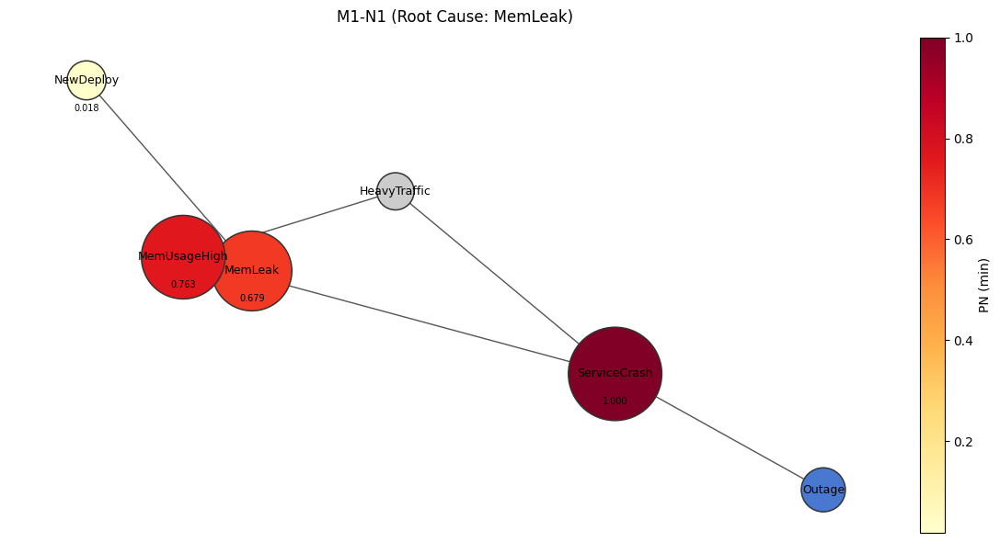

In [13]:
visualize_scores_and_graph(dot_graph_model1,
                            PN_M1N1,
                            which="min",
                            target="Outage",
                            score_name="PN",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

### PS

In [14]:
PS_M1N1 = {
	'NEWDEPLOY': [0.03533495962278613, 0.08609932116201331],
	'MEMLEAK': [0.5926535795495097, 0.6887254183045437],
	'MEMUSAGEHIGH': [0.2367956646631491, 0.8136750098036081],
	'SERVICECRASH': [0.9001506642925627, 0.9001506642926649]
}

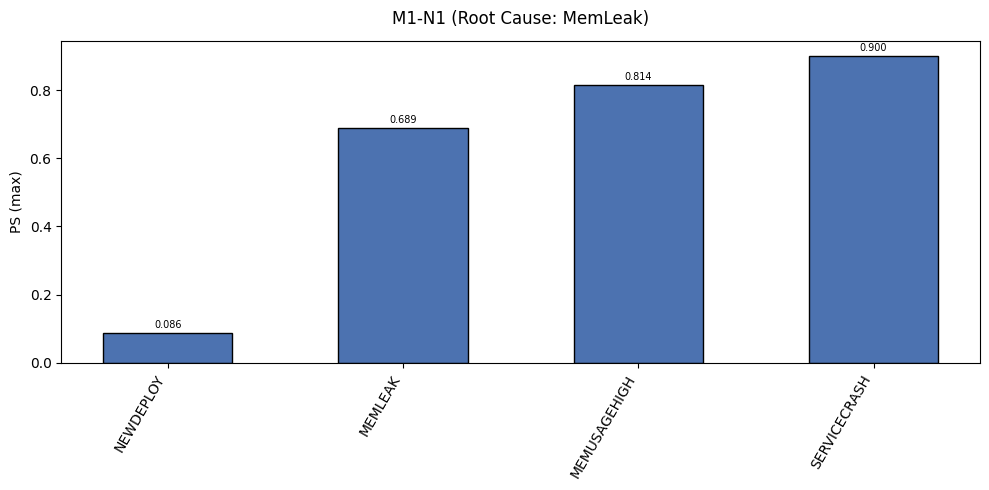

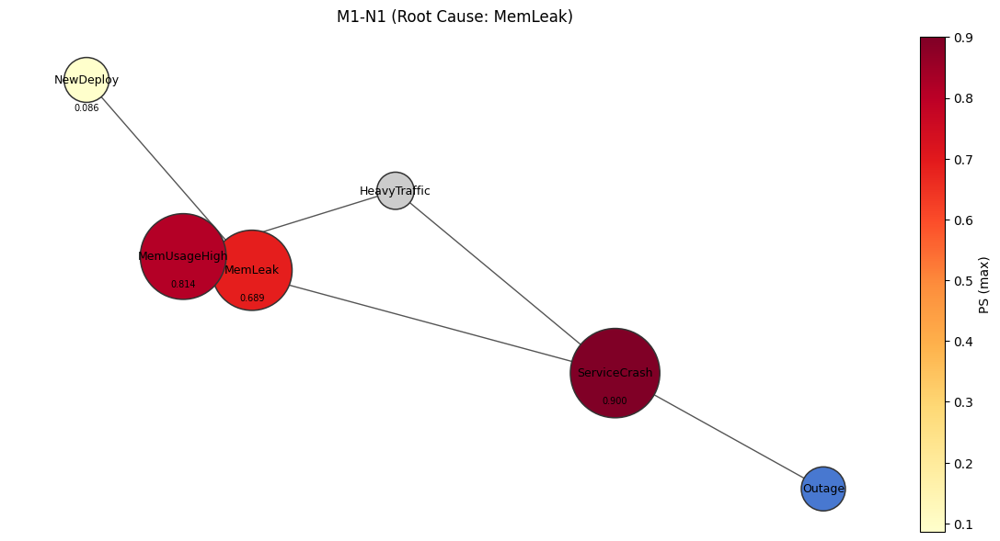

In [15]:
visualize_scores_and_graph(dot_graph_model1,
                            PS_M1N1,
                            which="max",
                            target="Outage",
                            score_name="PS",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

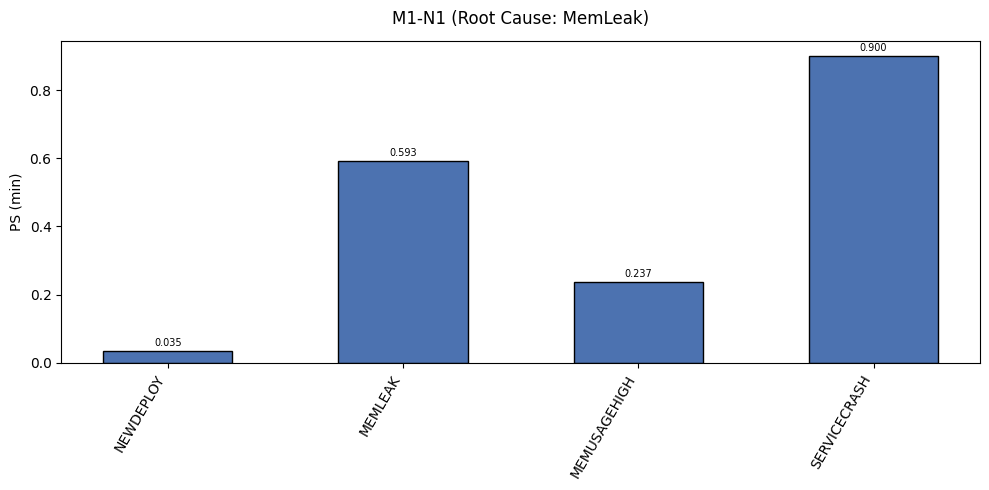

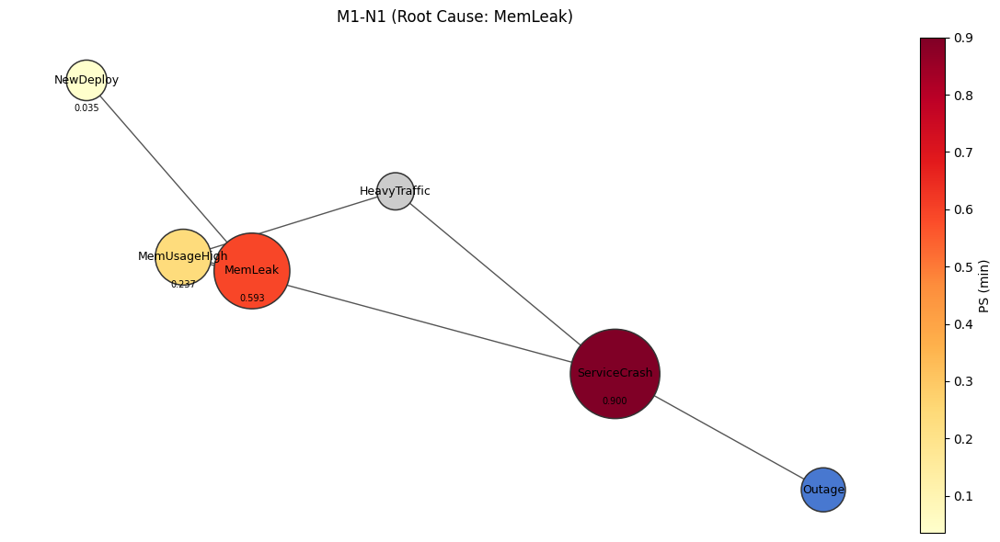

In [16]:
visualize_scores_and_graph(dot_graph_model1,
                            PS_M1N1,
                            which="min",
                            target="Outage",
                            score_name="PS",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

### PNS

In [17]:
PNS_M1N1 = {
	'NEWDEPLOY': [0.012092562837726688, 0.029464928757881526],
	'MEMLEAK': [0.46232261632783694, 0.5414767989639742],
	'MEMUSAGEHIGH': [0.5415947599585392, 0.7034957226339846],
	'SERVICECRASH': [0.9001506642925627, 0.9001506642926005]
}

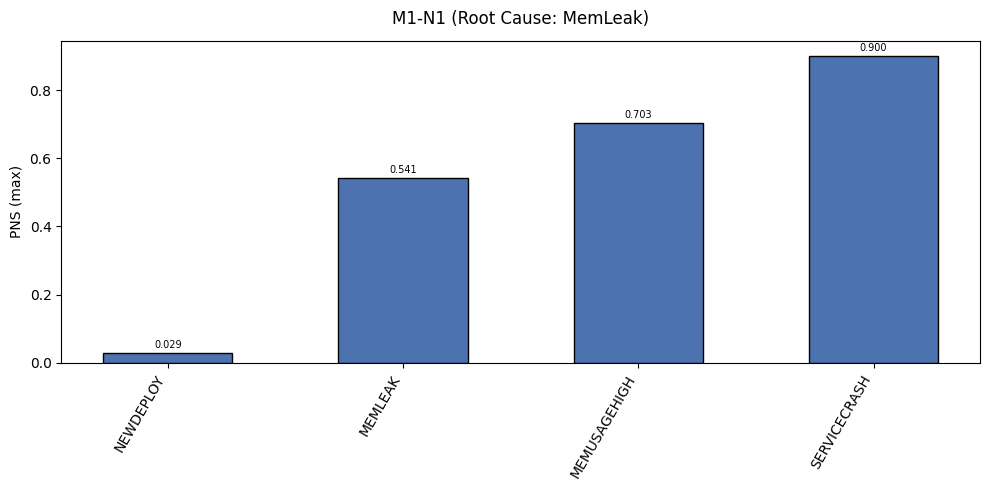

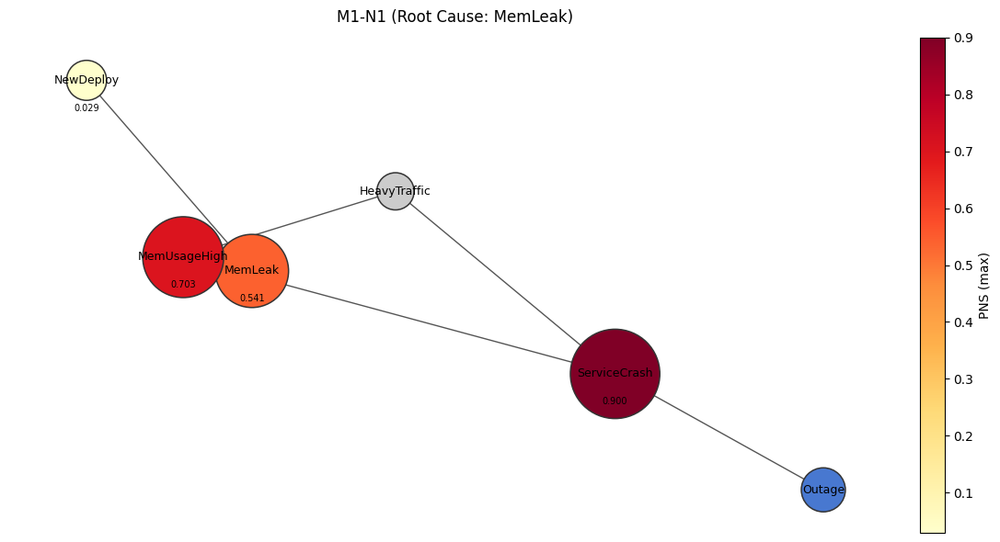

In [18]:
visualize_scores_and_graph(dot_graph_model1,
                            PNS_M1N1,
                            which="max",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

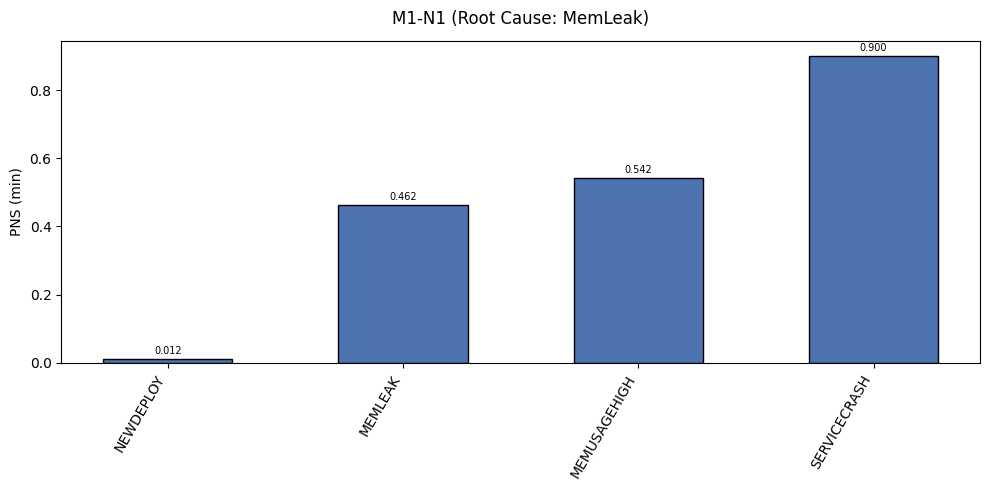

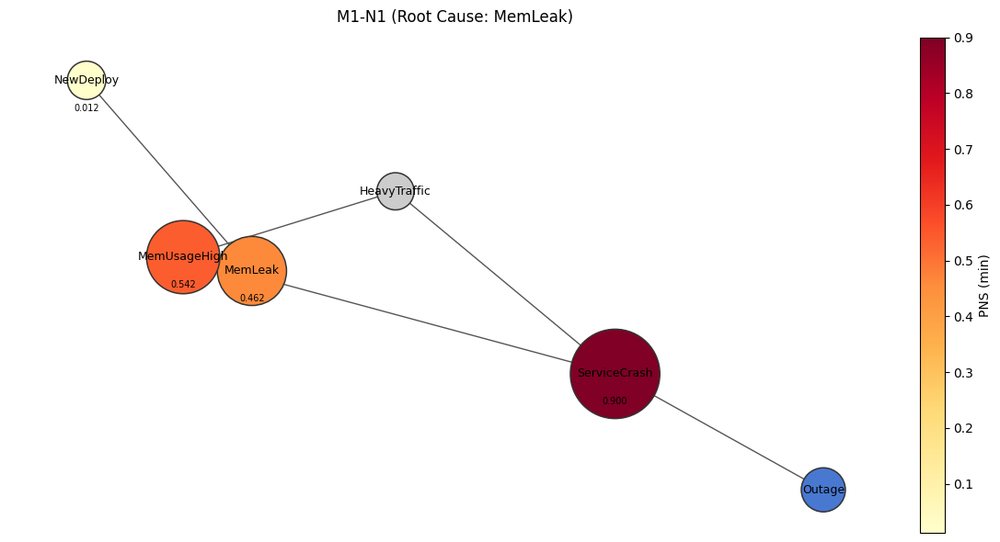

In [19]:
visualize_scores_and_graph(dot_graph_model1,
                            PNS_M1N1,
                            which="min",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

### Weak-PN

In [20]:
Weak_PN_M1N1 = {
	'NEWDEPLOY': [0.34214092299020127, 0.34275330801448073],
	'MEMLEAK': [0.7800891317981402, 0.7897930171982558],
	'MEMUSAGEHIGH': [0.8115882776827652, 0.8946146863210567],
	'SERVICECRASH': [0.9999999999999284, 1.0]
}

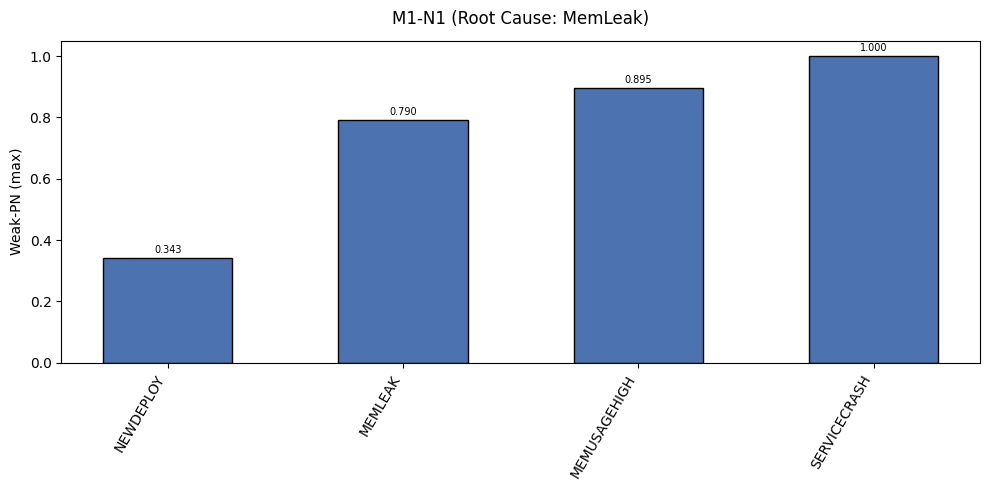

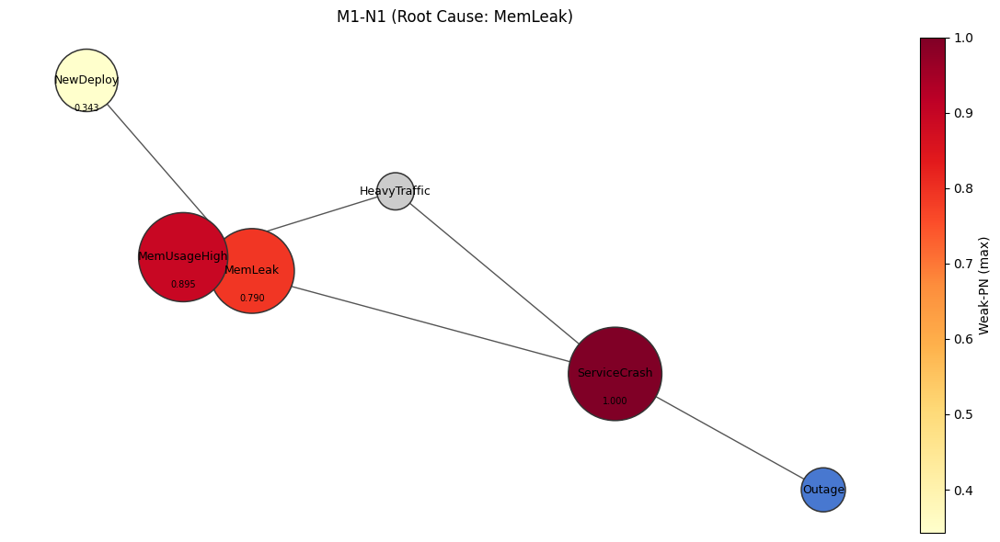

In [21]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PN_M1N1,
                            which="max",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

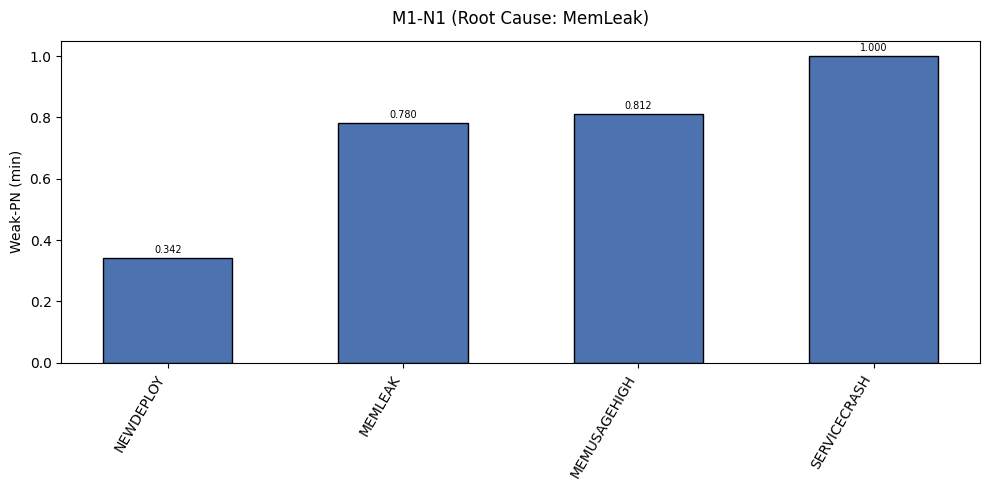

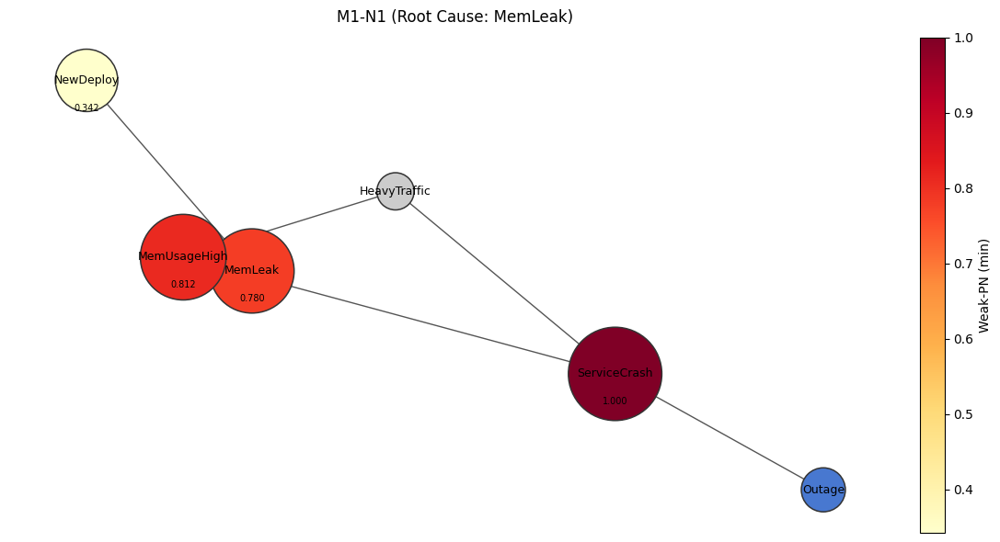

In [22]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PN_M1N1,
                            which="min",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

### Weak PS

In [23]:
Weak_PS_M1N1 = {
	'NEWDEPLOY': [0.6549095584399725, 0.6555594501904056],
	'MEMLEAK': [0.6804122291139612, 0.6810369692710759],
	'MEMUSAGEHIGH': [0.6766711911517094, 0.7783934842579314],
	'SERVICECRASH': [0.9001506642925627, 0.9001506642926005]
}

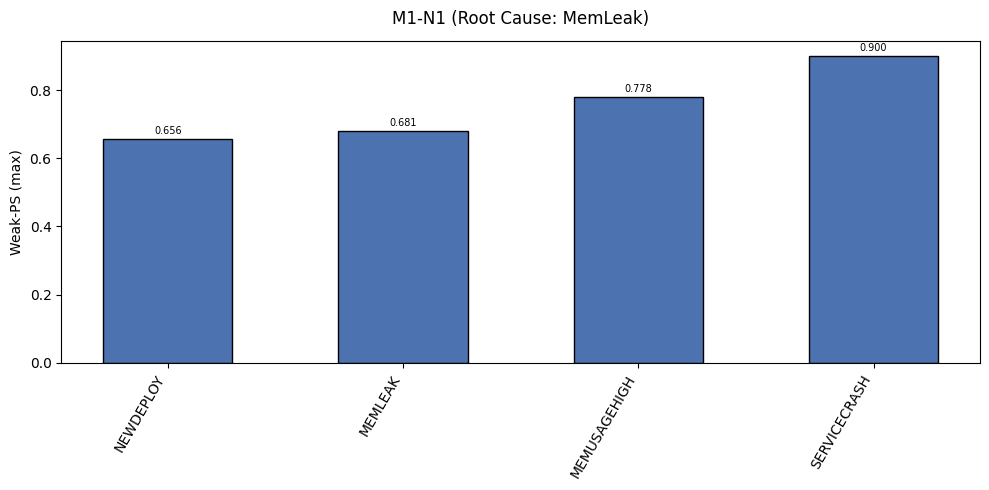

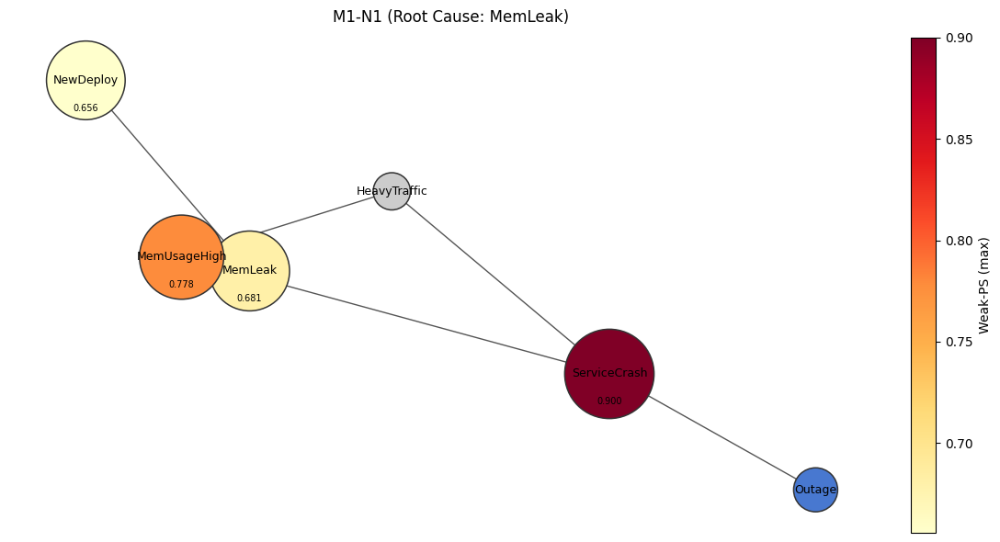

In [24]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PS_M1N1,
                            which="max",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

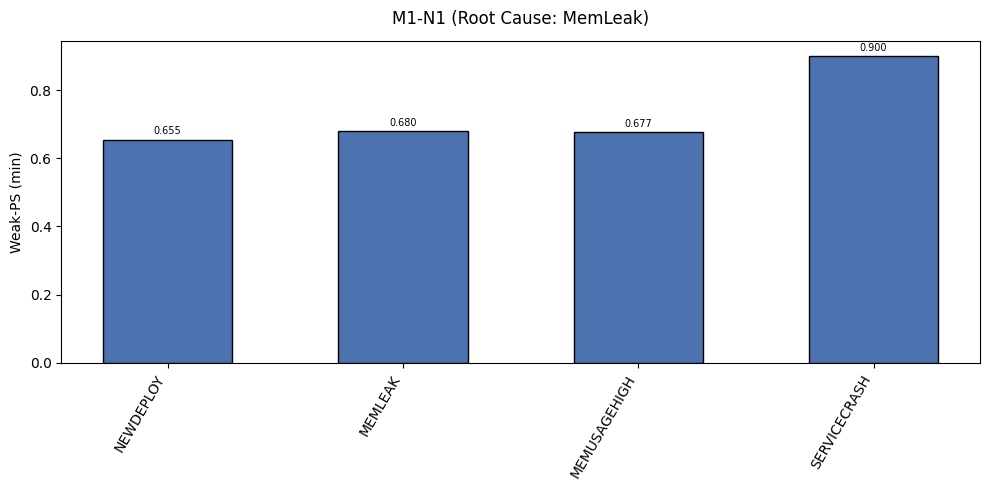

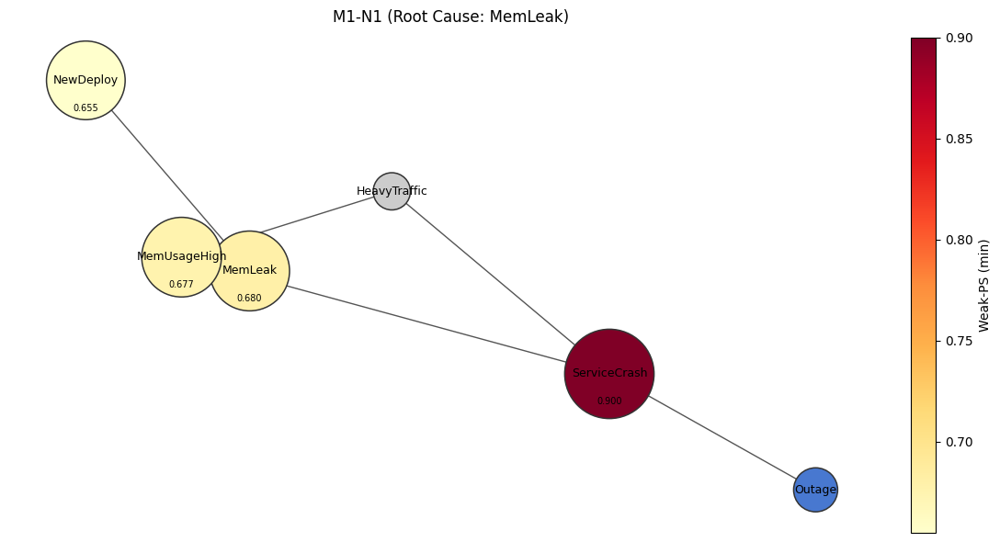

In [26]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PS_M1N1,
                            which="min",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M1-N1 (Root Cause: MemLeak)",
                            dag_title="M1-N1 (Root Cause: MemLeak)")

## M1 - Narrativa 2

### Root Cause: HeavyTraffic

### PN

In [27]:
PN_M1N2 = {
	'NEWDEPLOY': [0.026635154947140315, 0.06237311024355981],
	'MEMLEAK': [0.03023725704040705, 0.08175968490317036],
	'MEMUSAGEHIGH': [0.09173260396654336, 0.8762407872763653],
	'SERVICECRASH': [1.0, 1.0]
}

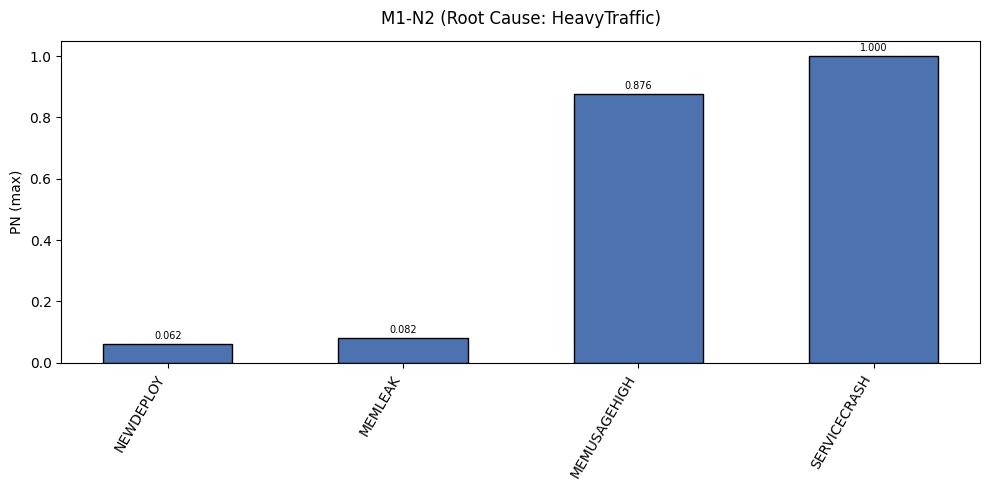

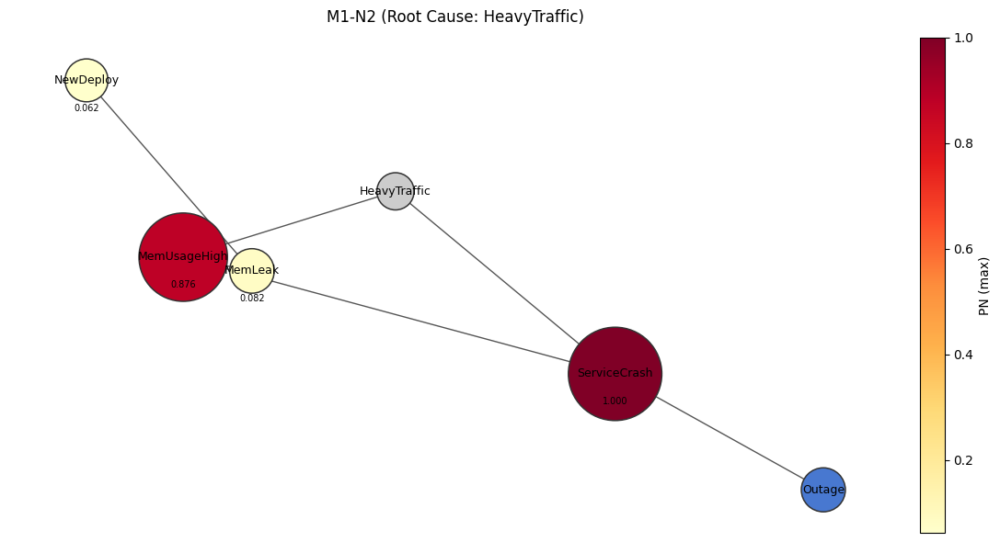

In [28]:
visualize_scores_and_graph(dot_graph_model1,
                            PN_M1N2,
                            which="max",
                            target="Outage",
                            score_name="PN",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

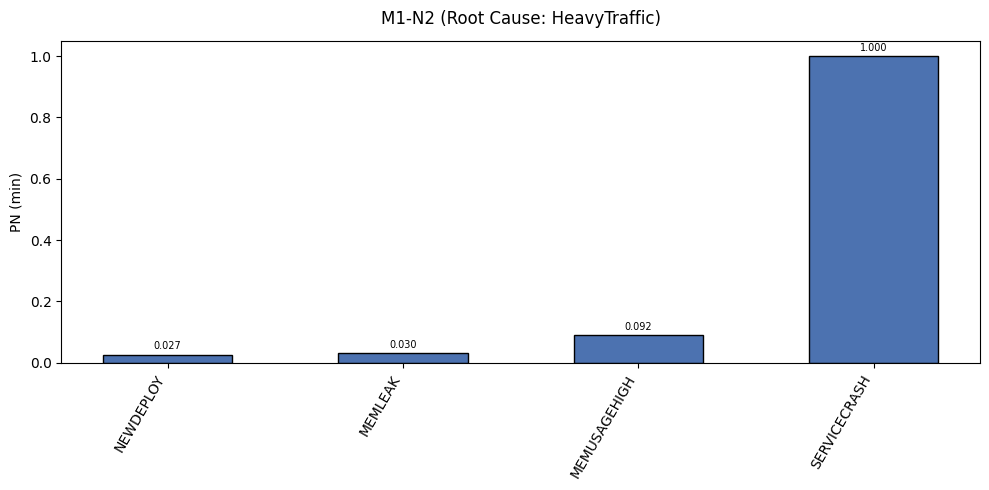

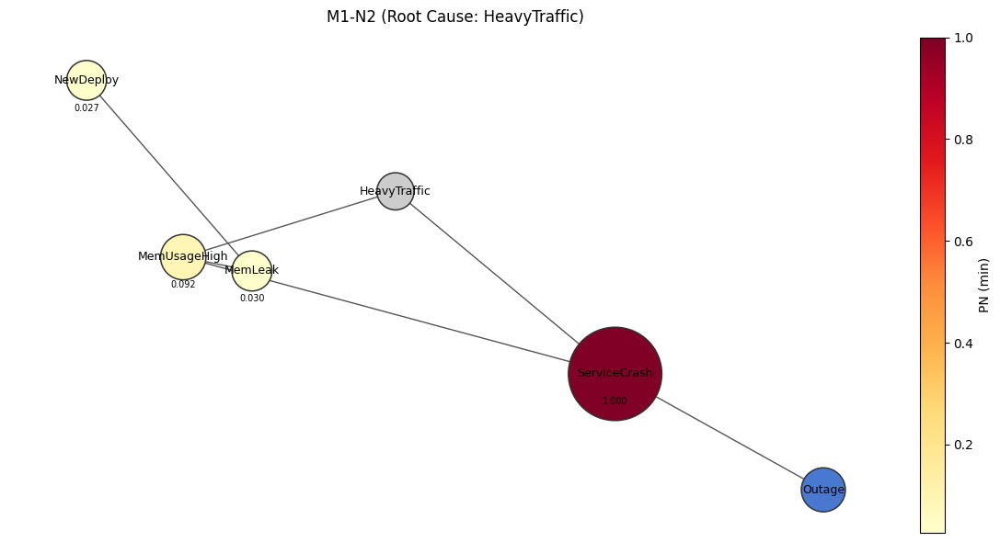

In [29]:
visualize_scores_and_graph(dot_graph_model1,
                            PN_M1N2,
                            which="min",
                            target="Outage",
                            score_name="PN",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

### PS

In [30]:
PS_M1N2 = {
	'NEWDEPLOY': [0.08232465524474297, 0.19269481893511836],
	'MEMLEAK': [0.09321878090444127, 0.2519820544353878],
	'MEMUSAGEHIGH': [0.3052053834898404, 0.6551548268105356],
	'SERVICECRASH': [0.8980126145444545, 0.8980126408273812]
}

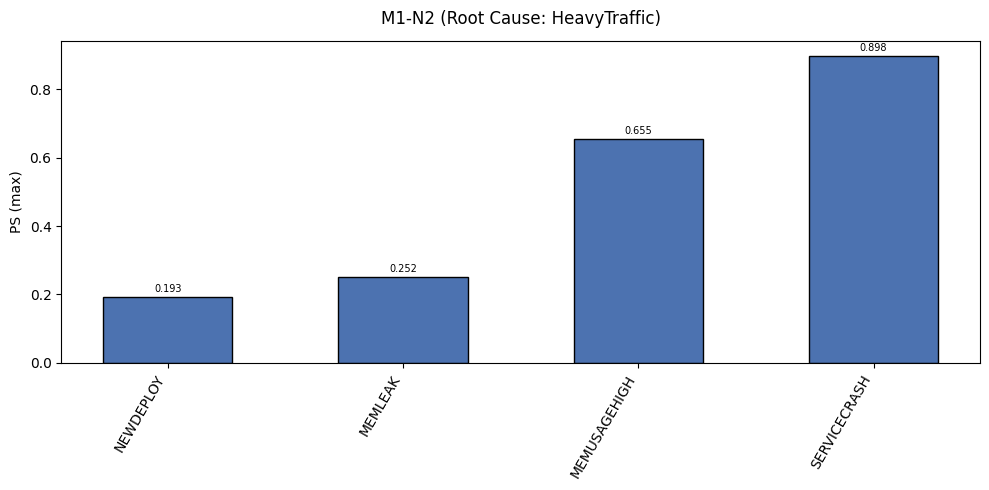

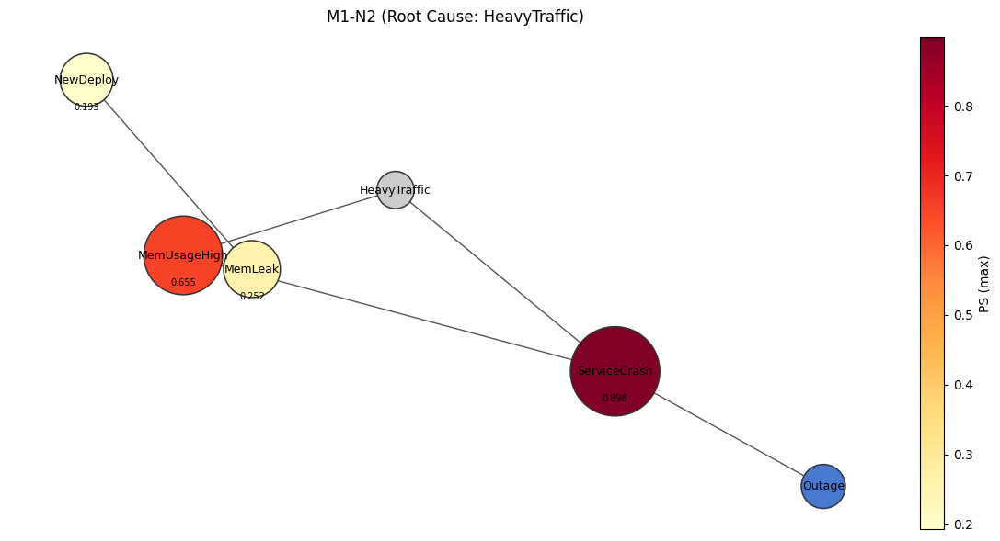

In [31]:
visualize_scores_and_graph(dot_graph_model1,
                            PS_M1N2,
                            which="max",
                            target="Outage",
                            score_name="PS",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

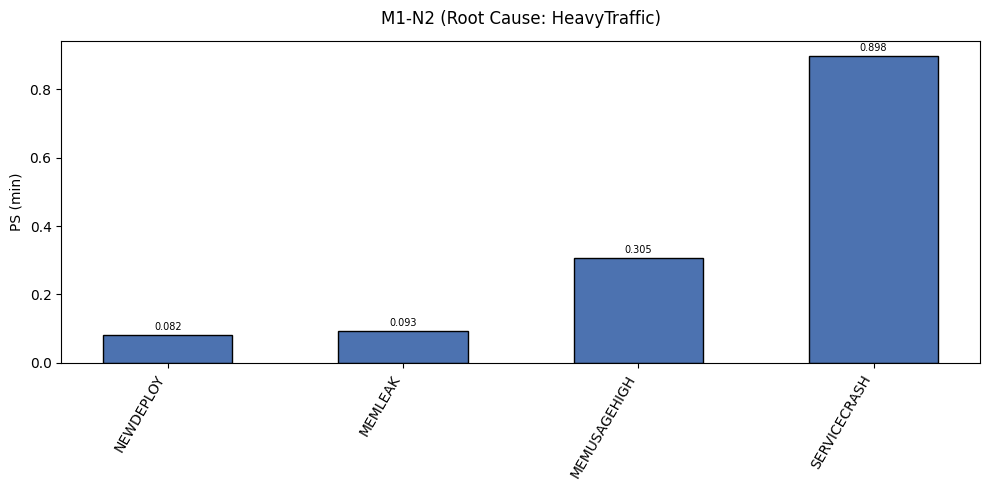

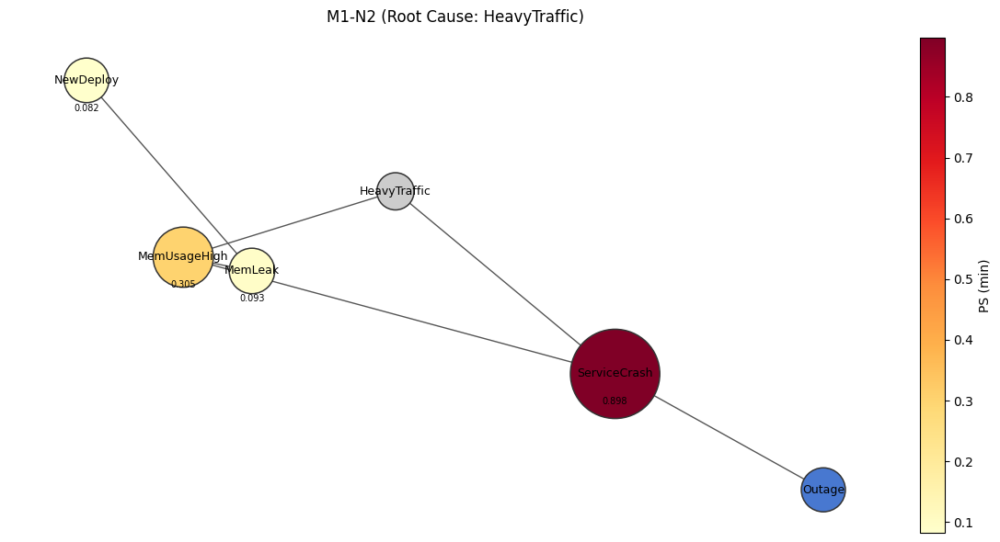

In [32]:
visualize_scores_and_graph(dot_graph_model1,
                            PS_M1N2,
                            which="min",
                            target="Outage",
                            score_name="PS",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

### PNS

In [33]:
PNS_M1N2 = {
	'NEWDEPLOY': [0.020320930298848534, 0.04755306217902802],
	'MEMLEAK': [0.023134192251180963, 0.06249898474988461],
	'MEMUSAGEHIGH': [0.09029104897722152, 0.595894280309827],
	'SERVICECRASH': [0.898012614542811, 0.8980126195379118]
}

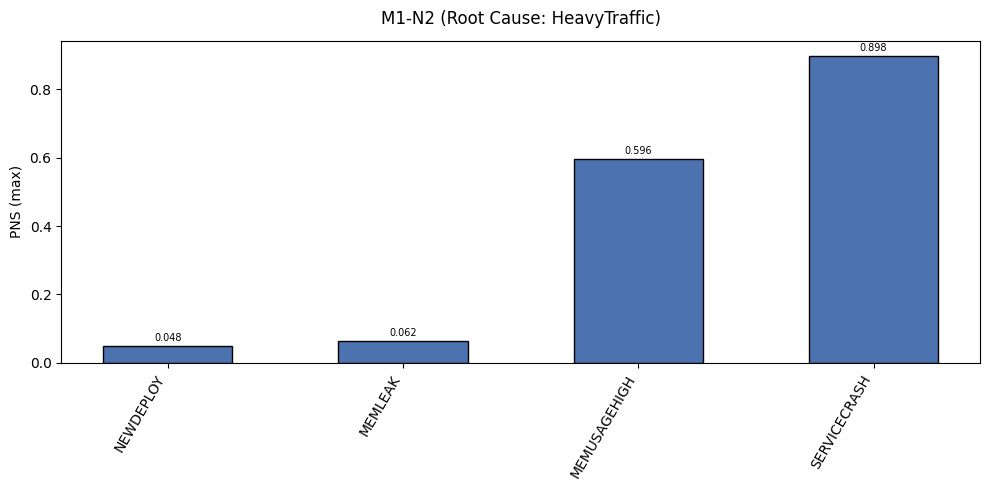

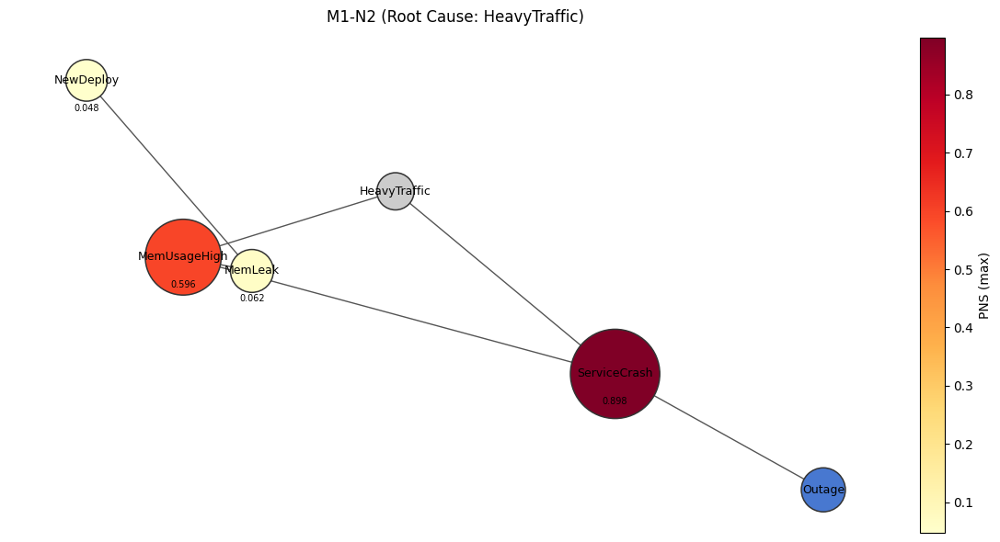

In [34]:
visualize_scores_and_graph(dot_graph_model1,
                            PNS_M1N2,
                            which="max",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

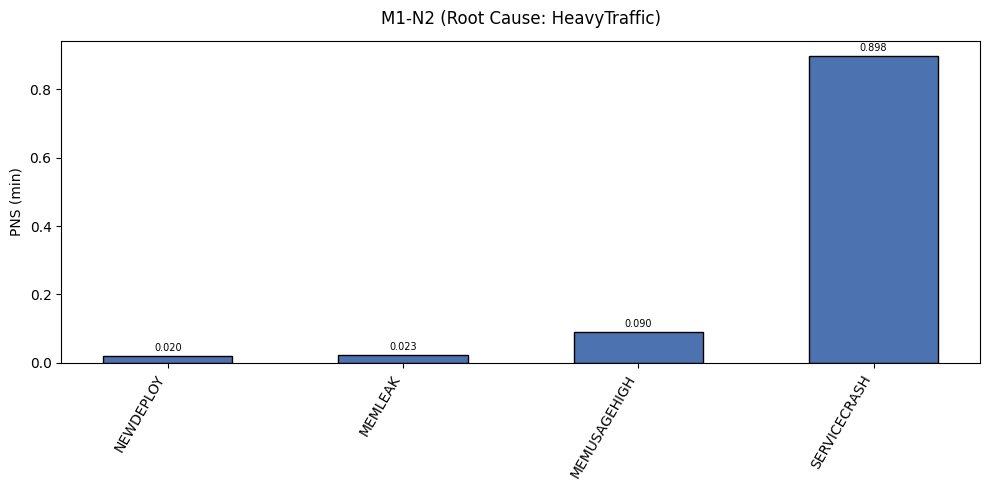

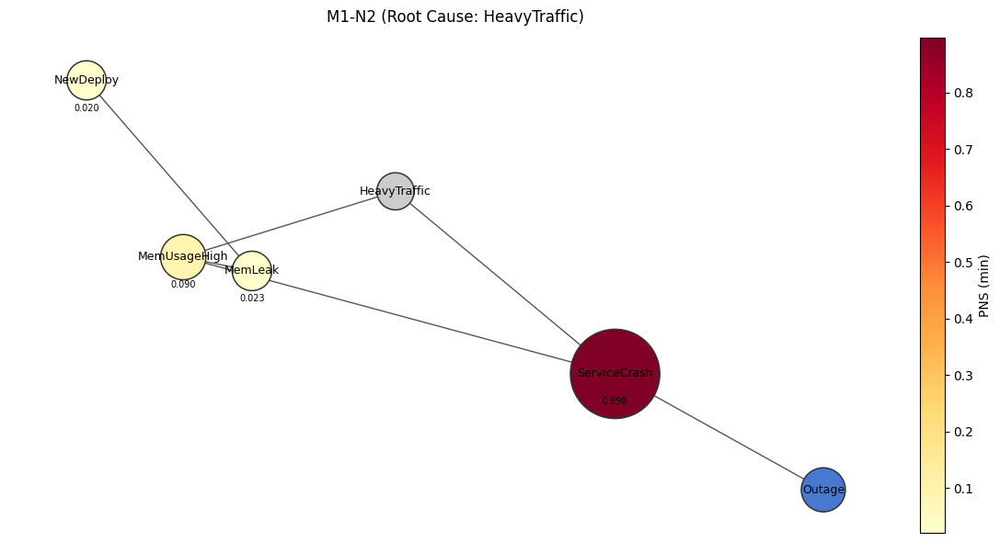

In [35]:
visualize_scores_and_graph(dot_graph_model1,
                            PNS_M1N2,
                            which="min",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

### Weak PN

In [36]:
Weak_PN_M1N2 = {
    'NEWDEPLOY': [0.24674888749331336, 0.24704415366606775],
    'MEMLEAK': [0.24796306421130573, 0.24860296642370333],
    'MEMUSAGEHIGH': [0.22794685463477915, 0.7806440769376284],
    'SERVICECRASH': [0.999999976292684, 0.9999999999981699]
}

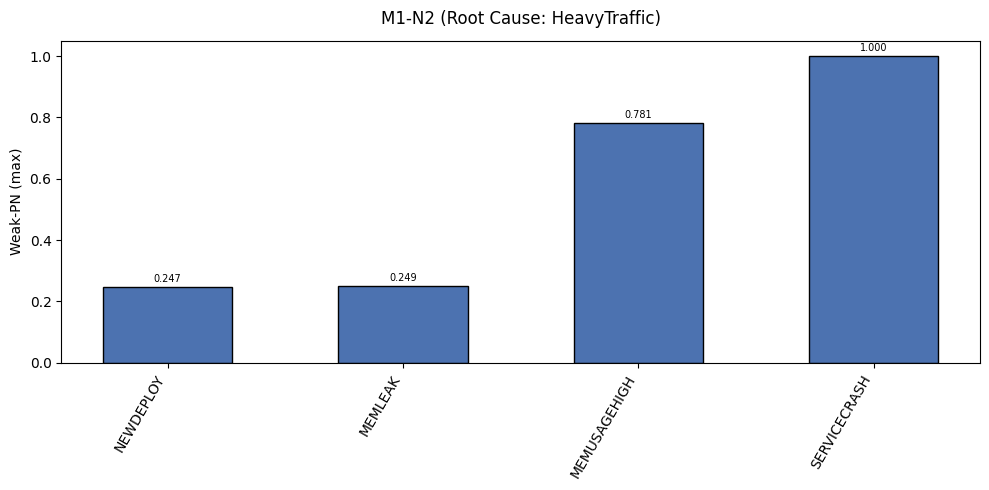

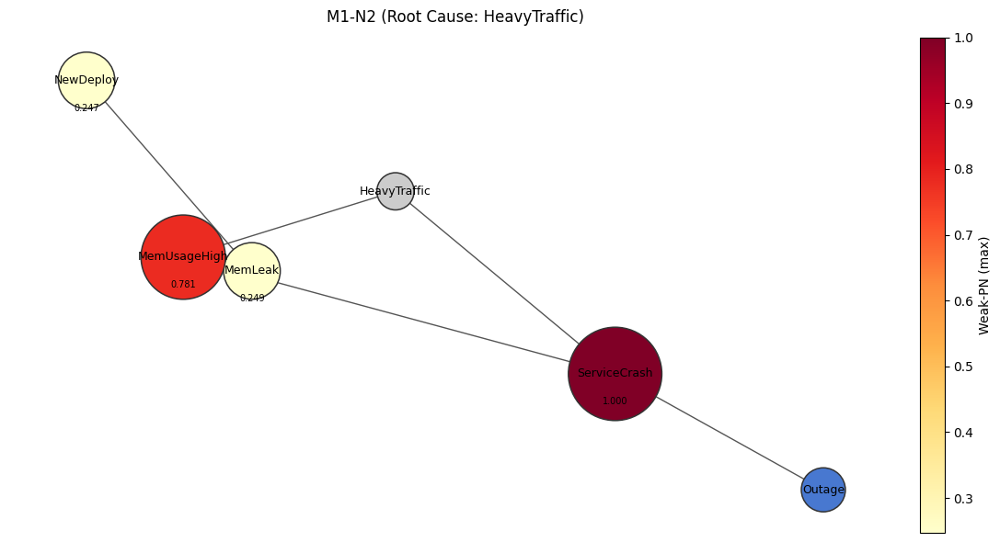

In [37]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PN_M1N2,
                            which="max",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

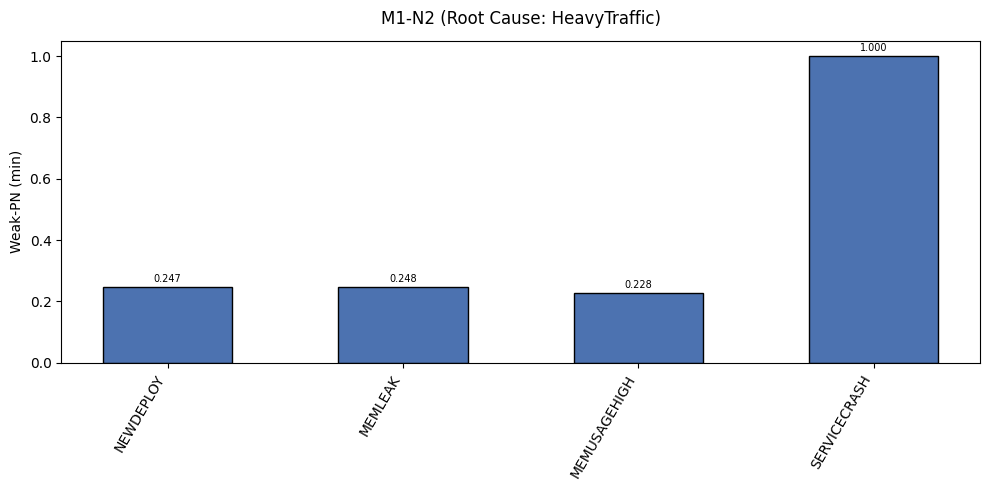

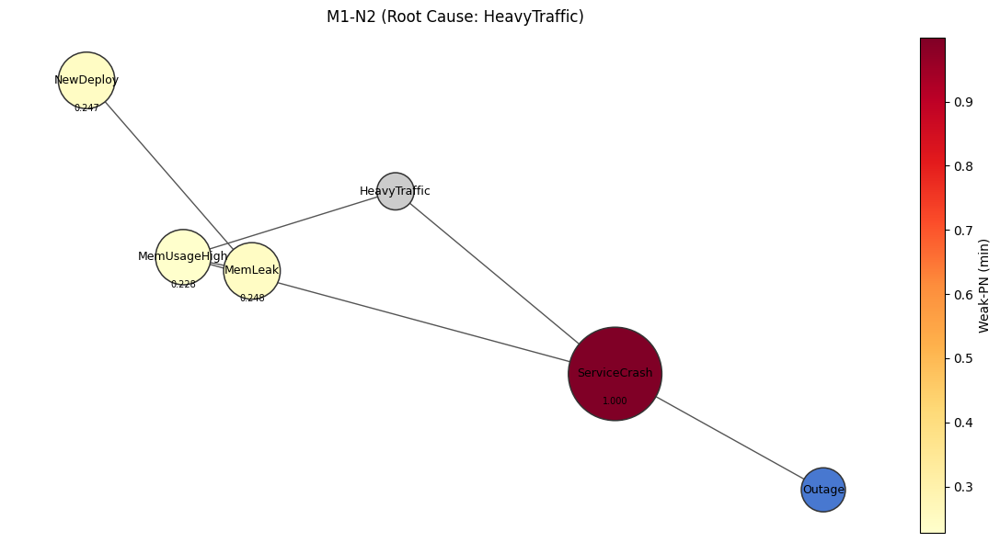

In [38]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PN_M1N2,
                            which="min",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

### Weak PS

In [39]:
Weak_PS_M1N2 = {
	'NEWDEPLOY': [0.7621615257933924, 0.7643954199663049],
	'MEMLEAK': [0.7641290579184379, 0.7669214242433451],
	'MEMUSAGEHIGH': [0.726402749382931, 0.7729220905137818],
	'SERVICECRASH': [0.898012614542811, 0.8980126195379118]
}

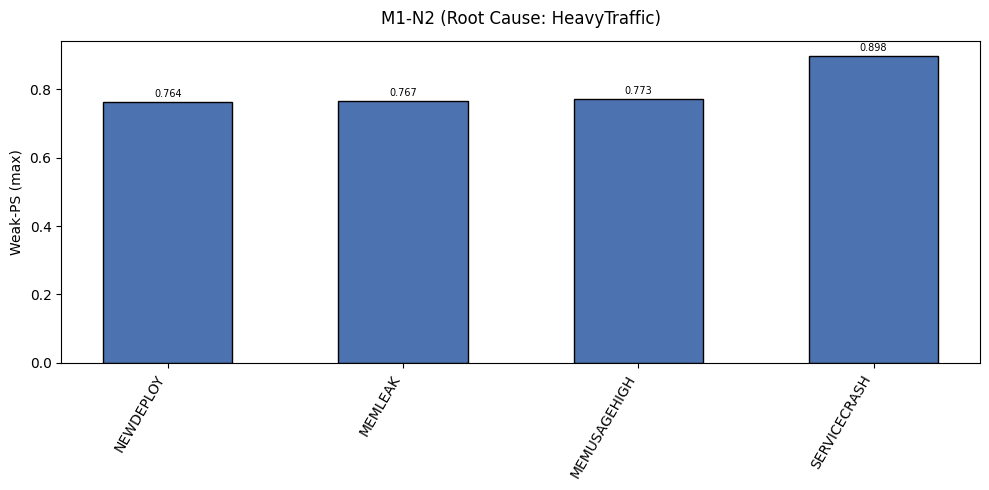

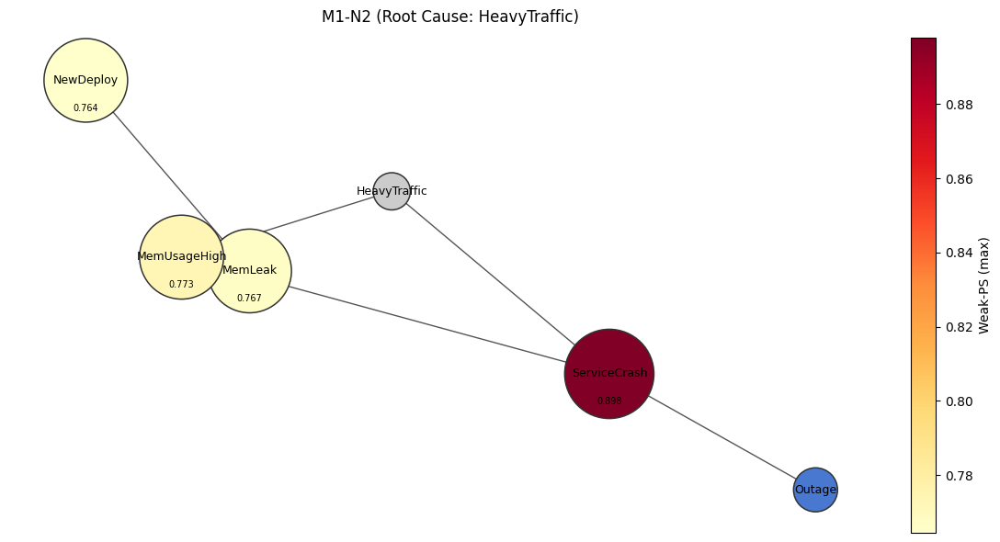

In [40]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PS_M1N2,
                            which="max",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

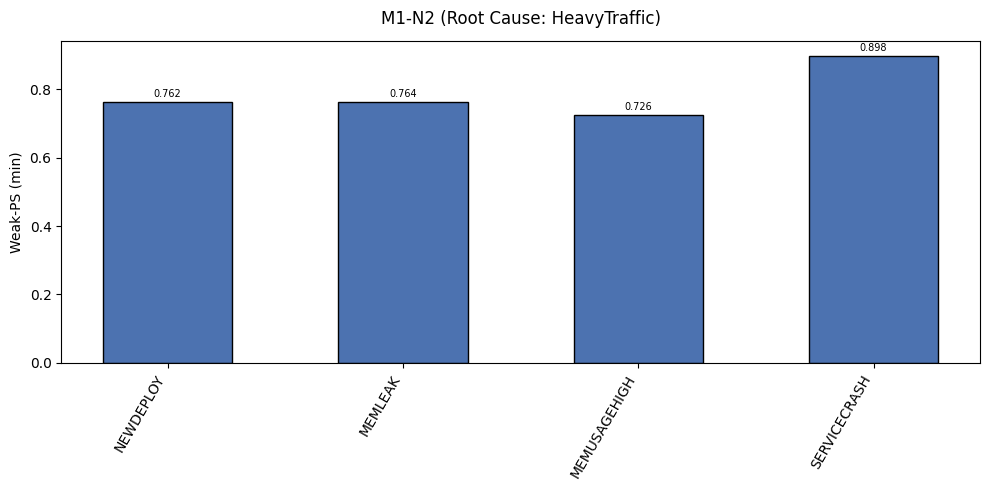

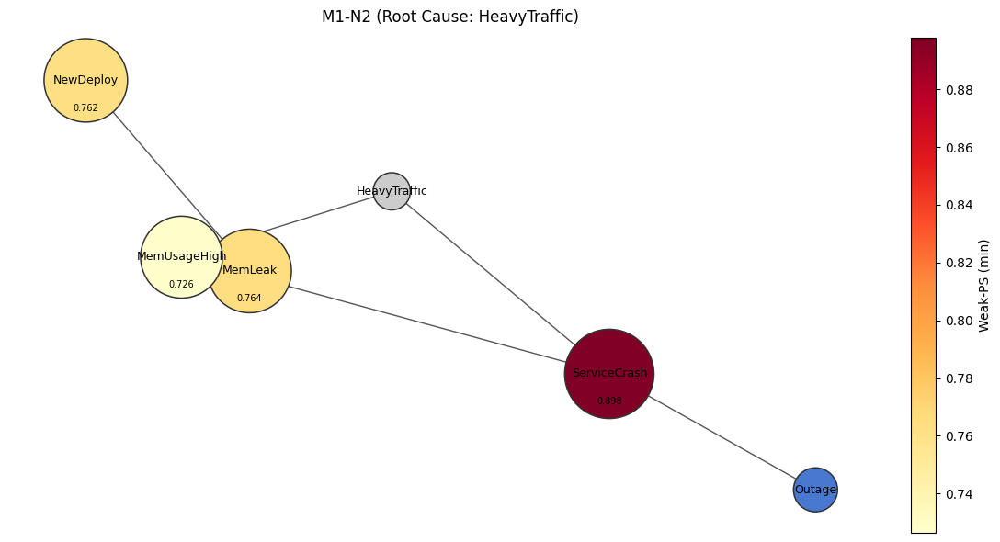

In [41]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PS_M1N2,
                            which="min",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M1-N2 (Root Cause: HeavyTraffic)",
                            dag_title="M1-N2 (Root Cause: HeavyTraffic)")

## M1 - Narrativa 3

### Root Cause: ServiceCrash

### PN

In [42]:
PN_M1N3 = {
	'NEWDEPLOY': [0.025129123243998325, 0.04974735401246899],
	'MEMLEAK': [0.028935006456250516, 0.052101590750052384],
	'MEMUSAGEHIGH': [0.07517571155443684, 0.6037503120786806],
	'SERVICECRASH': [1.0, 1.0]
}

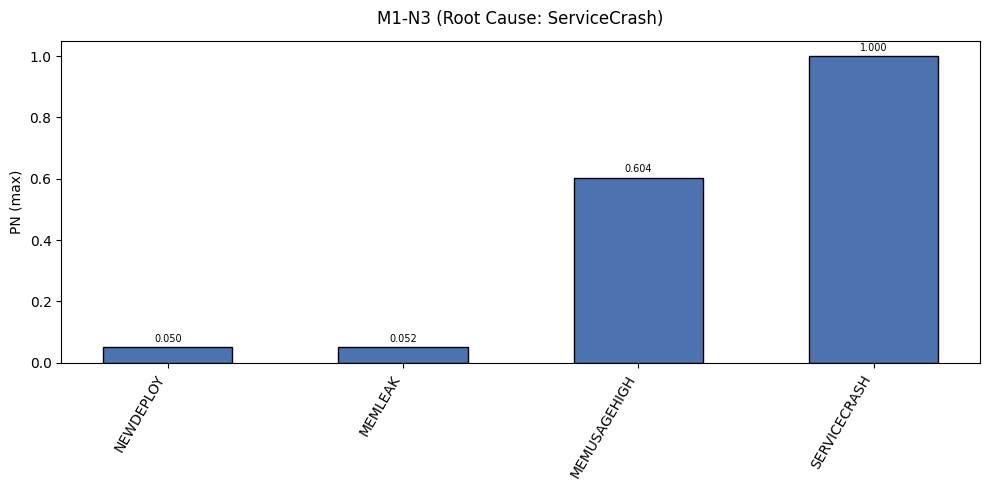

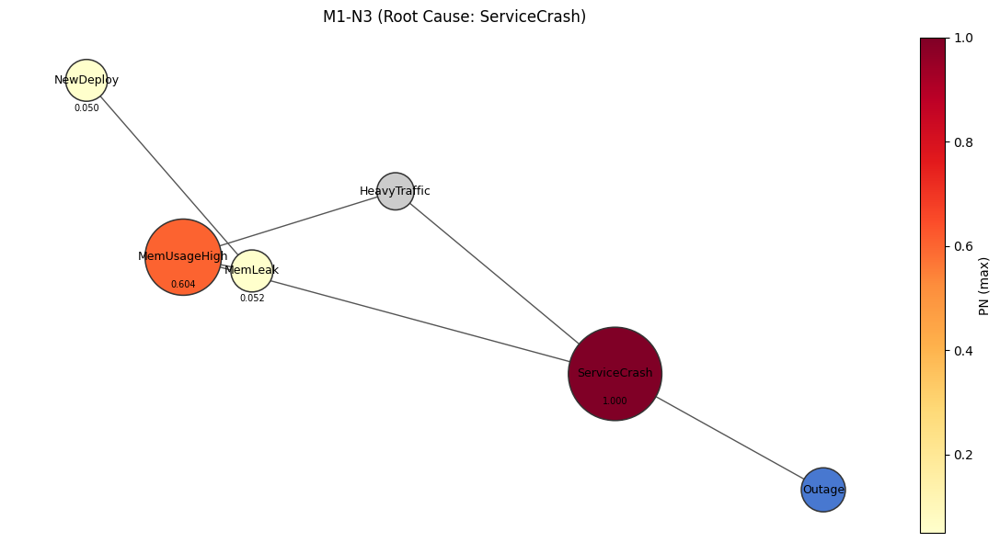

In [43]:
visualize_scores_and_graph(dot_graph_model1,
                            PN_M1N3,
                            which="max",
                            target="Outage",
                            score_name="PN",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

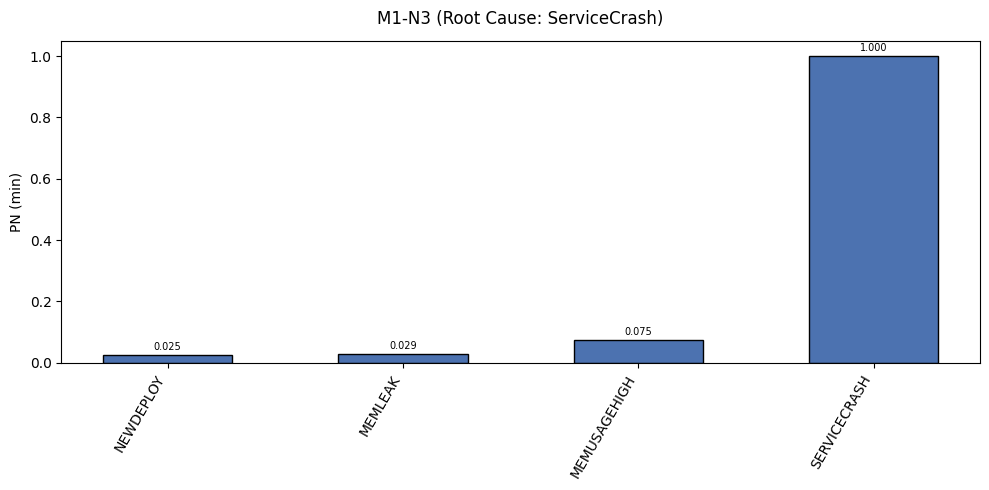

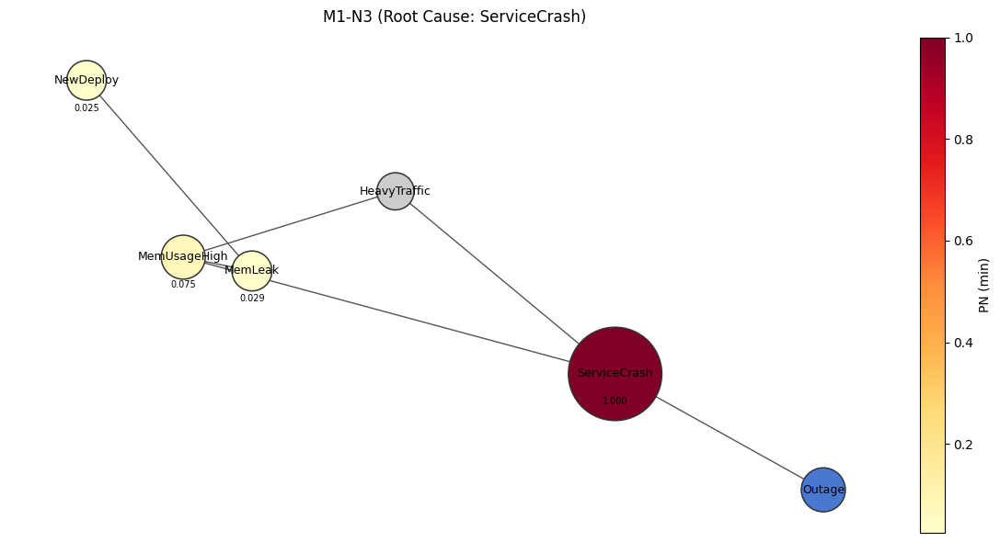

In [44]:
visualize_scores_and_graph(dot_graph_model1,
                            PN_M1N3,
                            which="min",
                            target="Outage",
                            score_name="PN",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

### PS

In [45]:
PS_M1N3 = {
	'NEWDEPLOY': [0.11497517273984093, 0.22761252096578902],
	'MEMLEAK': [0.13587223697723597, 0.24465822118118524],
	'MEMUSAGEHIGH': [0.17398389365342418, 0.2816291203953315],
	'SERVICECRASH': [0.89750269497339, 0.8976917912785615]
}

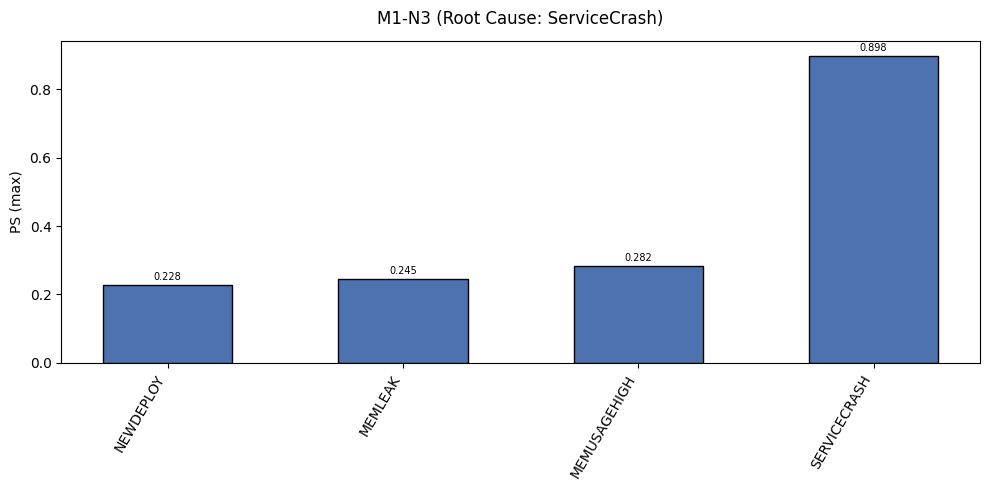

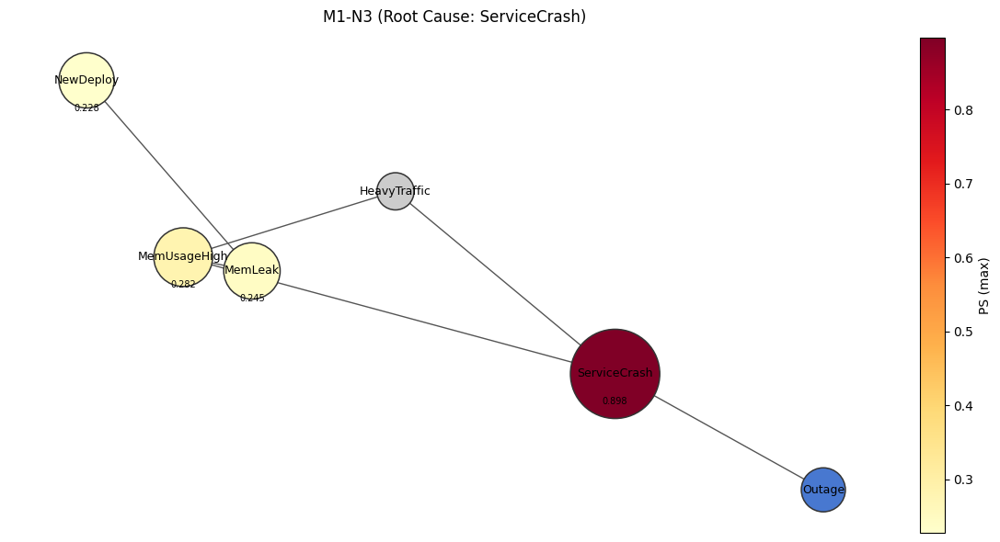

In [46]:
visualize_scores_and_graph(dot_graph_model1,
                            PS_M1N3,
                            which="max",
                            target="Outage",
                            score_name="PS",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

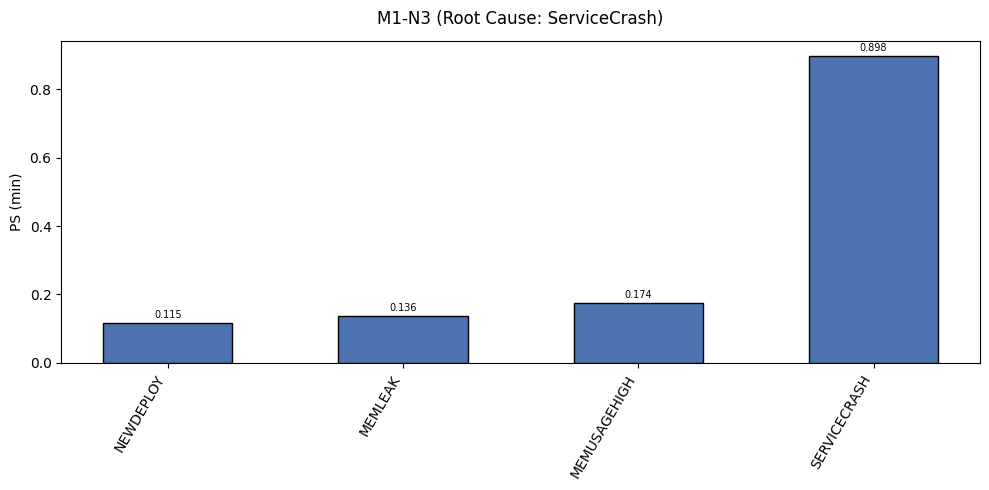

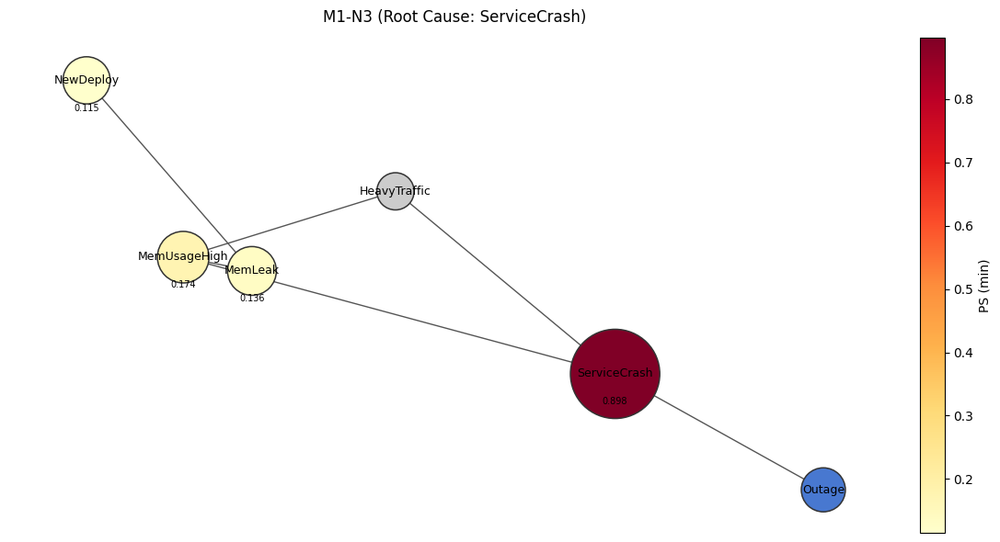

In [47]:
visualize_scores_and_graph(dot_graph_model1,
                            PS_M1N3,
                            which="min",
                            target="Outage",
                            score_name="PS",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

### PNS

In [48]:
PNS_M1N3 = {
	'NEWDEPLOY': [0.019611202653321787, 0.038823563974726444],
	'MEMLEAK': [0.022268198218800817, 0.04009709181435094],
	'MEMUSAGEHIGH': [0.043522083505531925, 0.18364757646369936],
	'SERVICECRASH': [0.897500494718766, 0.8975178099335873]
}

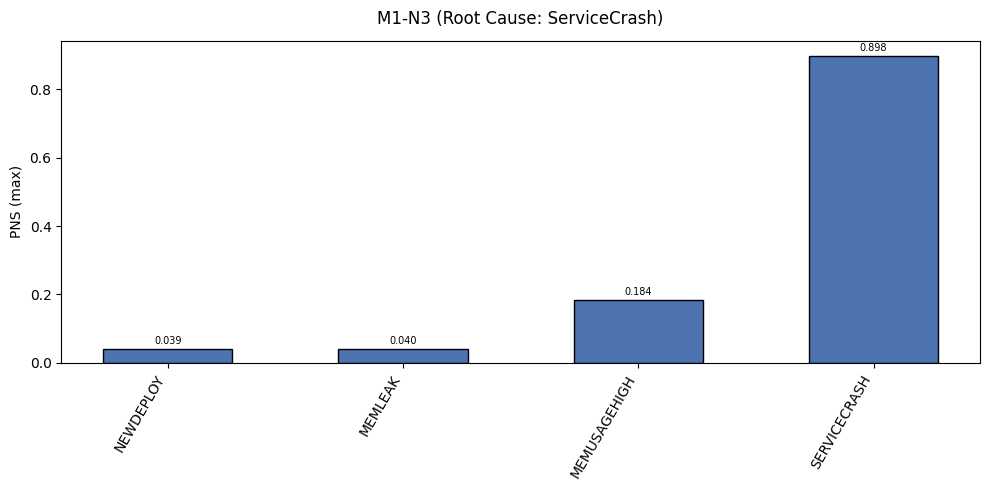

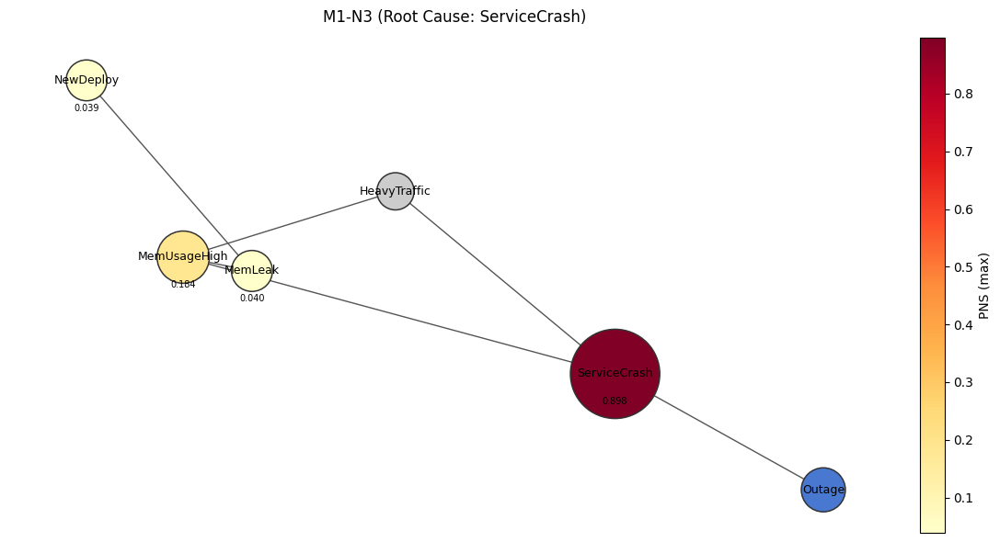

In [49]:
visualize_scores_and_graph(dot_graph_model1,
                            PNS_M1N3,
                            which="max",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

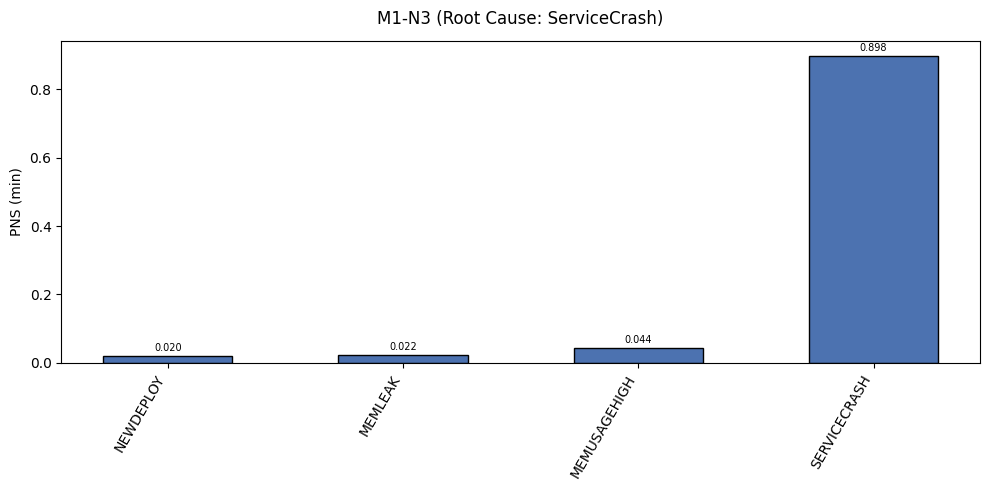

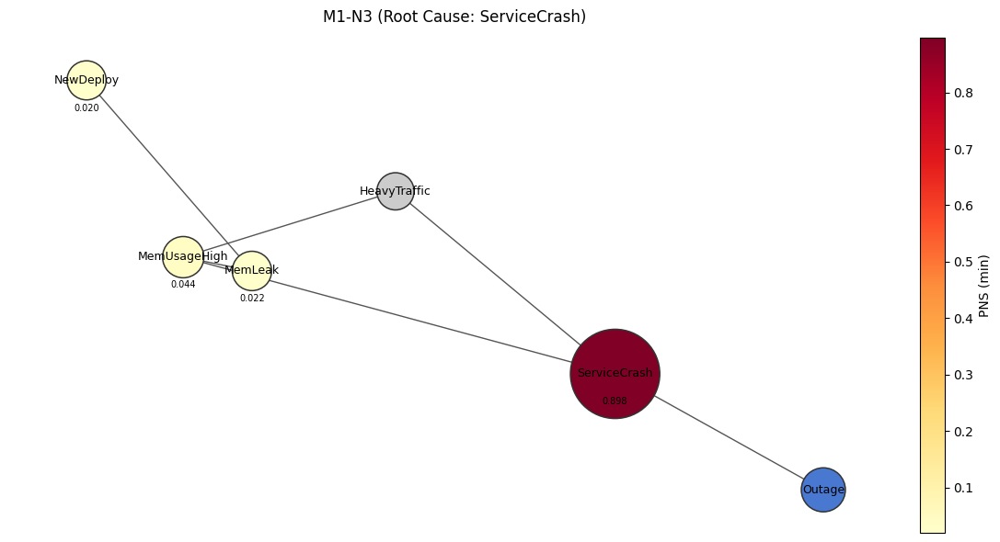

In [50]:
visualize_scores_and_graph(dot_graph_model1,
                            PNS_M1N3,
                            which="min",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

### Weak PN

In [51]:
Weak_PN_M1N3 = {
    'NEWDEPLOY': [0.17053951194461053, 0.17056996327836113],
    'MEMLEAK': [0.16386192001570482, 0.16389113992132384],
    'MEMUSAGEHIGH': [0.15599217462630227, 0.2965900697276394],
    'SERVICECRASH': [0.9998061903354086, 0.9999975484701759]
}

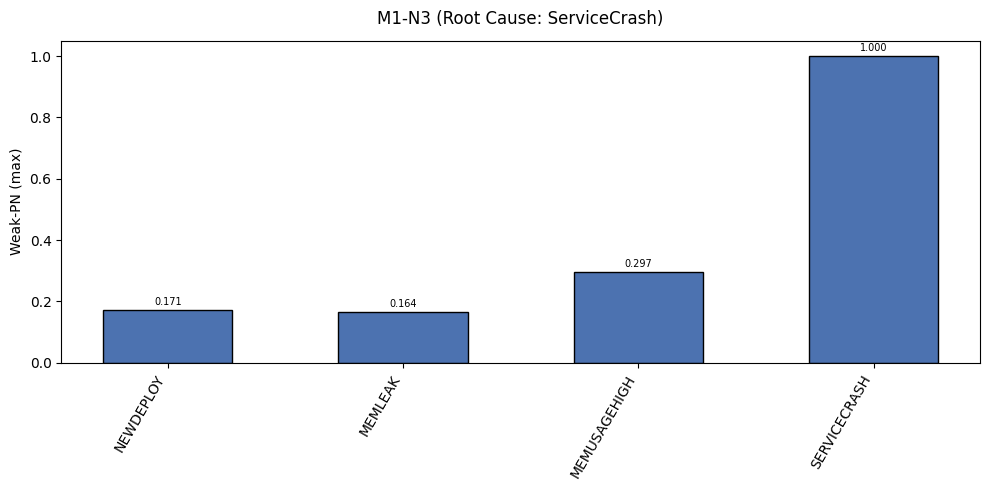

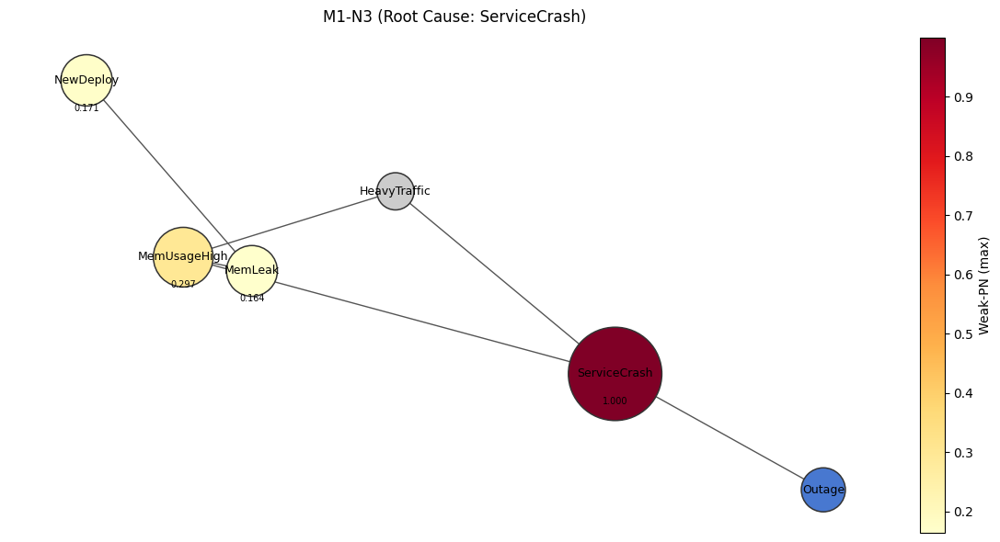

In [52]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PN_M1N3,
                            which="max",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

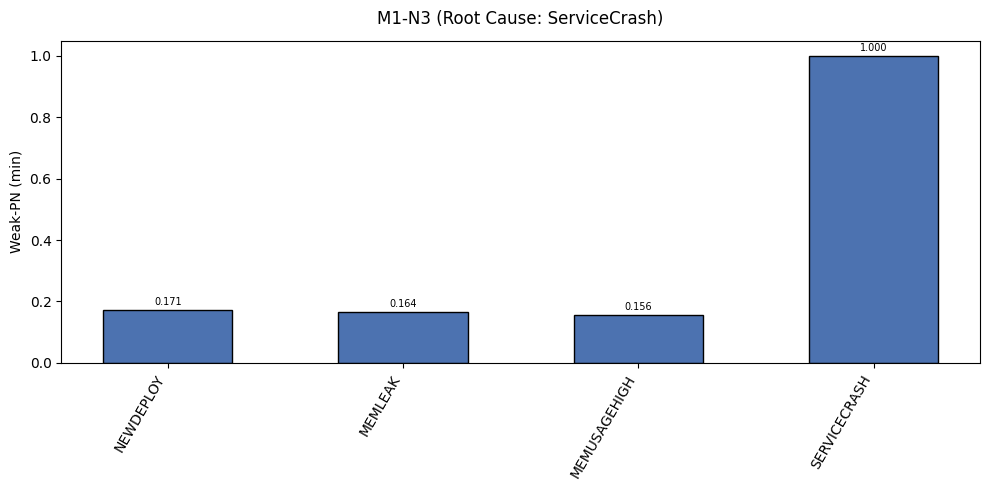

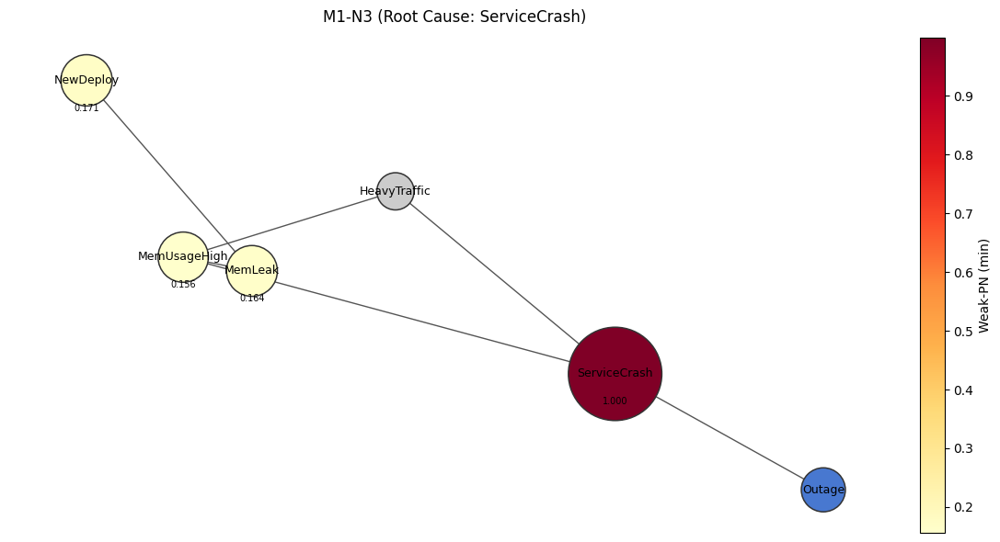

In [53]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PN_M1N3,
                            which="min",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

### Weak PS

In [54]:
Weak_PS_M1N3 = {
	'NEWDEPLOY': [0.7804146521038178, 0.7804560031330189],
	'MEMLEAK': [0.7695930671211878, 0.7696351929691049],
	'MEMUSAGEHIGH': [0.6732682170465877, 0.7629759513328369],
	'SERVICECRASH': [0.897500494718766, 0.8975178099335873]
}

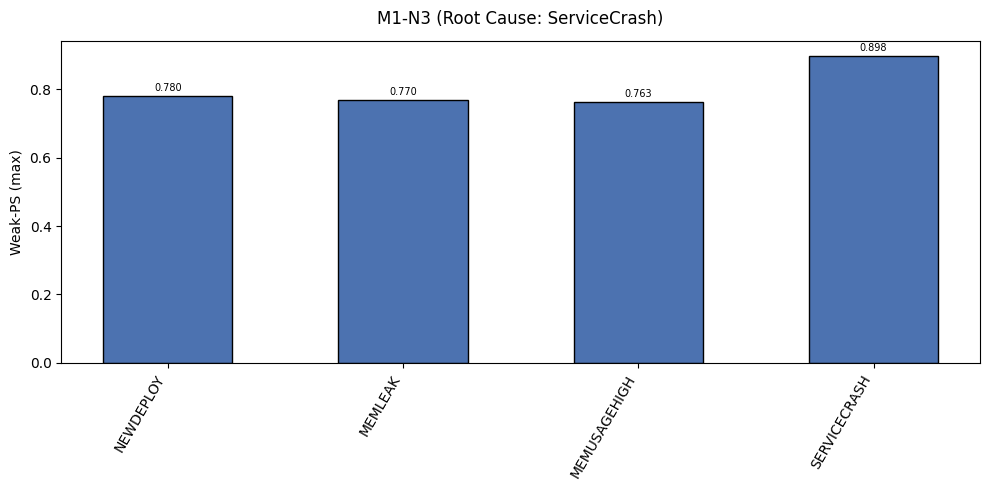

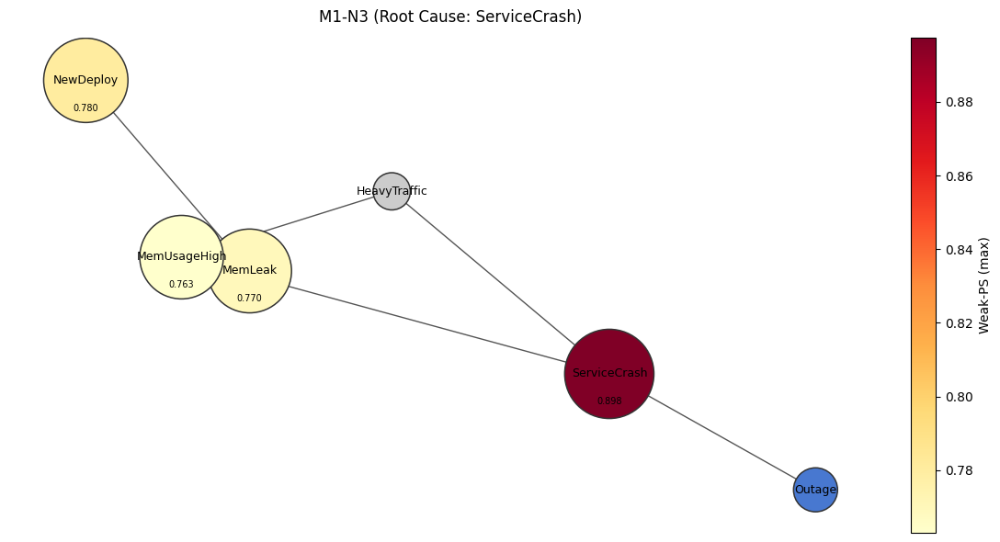

In [55]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PS_M1N3,
                            which="max",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

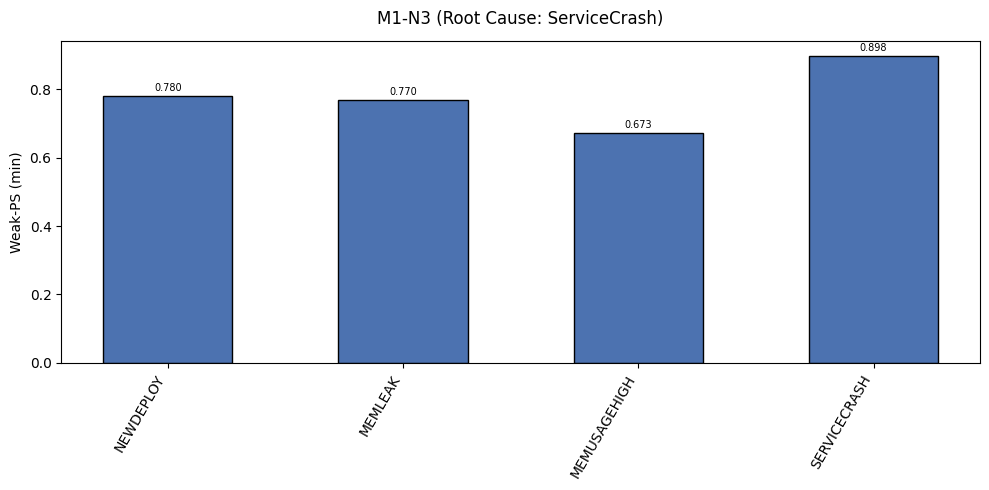

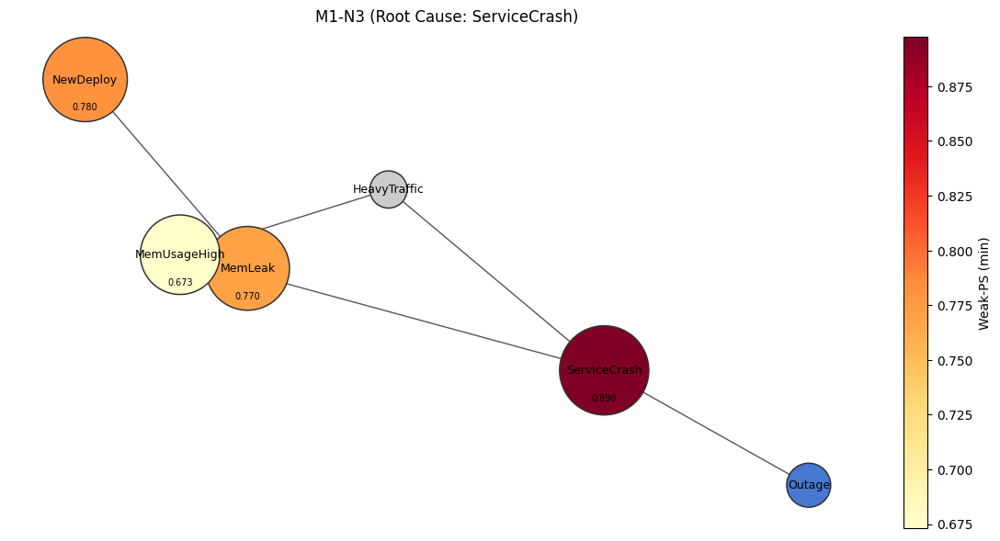

In [56]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PS_M1N3,
                            which="min",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M1-N3 (Root Cause: ServiceCrash)",
                            dag_title="M1-N3 (Root Cause: ServiceCrash)")

## M1 - Narrativa 4

### Root Cause: MemUsageHigh

### PN

In [57]:
PN_M1N4 = {
	'NEWDEPLOY': [0.0027819592753761486, 0.040868293005192076],
	'MEMLEAK': [0.0020136547450405845, 0.05228498465009873],
	'MEMUSAGEHIGH': [0.2158947103771238, 0.9036273293781203],
	'SERVICECRASH': [1.0, 1.0]
}

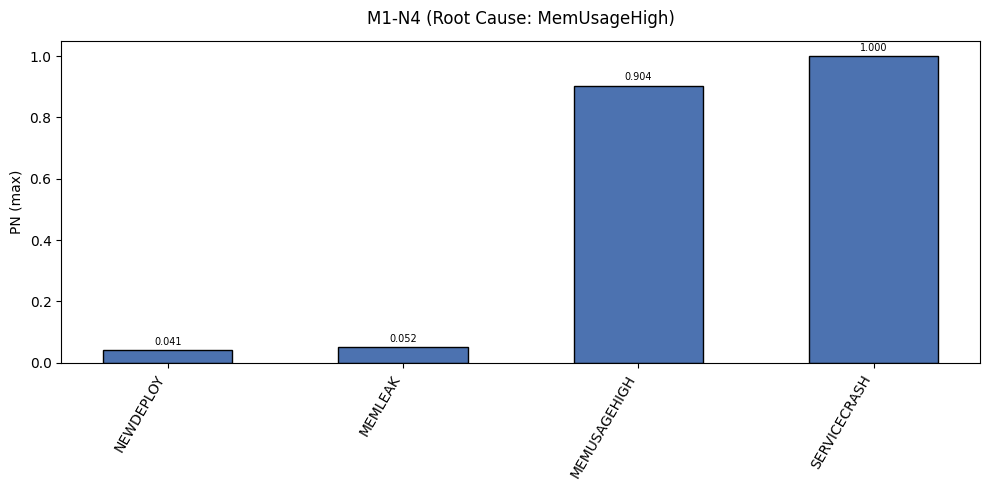

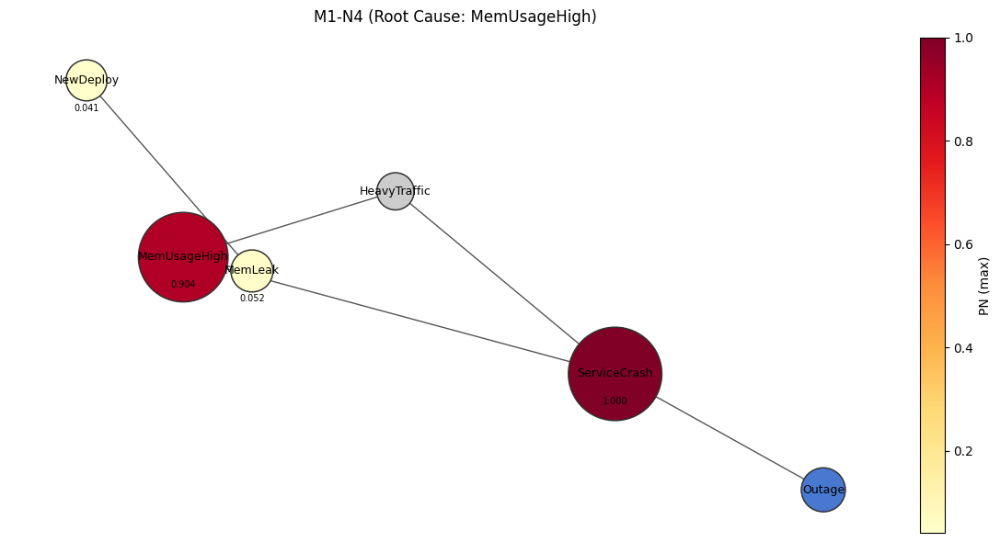

In [58]:
visualize_scores_and_graph(dot_graph_model1,
                            PN_M1N4,
                            which="max",
                            target="Outage",
                            score_name="PN",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

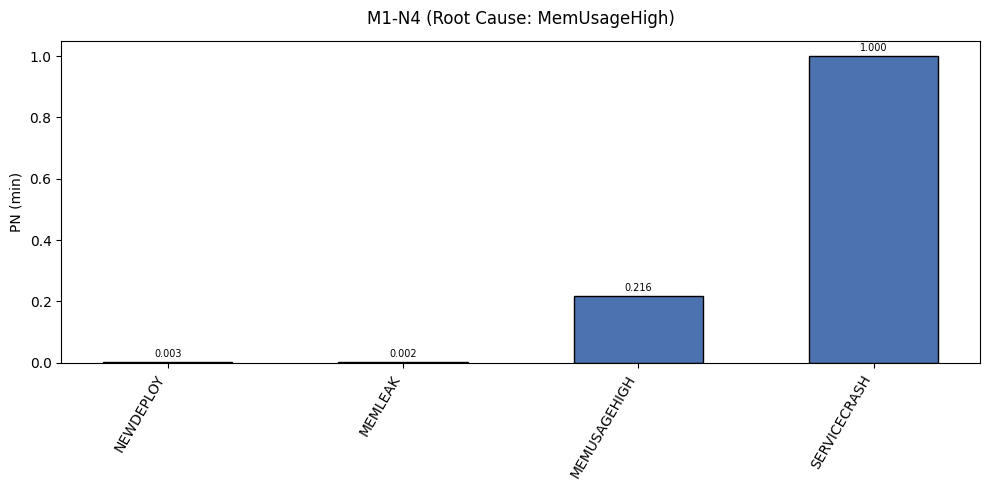

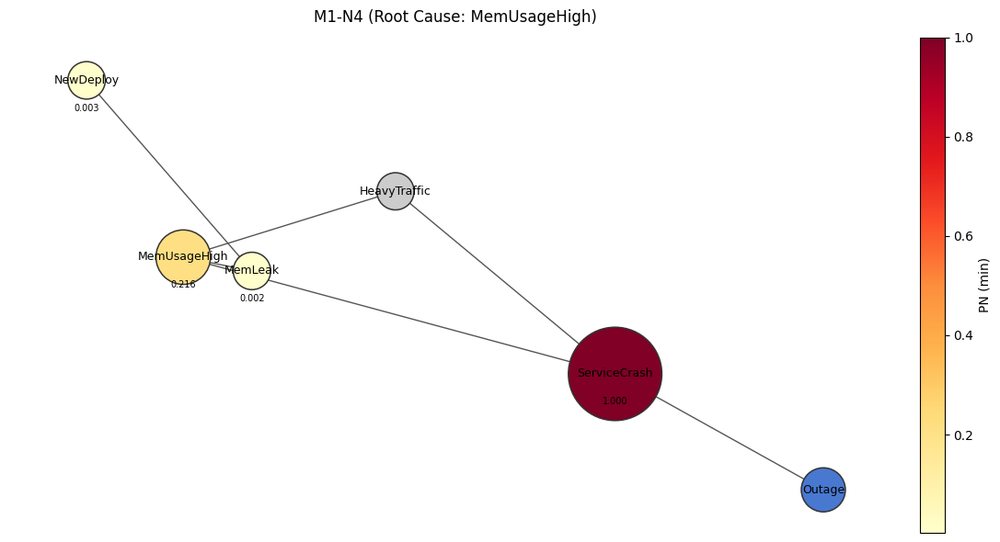

In [59]:
visualize_scores_and_graph(dot_graph_model1,
                            PN_M1N4,
                            which="min",
                            target="Outage",
                            score_name="PN",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

### PS

In [60]:
PS_M1N4 = {
	'NEWDEPLOY': [0.007050540554636546, 0.10351739854200342],
	'MEMLEAK': [0.005158423645428397, 0.13355512798041067],
	'MEMUSAGEHIGH': [0.38714113734817845, 0.7827819221252426],
	'SERVICECRASH': [0.8962568170563513, 0.896256817436665]
}

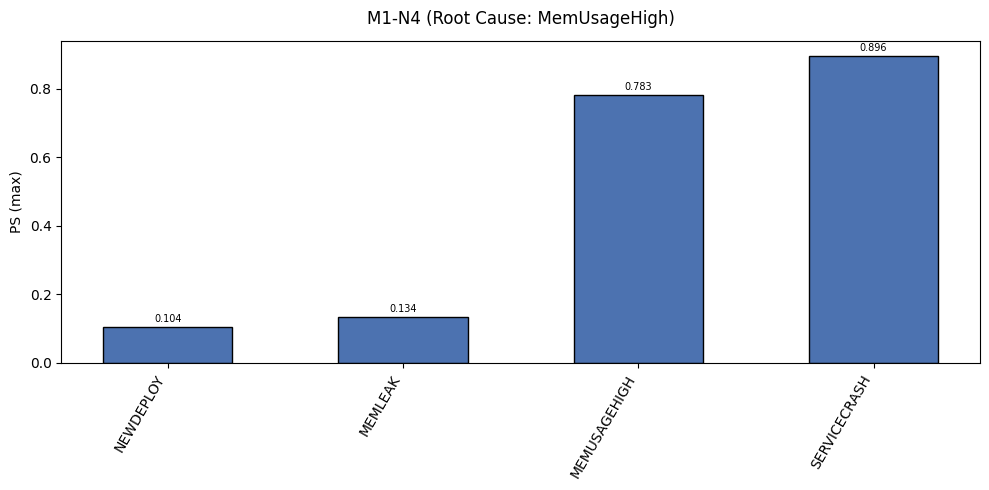

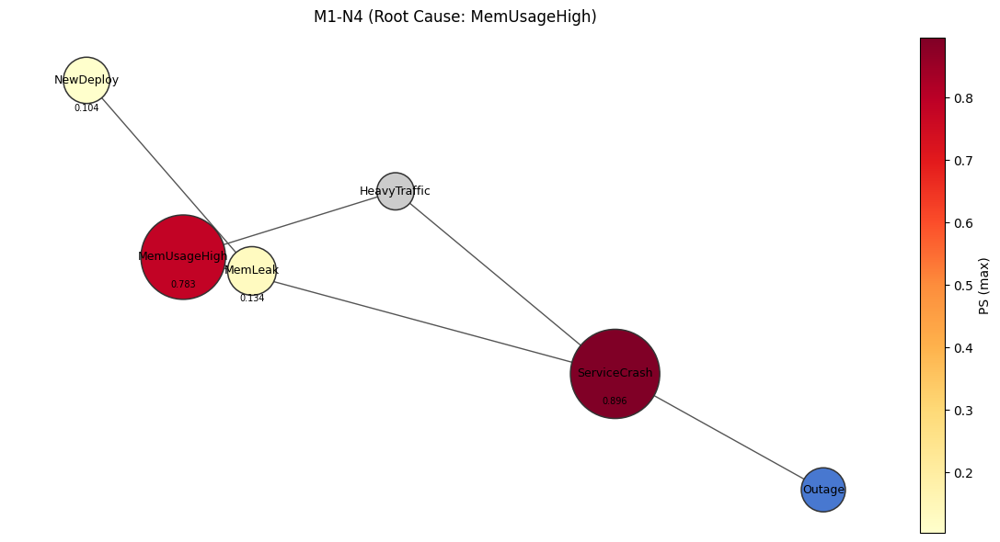

In [61]:
visualize_scores_and_graph(dot_graph_model1,
                            PS_M1N4,
                            which="max",
                            target="Outage",
                            score_name="PS",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

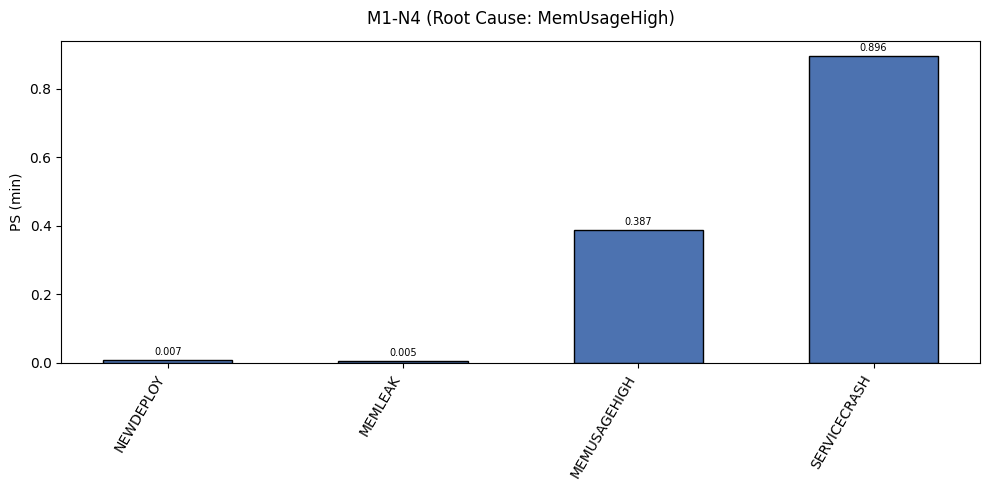

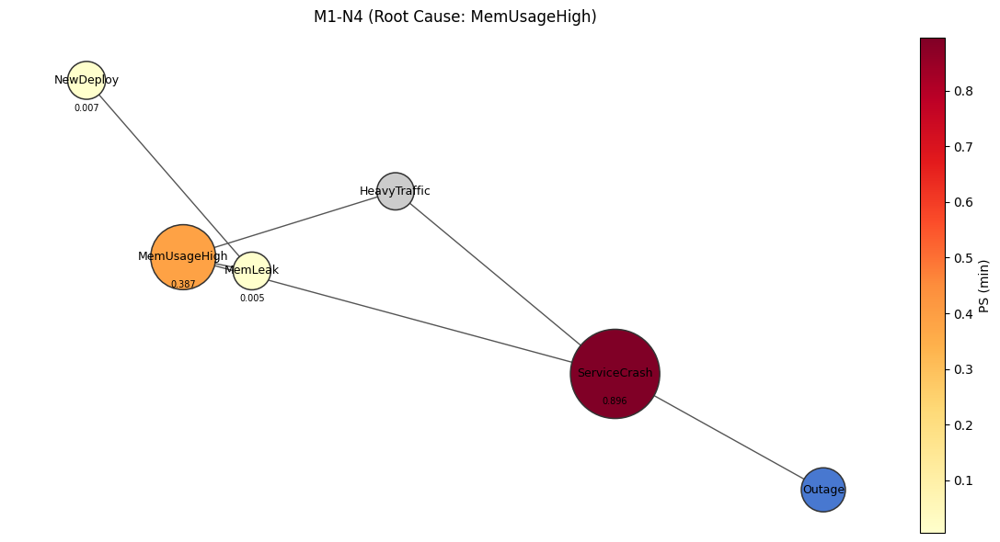

In [62]:
visualize_scores_and_graph(dot_graph_model1,
                            PS_M1N4,
                            which="min",
                            target="Outage",
                            score_name="PS",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

### PNS

In [63]:
PNS_M1N4 = {
	'NEWDEPLOY': [0.0019059231536086819, 0.027968229127065963],
	'MEMLEAK': [0.0013669966384408743, 0.035256278205256474],
	'MEMUSAGEHIGH': [0.18277349627576564, 0.6704249857615121],
	'SERVICECRASH': [0.8962568170553481, 0.8962568171464198]
}

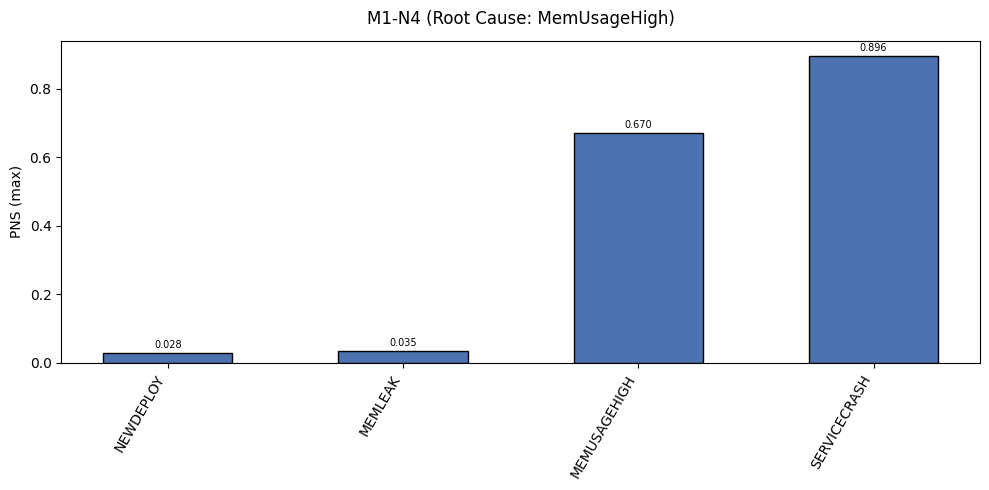

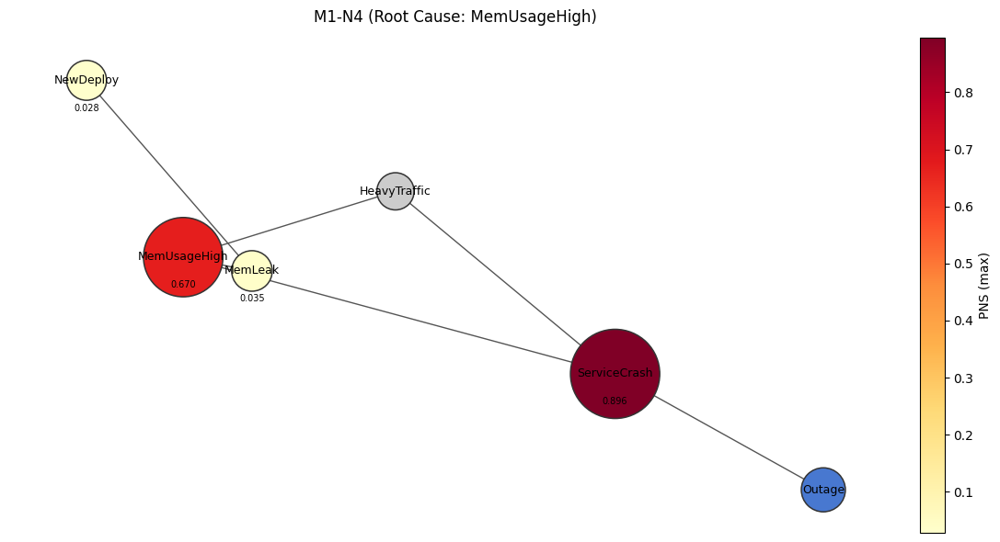

In [64]:
visualize_scores_and_graph(dot_graph_model1,
                            PNS_M1N4,
                            which="max",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

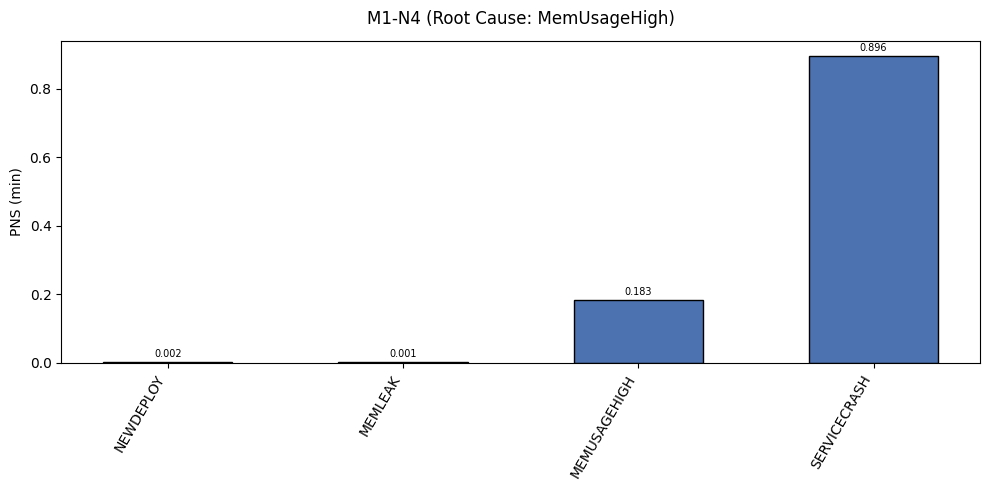

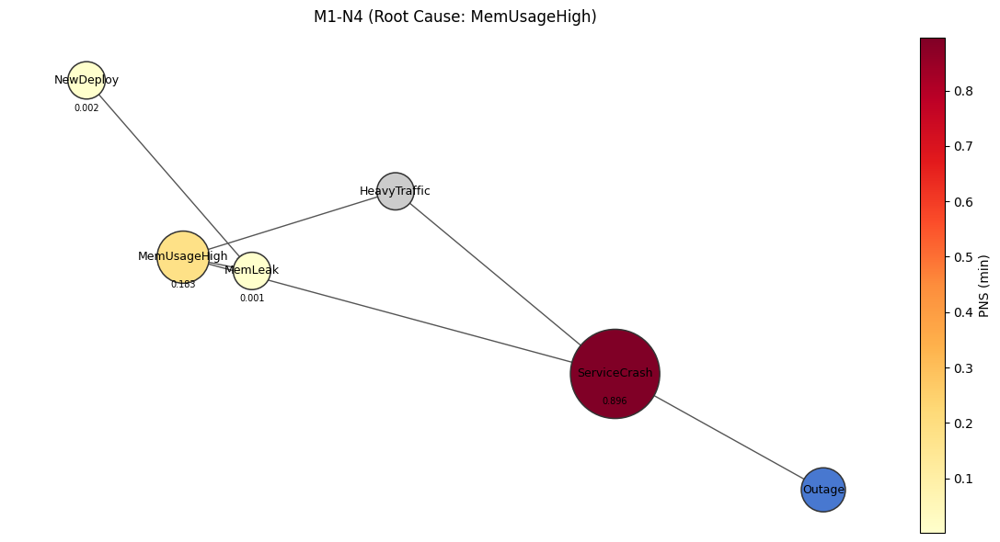

In [65]:
visualize_scores_and_graph(dot_graph_model1,
                            PNS_M1N4,
                            which="min",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

### Weak PN

In [66]:
Weak_PN_M1N4 = {
	'NEWDEPLOY': [0.2699986688502474, 0.2706392072674833],
	'MEMLEAK': [0.26365438371546296, 0.265002786200463],
	'MEMUSAGEHIGH': [0.35599353320618976, 0.8369960557543299],
	'SERVICECRASH': [0.9999999996761585, 0.9999999999988807]
}

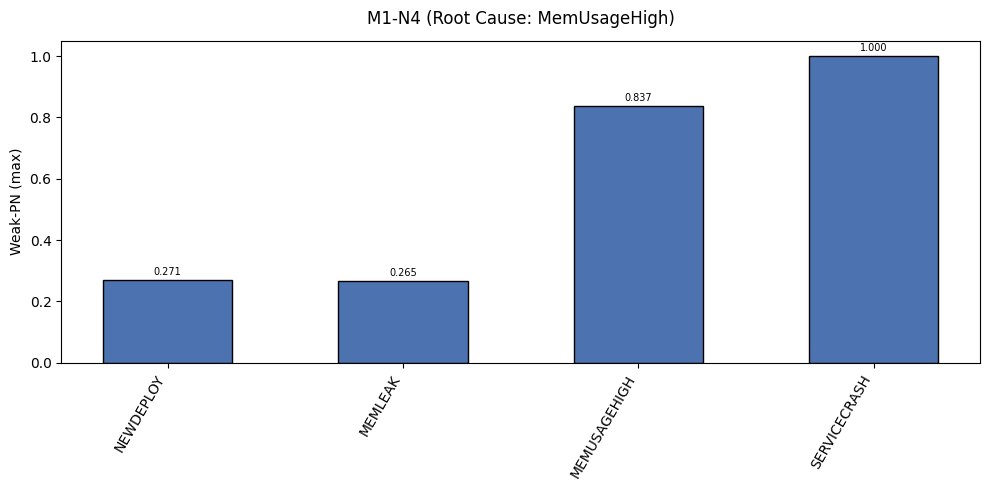

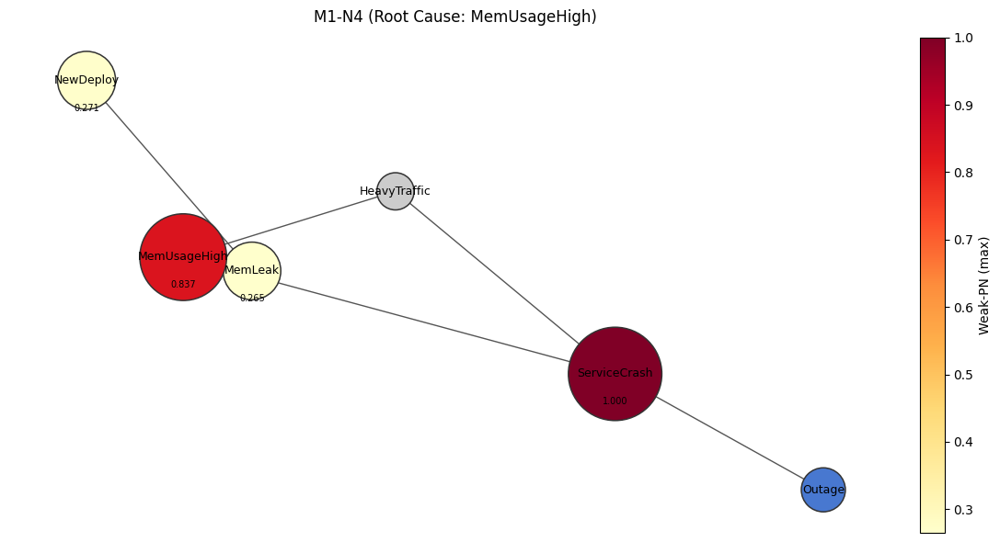

In [67]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PN_M1N4,
                            which="max",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

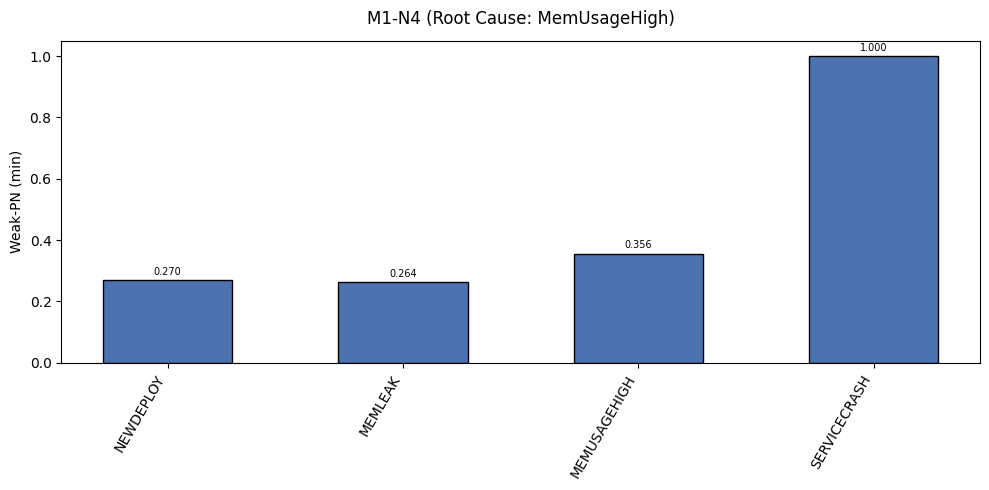

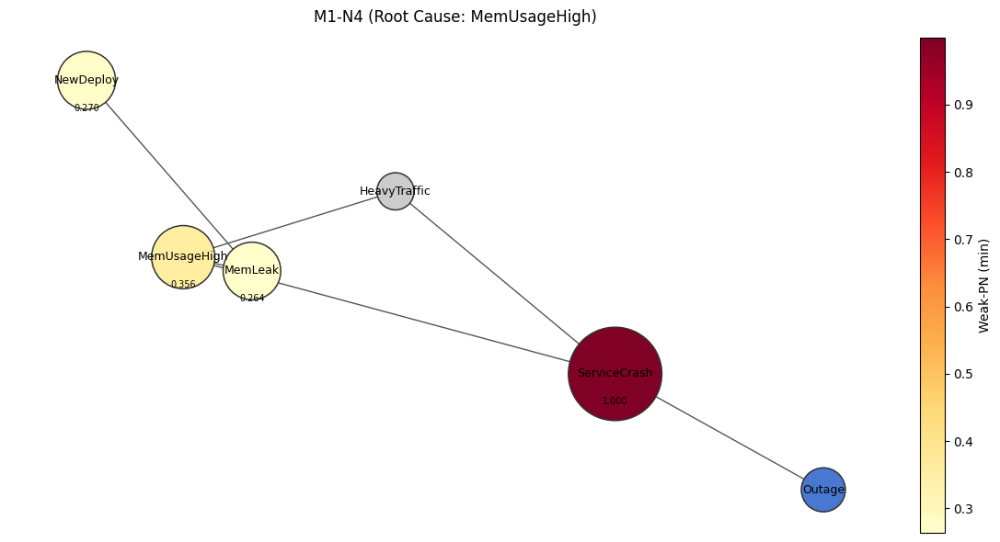

In [68]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PN_M1N4,
                            which="min",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

### Weak PS

In [69]:
Weak_PS_M1N4 = {
	'NEWDEPLOY': [0.683442884923238, 0.6879970900938379],
	'MEMLEAK': [0.6731621730576293, 0.678863465451384],
	'MEMUSAGEHIGH': [0.7295803815939687, 0.7652512518327822],
	'SERVICECRASH': [0.8962568170553481, 0.8962568171464198]
}

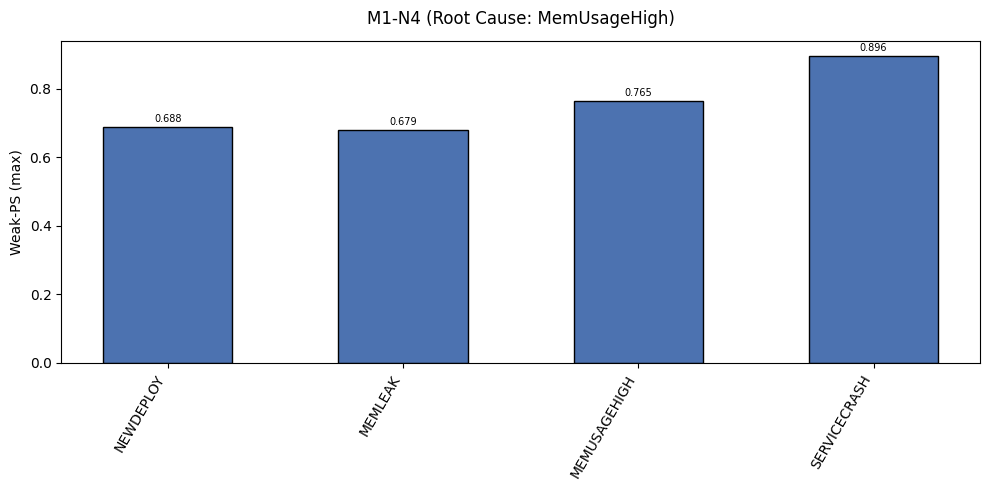

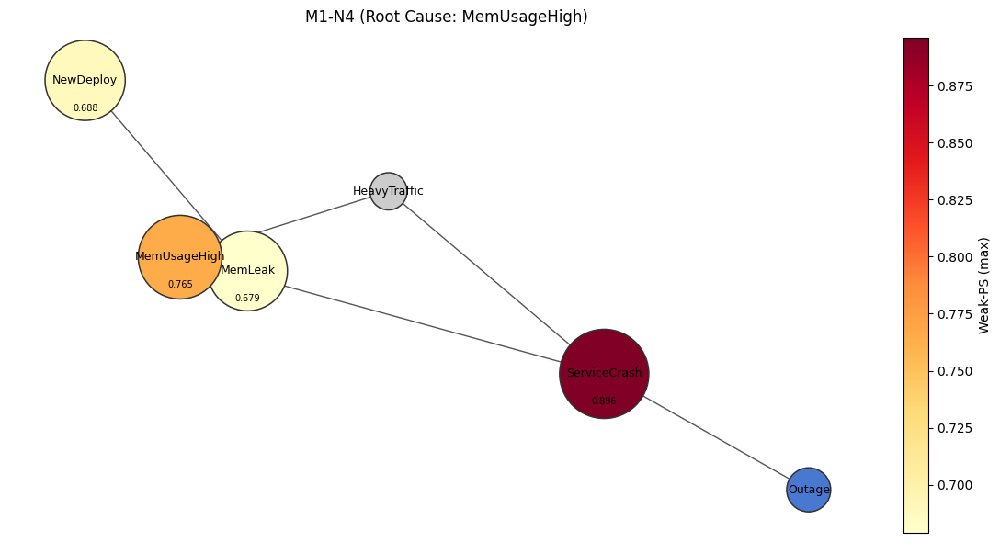

In [70]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PS_M1N4,
                            which="max",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

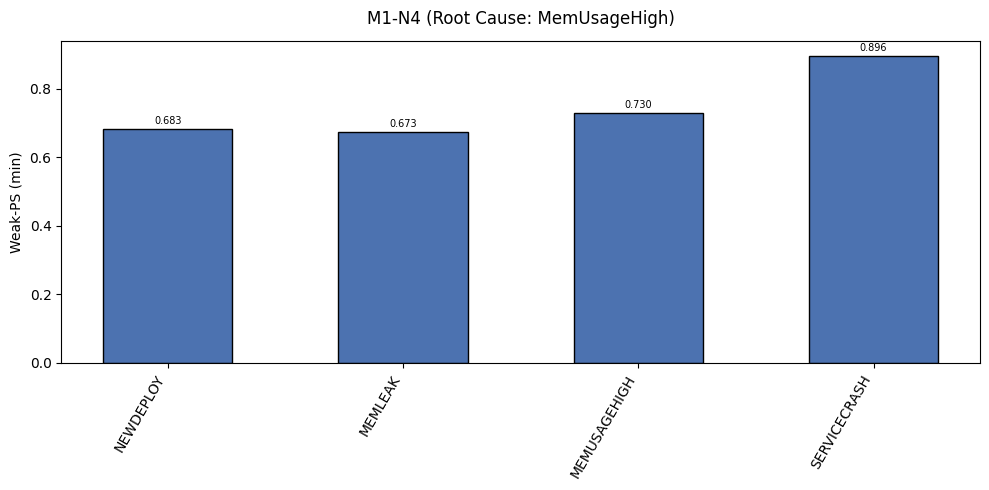

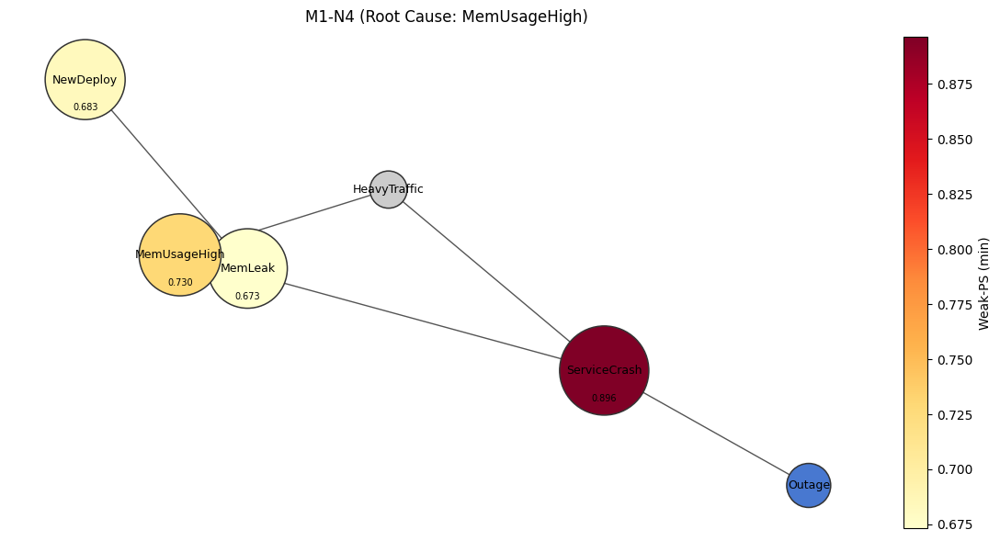

In [71]:
visualize_scores_and_graph(dot_graph_model1,
                            Weak_PS_M1N4,
                            which="min",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M1-N4 (Root Cause: MemUsageHigh)",
                            dag_title="M1-N4 (Root Cause: MemUsageHigh)")

# Modelo 2

In [72]:
dot_graph_model2 = """
digraph {
    "DB_Change"      -> "DB_Latency";
    "DB_Latency"     -> "MS-B_Latency";
    "MS-B_Latency"   -> "MS-B_Error";
    "MS-B_Latency"   -> "MS-A_Latency";
    "MS-B_Error"     -> "MS-A_Error";
    "MS-A_Latency"   -> "MS-A_Threads";
    "MS-A_Threads"   -> "MS-A_Crash";
    "MS-A_Error"     -> "Outage";
    "MS-A_Crash"     -> "Outage";
    "HeavyTraffic"   -> "MS-B_Latency";
    "HeavyTraffic"   -> "MS-A_Latency";
}
"""

## M2 - Narrativa 1

### Root Cause: DB_Latency

#### PN

In [73]:
PN_M2N1 = {
	'DB_CHANGE': [0.023804973298688453, 0.045325031708796065],
	'DB_LATENCY': [0.4738851834063632, 0.5453305508461286],
	'MS-B_LATENCY': [0.5925453011281836, 0.698807450212071],
	'MS-B_ERROR': [0.37920267261592355, 0.5091858376399644],
	'MS-A_LATENCY': [0.21715069725143, 0.34618763669643005],
	'MS-A_ERROR': [0.4593414823431737, 0.5904530107335885],
	'MS-A_THREADS': [0.2889357149284146, 0.4263967007325044],
	'MS-A_CRASH': [0.37920058881487656, 0.5357138218750405]
}

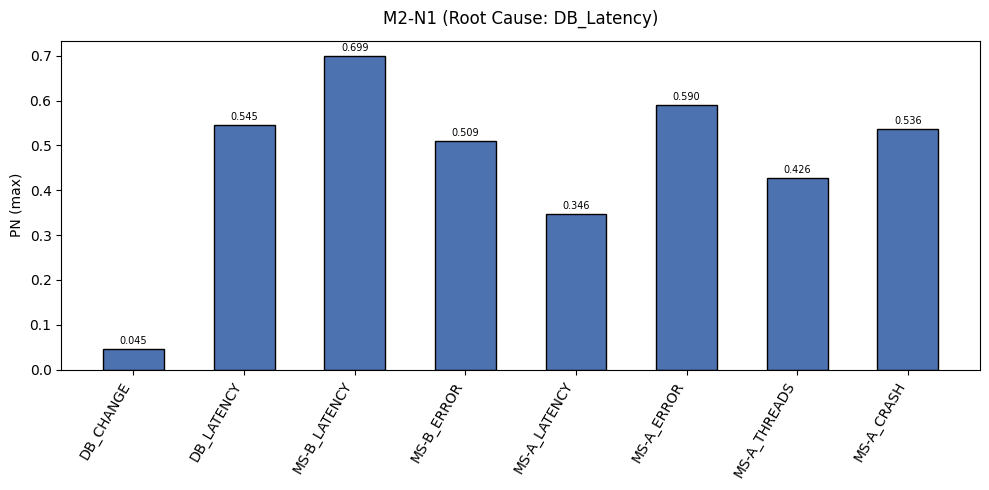

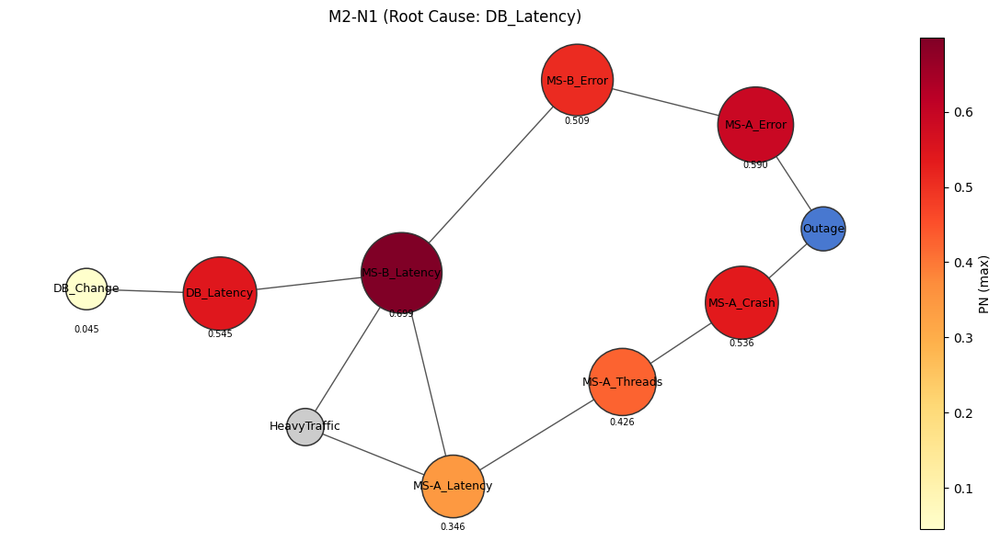

In [74]:
visualize_scores_and_graph(dot_graph_model2,
                            PN_M2N1,
                            which="max",
                            target="Outage",
                            score_name="PN",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

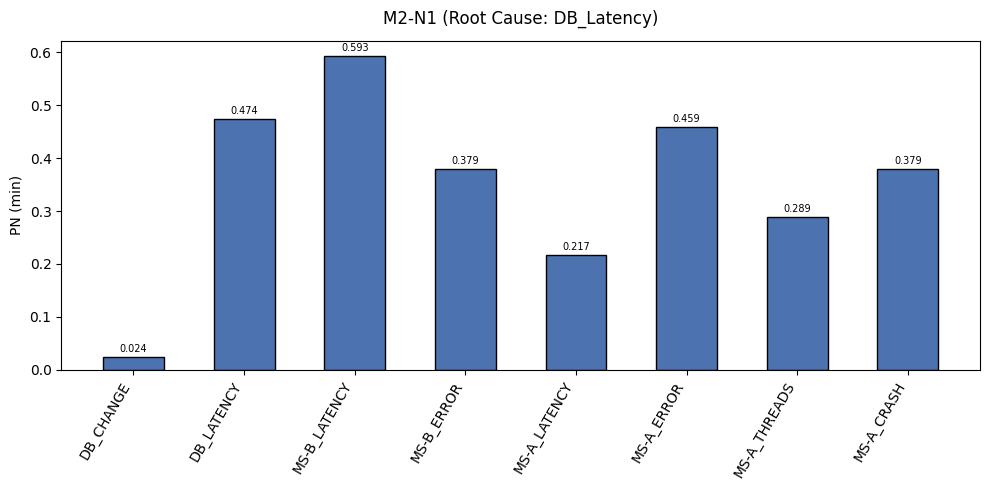

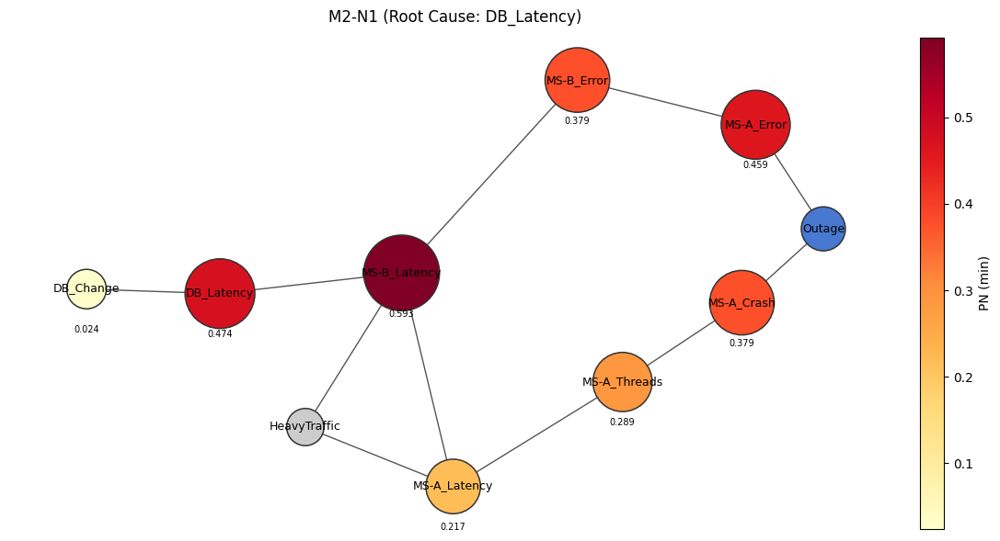

In [75]:
visualize_scores_and_graph(dot_graph_model2,
                            PN_M2N1,
                            which="min",
                            target="Outage",
                            score_name="PN",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

#### PS

In [76]:
PS_M2N1 = {
	'DB_CHANGE': [0.035500275831636174, 0.06759938869188724],
	'DB_LATENCY': [0.4591652420621551, 0.5281272679483887],
	'MS-B_LATENCY': [0.5213888118420175, 0.6367194788543734],
	'MS-B_ERROR': [0.5816684961615147, 0.6968279437683566],
	'MS-A_LATENCY': [0.4200035909128258, 0.534142932334359],
	'MS-A_ERROR': [0.6814856945493402, 0.8014691313849426],
	'MS-A_THREADS': [0.5103652750846351, 0.6468020620906336],
	'MS-A_CRASH': [0.6301516741182215, 0.7885060687147804]
}

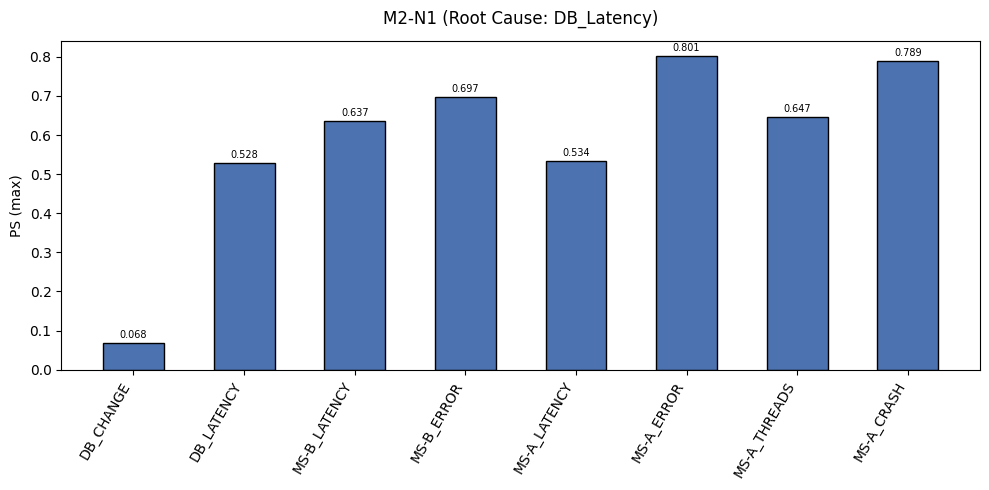

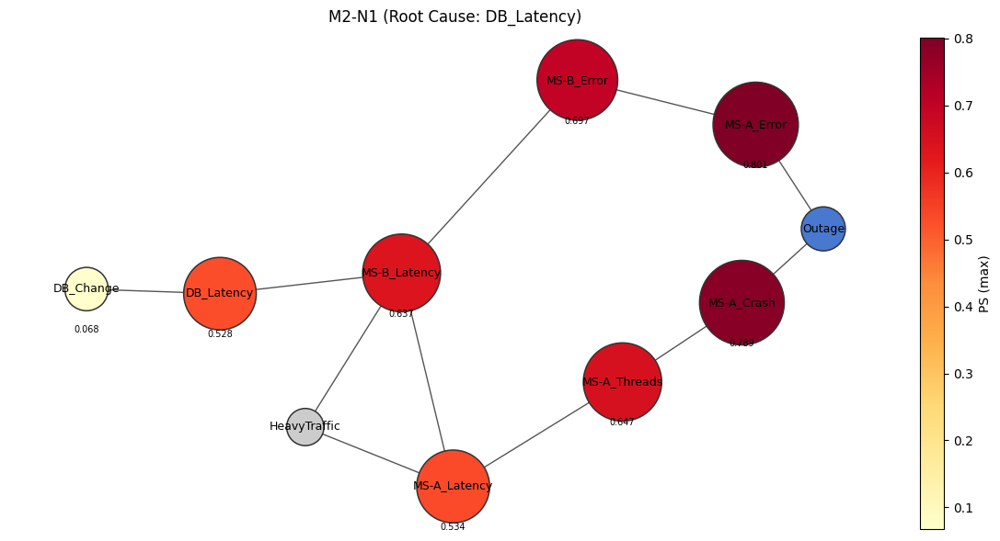

In [77]:
visualize_scores_and_graph(dot_graph_model2,
                            PS_M2N1,
                            which="max",
                            target="Outage",
                            score_name="PS",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

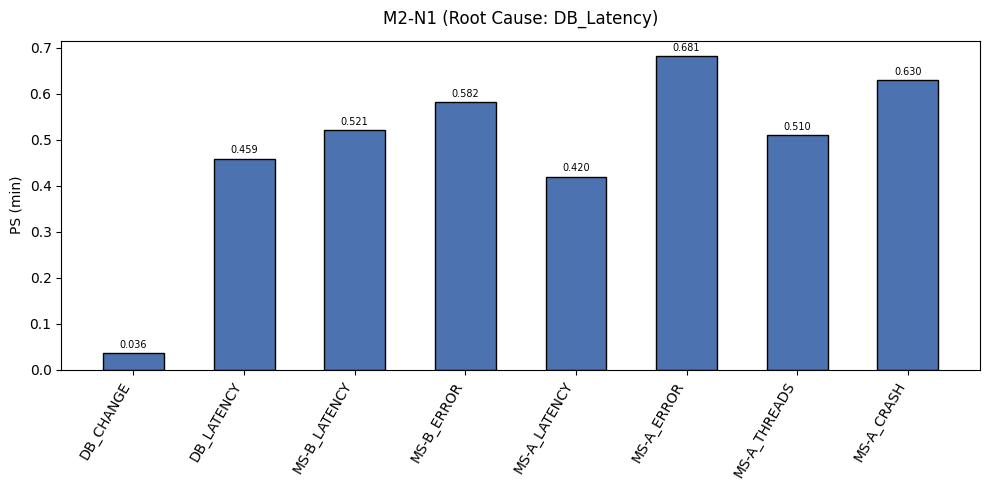

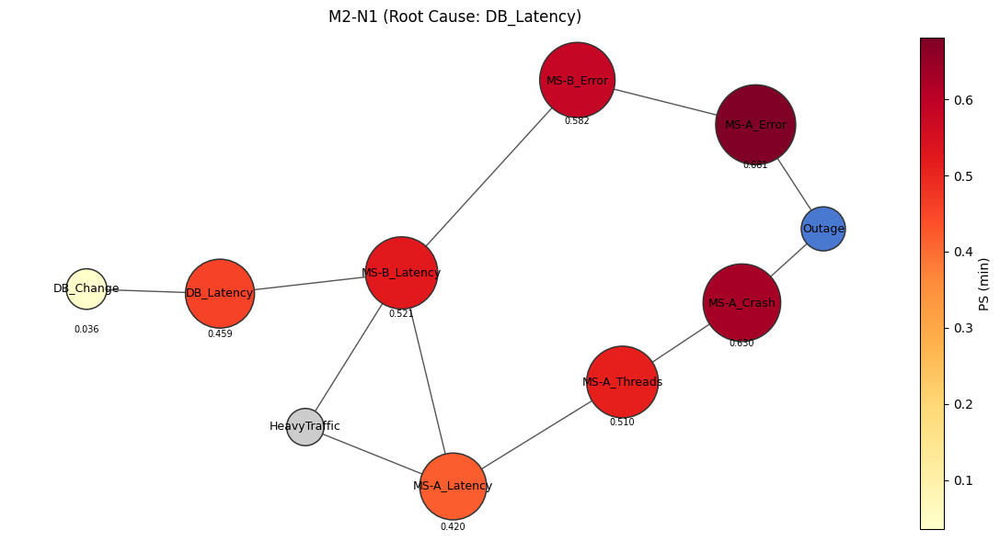

In [78]:
visualize_scores_and_graph(dot_graph_model2,
                            PS_M2N1,
                            which="min",
                            target="Outage",
                            score_name="PS",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

#### PNS

In [79]:
PNS_M2N1 = {
	'DB_CHANGE': [0.013867963215036198, 0.02640651873720881],
	'DB_LATENCY': [0.29523127459522336, 0.3397040118735281],
	'MS-B_LATENCY': [0.4010868314298722, 0.46088446289646307],
	'MS-B_ERROR': [0.29727812986315366, 0.3838704798358124],
	'MS-A_LATENCY': [0.17793077157065537, 0.26172979692814574],
	'MS-A_ERROR': [0.376680787355553, 0.46664668468572323],
	'MS-A_THREADS': [0.2370091646822016, 0.32822474026111337],
	'MS-A_CRASH': [0.3170226189137003, 0.4232996633031528]
}

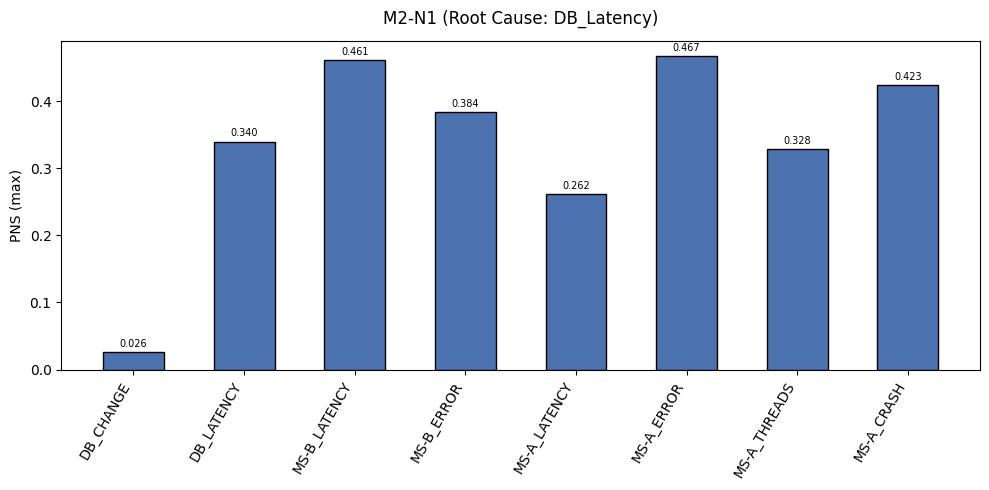

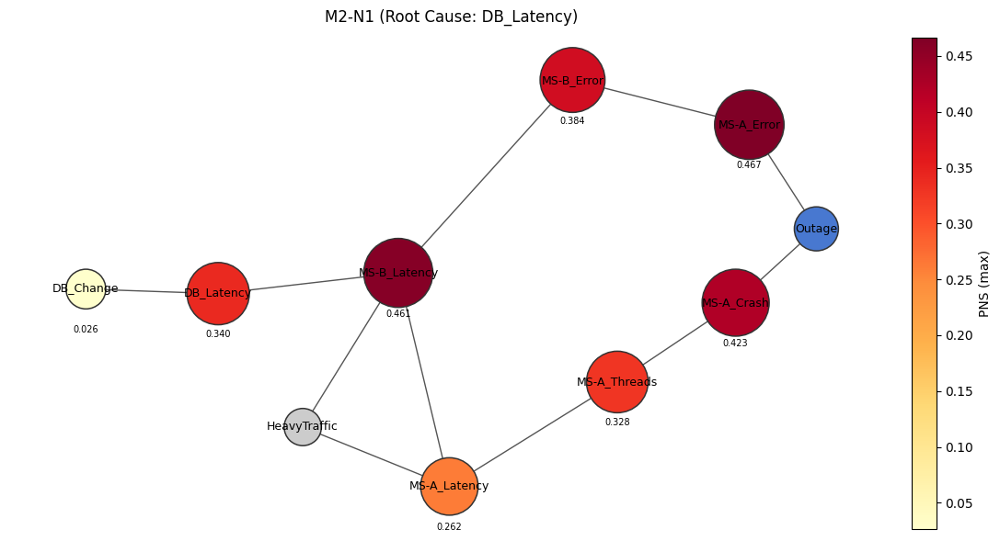

In [80]:
visualize_scores_and_graph(dot_graph_model2,
                            PNS_M2N1,
                            which="max",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

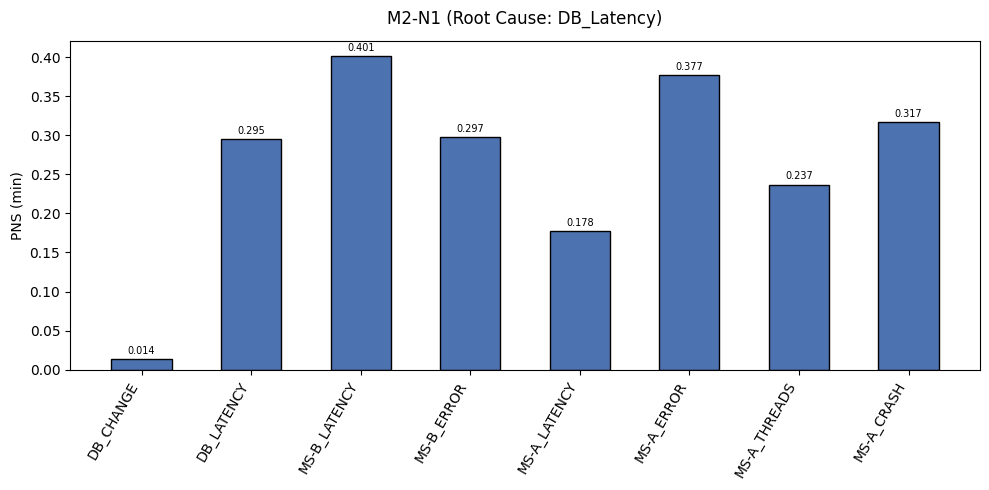

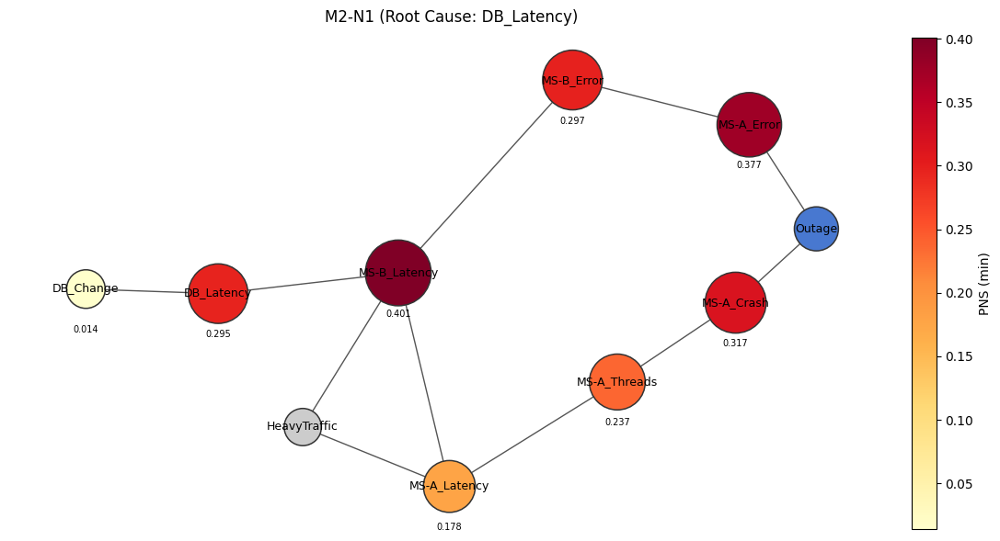

In [81]:
visualize_scores_and_graph(dot_graph_model2,
                            PNS_M2N1,
                            which="min",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

#### Weak-PN

In [82]:
Weak_PN_M2N1 = {
	'DB_CHANGE': [0.39062015996447347, 0.3907111297064689],
	'DB_LATENCY': [0.642621460887398, 0.6432893462855185],
	'MS-B_LATENCY': [0.673436742214392, 0.7213756229826793],
	'MS-B_ERROR': [0.5415618795133906, 0.5416783546139008],
	'MS-A_LATENCY': [0.4797566372830811, 0.4798435445863437],
	'MS-A_ERROR': [0.5713278805960402, 0.5714490324926749],
	'MS-A_THREADS': [0.4998176260008548, 0.49990466760550545],
	'MS-A_CRASH': [0.525856269950466, 0.5259434858748292]
}

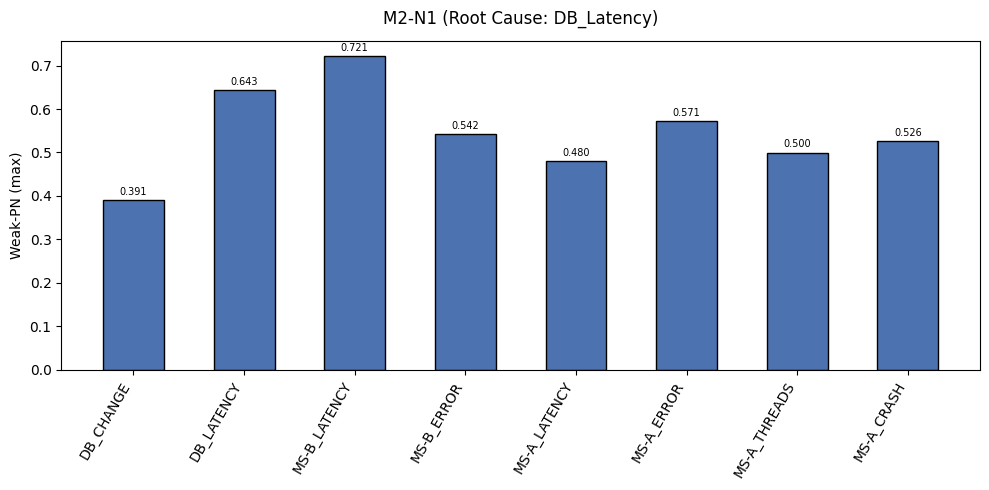

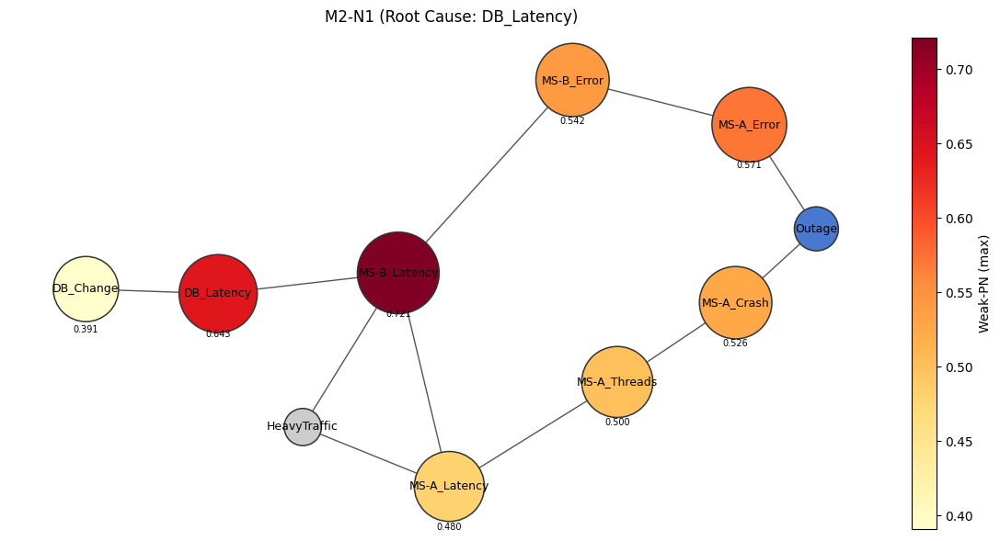

In [83]:
visualize_scores_and_graph(dot_graph_model2,
                            Weak_PN_M2N1,
                            which="max",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

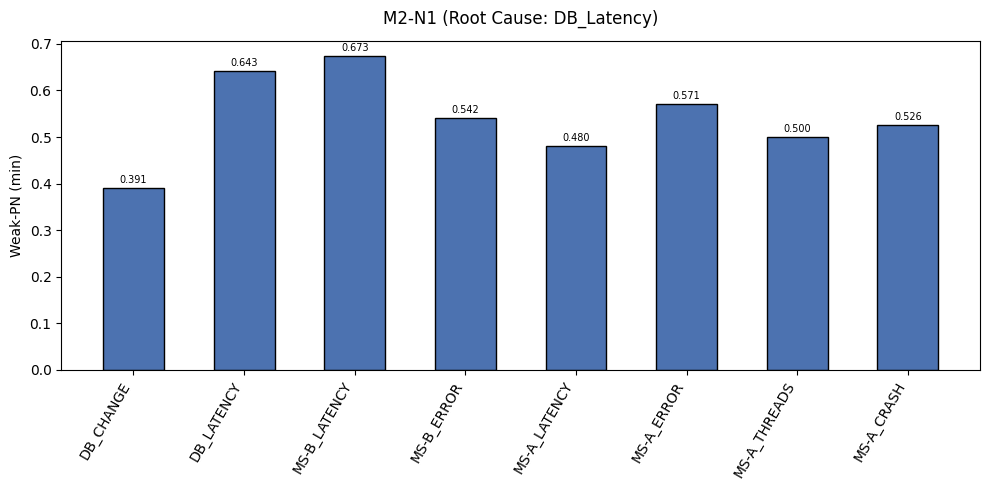

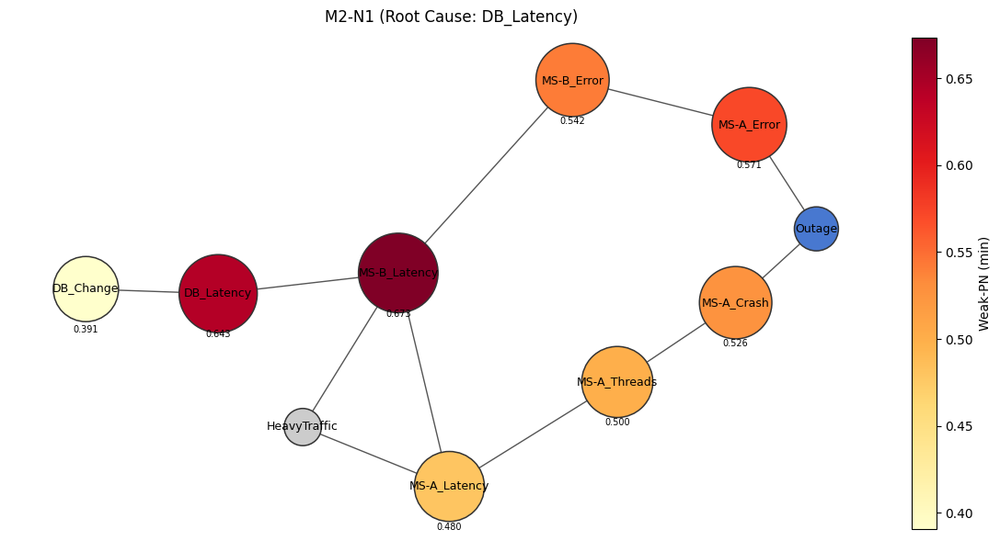

In [84]:
visualize_scores_and_graph(dot_graph_model2,
                            Weak_PN_M2N1,
                            which="min",
                            target="Outage",
                            score_name="Weak-PN",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

#### Weak-PS

In [85]:
Weak_PS_M2N1 = {
	'DB_CHANGE': [0.5825126546286501, 0.5826570906992401],
	'DB_LATENCY': [0.6229322955525733, 0.6230187735609921],
	'MS-B_LATENCY': [0.6645363025106997, 0.6739380004755146],
	'MS-B_ERROR': [0.6968153067170962, 0.6968943158845792],
	'MS-A_LATENCY': [0.6682621561822634, 0.6683480719757483],
	'MS-A_ERROR': [0.7477650801235172, 0.7478364808185399],
	'MS-A_THREADS': [0.6979055755983573, 0.6979912929407329],
	'MS-A_CRASH': [0.7386568585972687, 0.73874230312573]
}

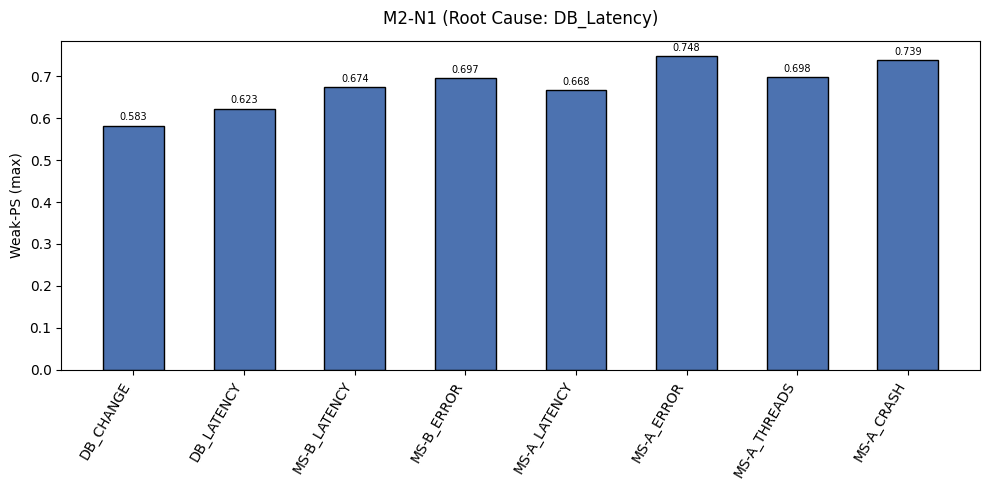

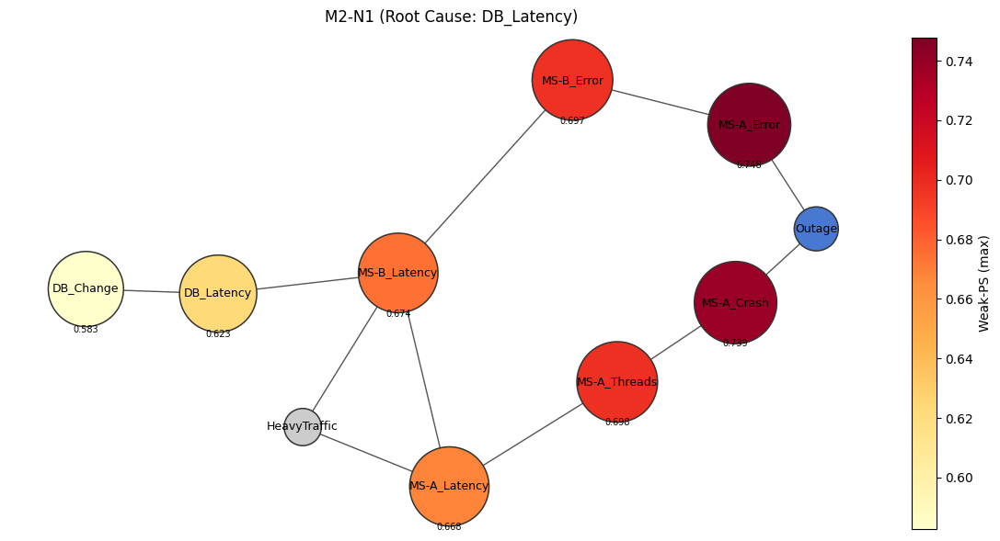

In [86]:
visualize_scores_and_graph(dot_graph_model2,
                            Weak_PS_M2N1,
                            which="max",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

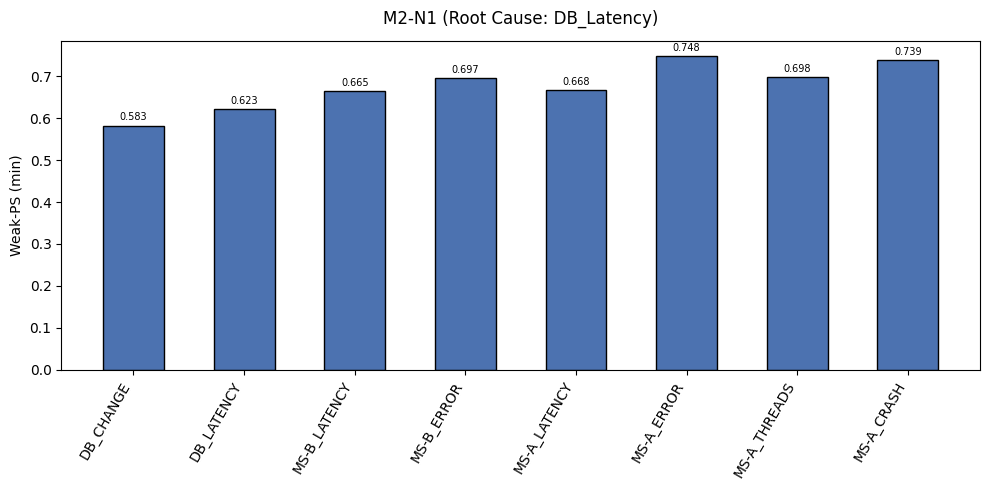

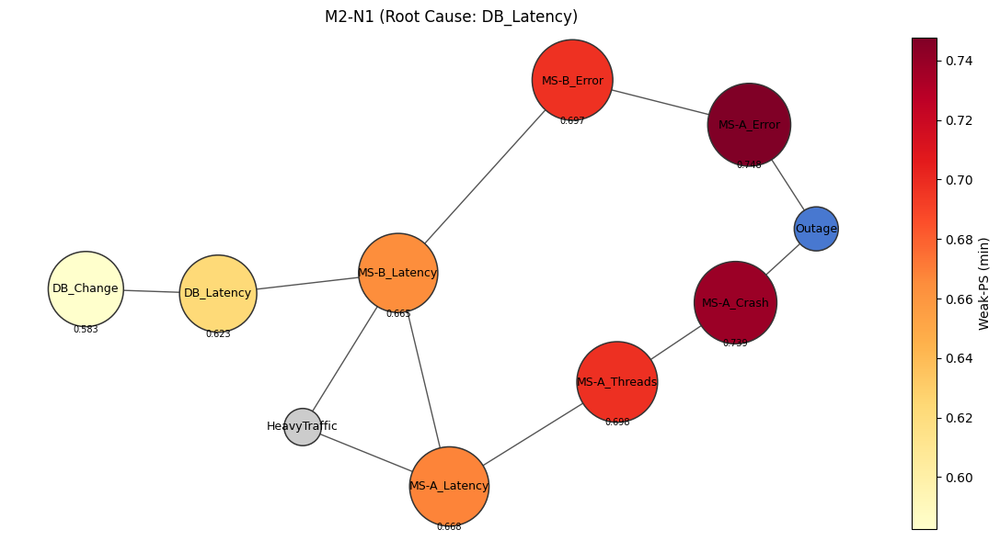

In [87]:
visualize_scores_and_graph(dot_graph_model2,
                            Weak_PS_M2N1,
                            which="min",
                            target="Outage",
                            score_name="Weak-PS",
                            bar_title="M2-N1 (Root Cause: DB_Latency)",
                            dag_title="M2-N1 (Root Cause: DB_Latency)")

## M2 - Narrativa 2

### Root Cause: MS-A_Threads

#### PN

In [88]:
PN = {
	'DB_CHANGE': [0.11210384278733017, 0.1642701245964805],
	'DB_LATENCY': [0.1448835986476165, 0.20221514229829204],
	'MS-B_LATENCY': [0.21416539819349834, 0.29866460334666667],
	'MS-B_ERROR': [0.28231265587938176, 0.3819385910072814],
	'MS-A_LATENCY': [0.026178194801825667, 0.06347103548715236],
	'MS-A_ERROR': [0.3563158738293998, 0.4692981503142963],
	'MS-A_THREADS': [0.572118380935012, 0.6989189035717398],
	'MS-A_CRASH': [0.7006262252425252, 0.7634621275927554]
}

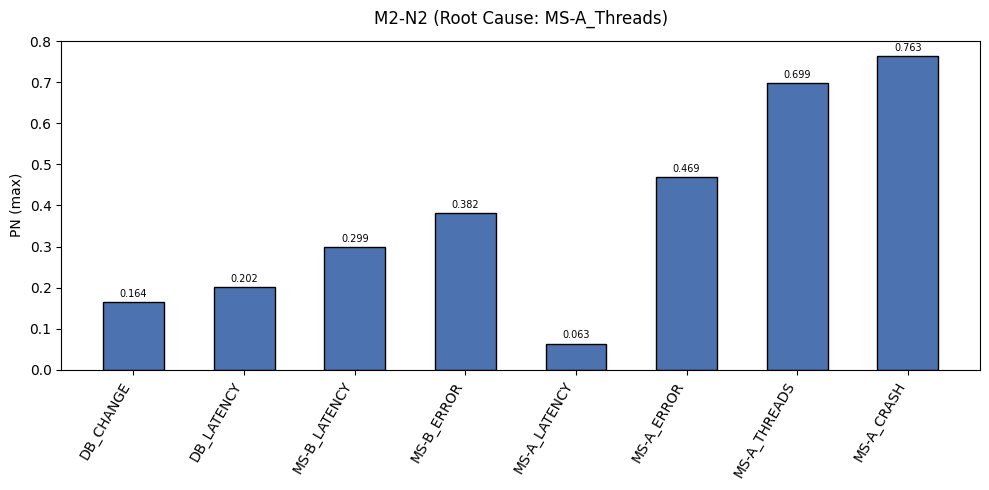

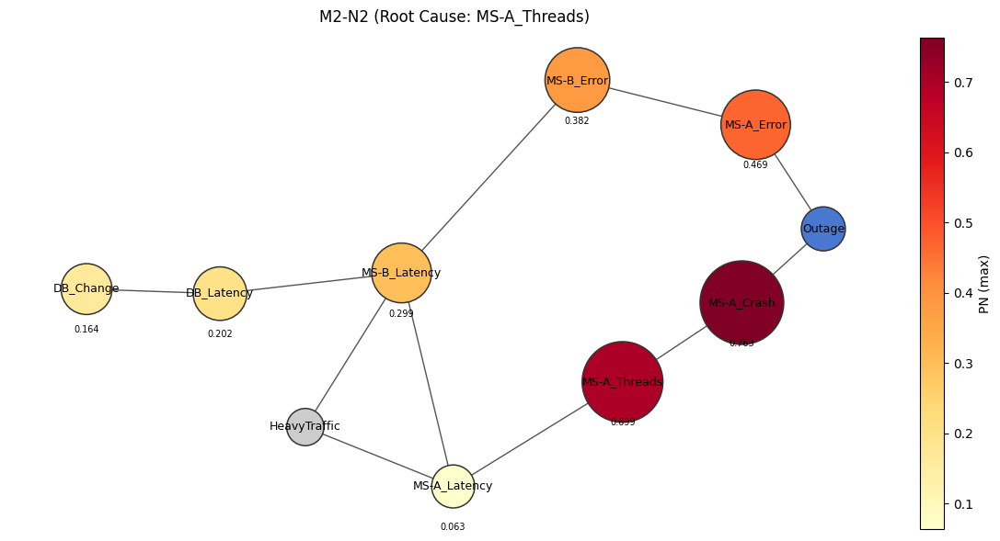

In [89]:
visualize_scores_and_graph(dot_graph_model2,
                            PN,
                            which="max",
                            target="Outage",
                            score_name="PN",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

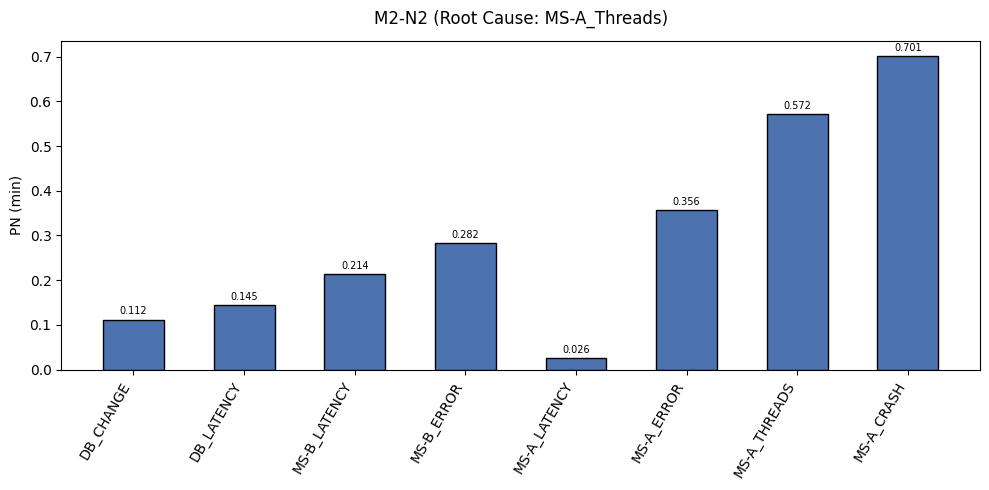

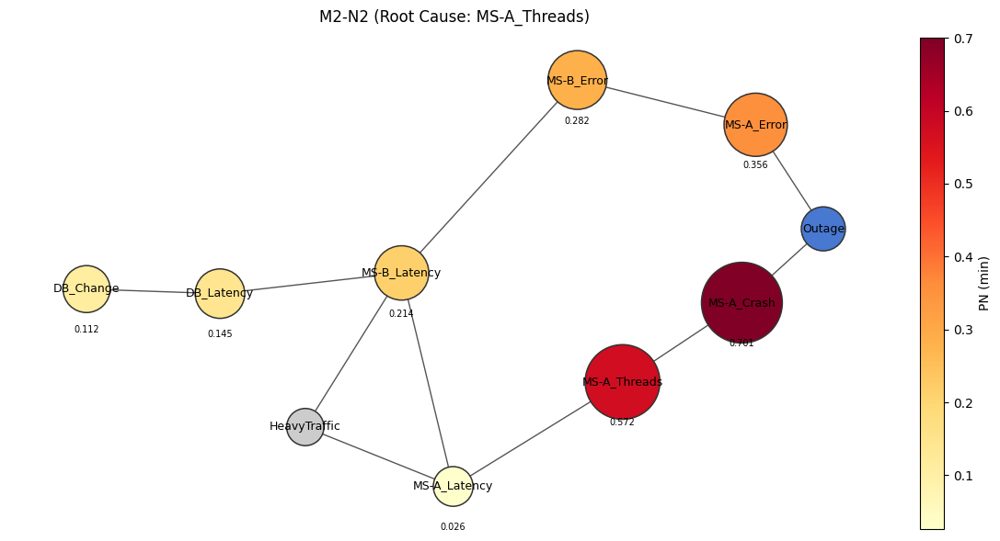

In [90]:
visualize_scores_and_graph(dot_graph_model2,
                            PN,
                            which="min",
                            target="Outage",
                            score_name="PN",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

#### PS

In [91]:
PS = {
	'DB_CHANGE': [0.21936929793566357, 0.3215084795862902],
	'DB_LATENCY': [0.28275946952049785, 0.3947163224253893],
	'MS-B_LATENCY': [0.4027520048531445, 0.5554693856671781],
	'MS-B_ERROR': [0.4851965541587383, 0.681178889607093],
	'MS-A_LATENCY': [0.04597899250957766, 0.12113123740946935],
	'MS-A_ERROR': [0.6228469461534316, 0.8433909818970778],
	'MS-A_THREADS': [0.557430851830983, 0.7118207970295969],
	'MS-A_CRASH': [0.7146187333570938, 0.7894479603986113]
}

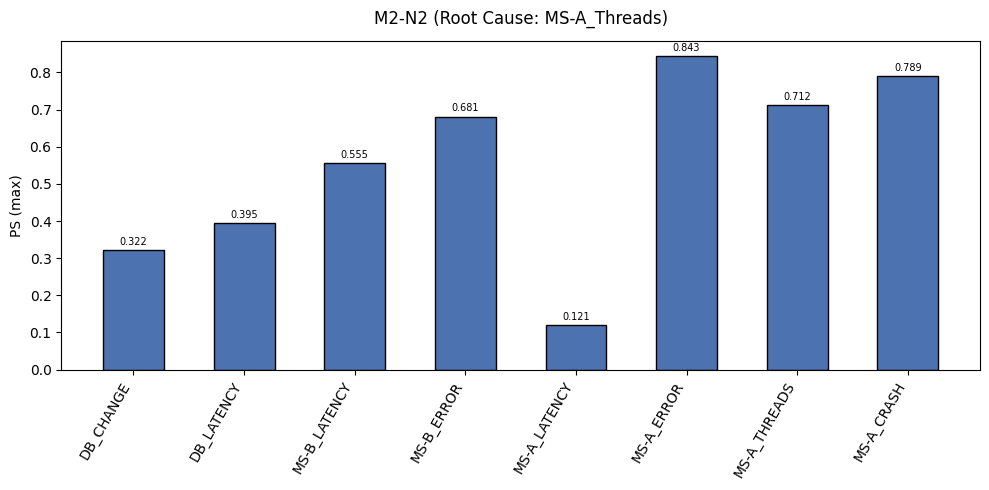

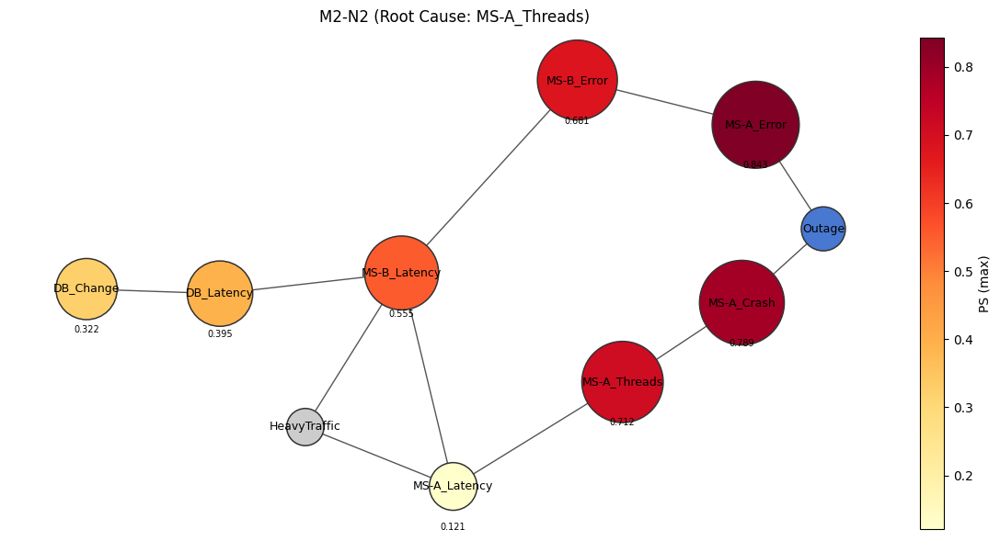

In [92]:
visualize_scores_and_graph(dot_graph_model2,
                            PS,
                            which="max",
                            target="Outage",
                            score_name="PS",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

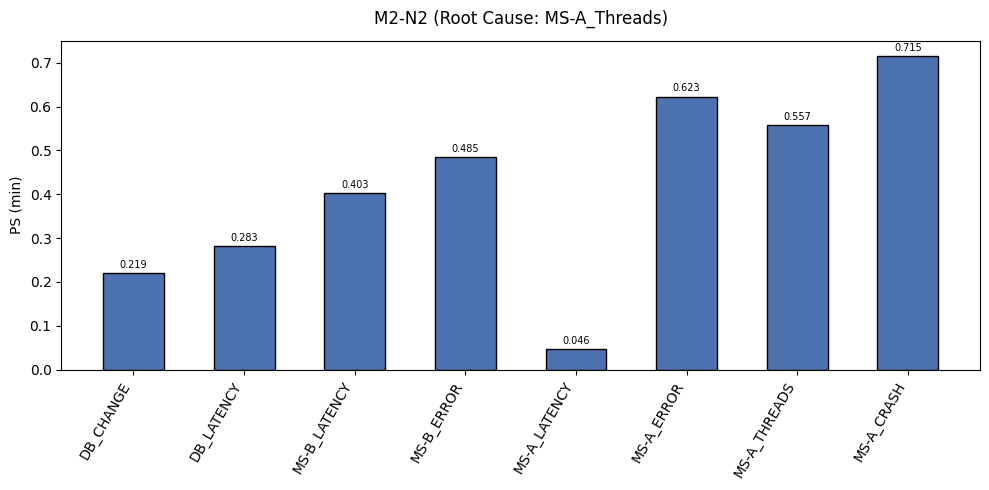

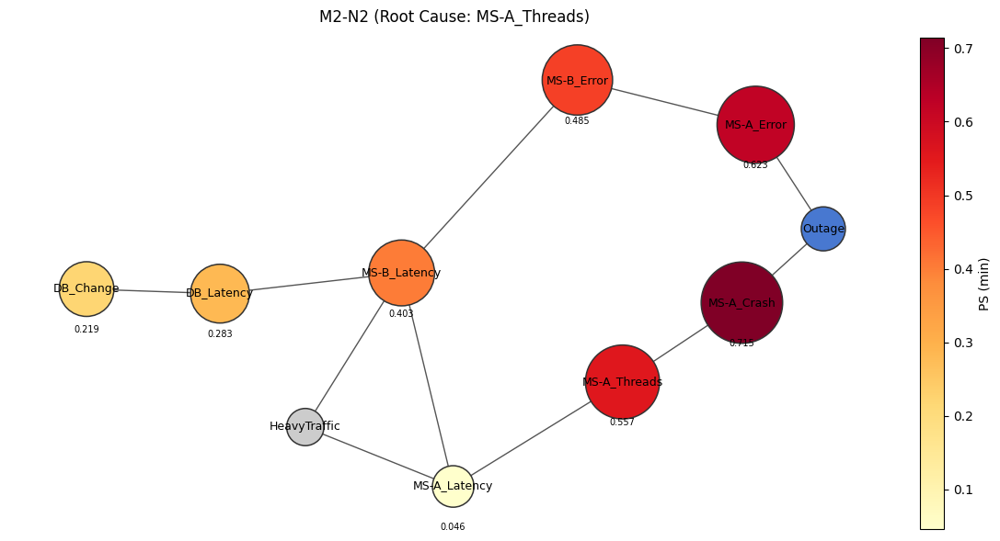

In [93]:
visualize_scores_and_graph(dot_graph_model2,
                            PS,
                            which="min",
                            target="Outage",
                            score_name="PS",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

#### PNS

In [94]:
PNS = {
	'DB_CHANGE': [0.07659337156009594, 0.11224648785793798],
	'DB_LATENCY': [0.09994140527974973, 0.13950368002482555],
	'MS-B_LATENCY': [0.14867215726901062, 0.2057445518359514],
	'MS-B_ERROR': [0.19155859332244807, 0.2652122044592752],
	'MS-A_LATENCY': [0.017318207317651175, 0.043129254487828804],
	'MS-A_ERROR': [0.2544318718195635, 0.3409227084414432],
	'MS-A_THREADS': [0.38527824291193885, 0.4723810227467037],
	'MS-A_CRASH': [0.5234255998285603, 0.5720451519796363]
}

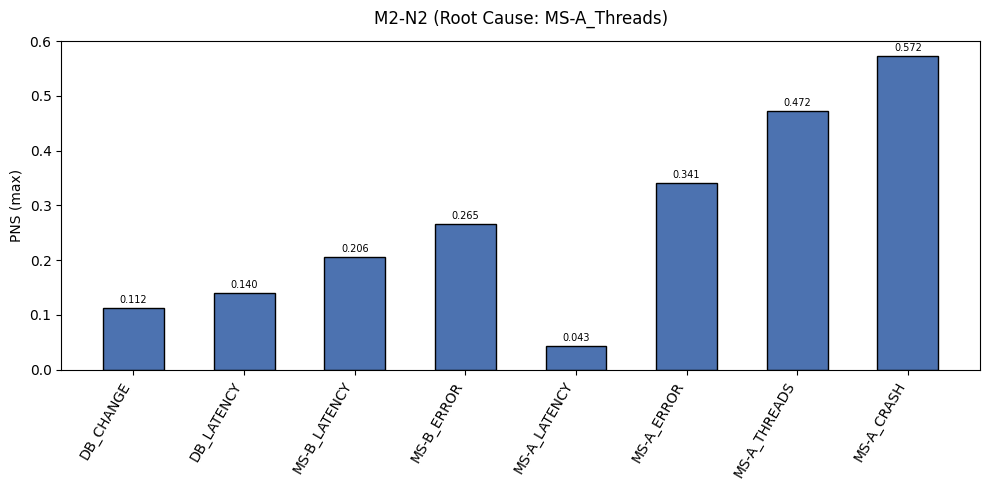

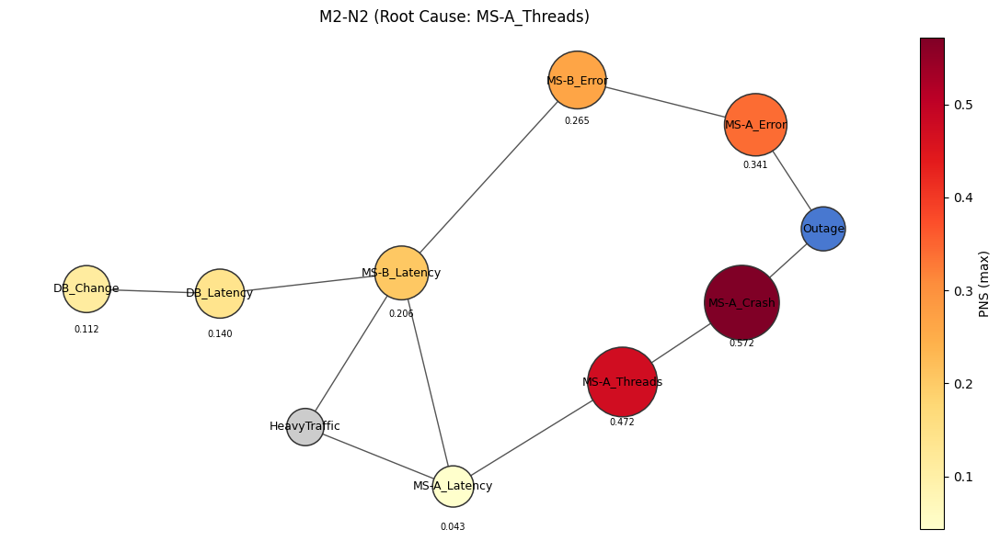

In [95]:
visualize_scores_and_graph(dot_graph_model2,
                            PNS,
                            which="max",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

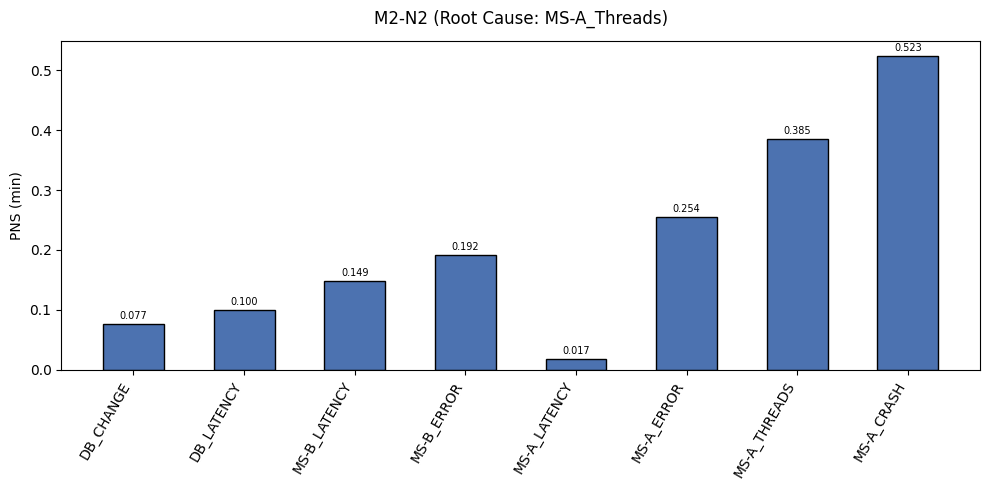

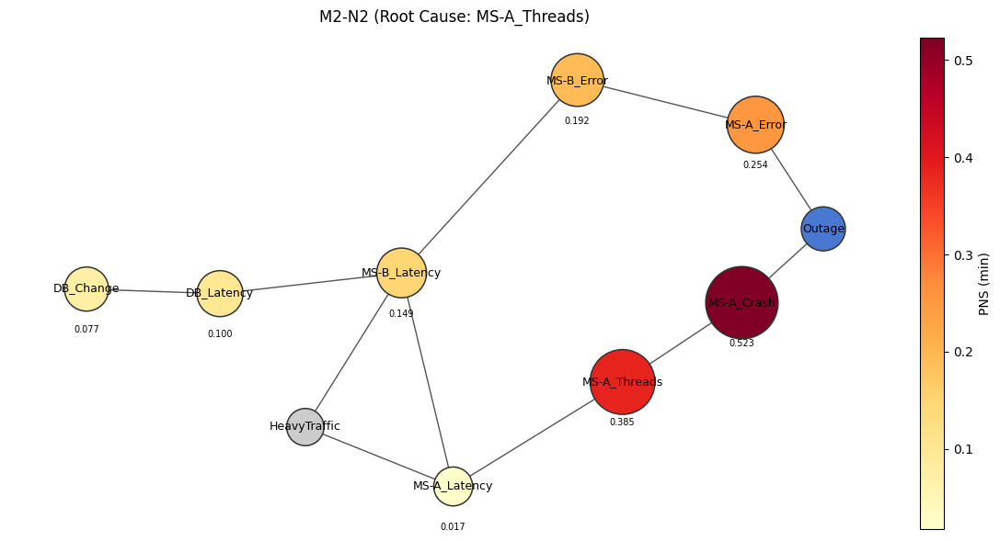

In [96]:
visualize_scores_and_graph(dot_graph_model2,
                            PNS,
                            which="min",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

#### weak-PN

In [97]:
weak_PN = {
	'DB_CHANGE': [0.3490869903289883, 0.34915401060926016],
	'DB_LATENCY': [0.35338841417832684, 0.3534534024677546],
	'MS-B_LATENCY': [0.3674759545051308, 0.37492064892956006],
	'MS-B_ERROR': [0.3908219637433246, 0.3908923893457625],
	'MS-A_LATENCY': [0.3360791259106882, 0.3361395353510899],
	'MS-A_ERROR': [0.405891108832967, 0.4059622262801584],
	'MS-A_THREADS': [0.6715541728938972, 0.6719280425490463],
	'MS-A_CRASH': [0.7275610898381597, 0.7277552734132988]
}

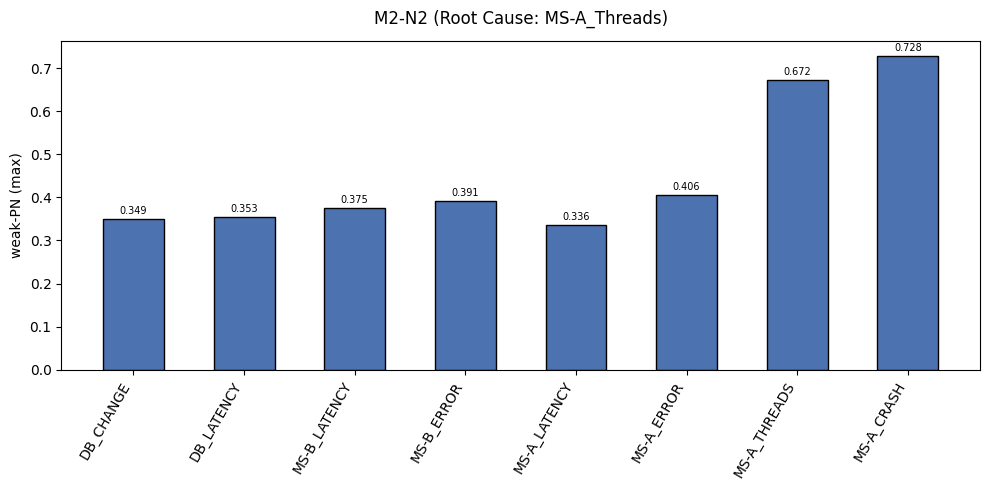

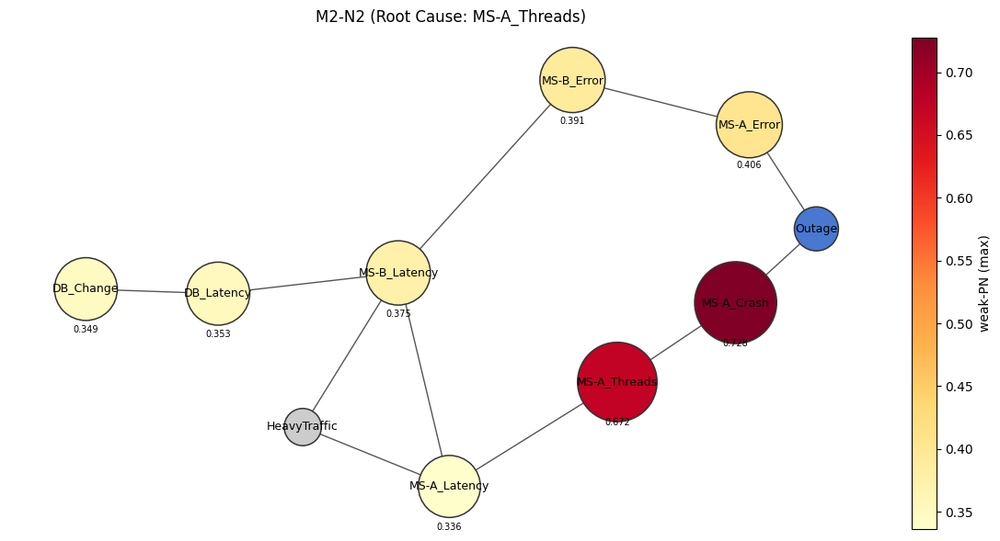

In [98]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PN,
                            which="max",
                            target="Outage",
                            score_name="weak-PN",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

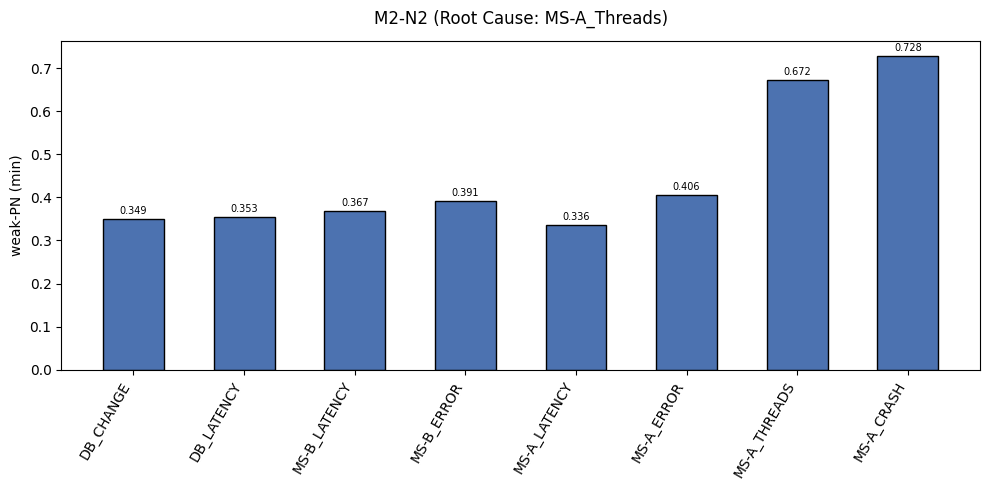

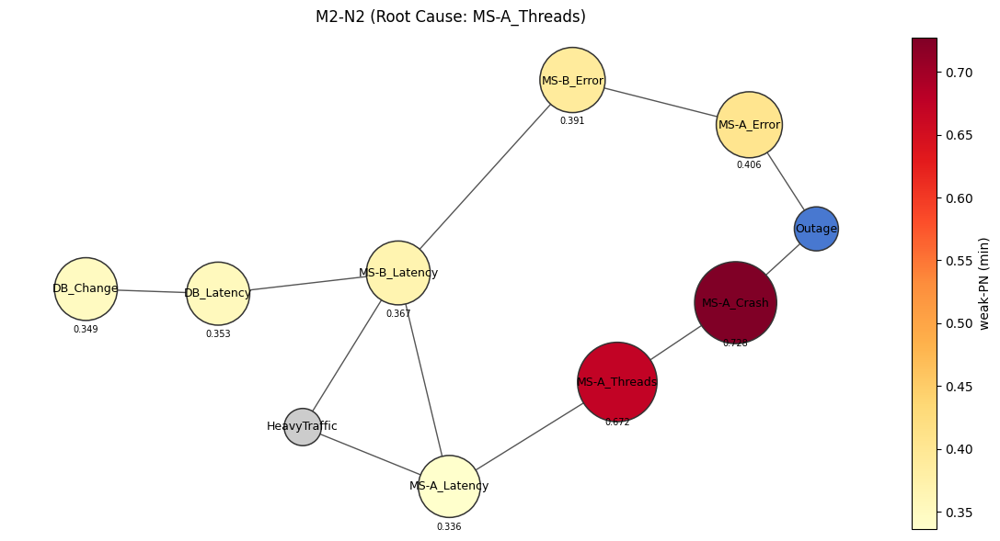

In [99]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PN,
                            which="min",
                            target="Outage",
                            score_name="weak-PN",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

### weak-PS

In [100]:
weak_PS = {
	'DB_CHANGE': [0.6832300624333604, 0.6833303564522865],
	'DB_LATENCY': [0.6897980612219737, 0.6899051311424808],
	'MS-B_LATENCY': [0.6991393890948836, 0.700758262693346],
	'MS-B_ERROR': [0.7239385166221094, 0.7240581019130758],
	'MS-A_LATENCY': [0.6295456936642126, 0.6296381361112579],
	'MS-A_ERROR': [0.7468720838082982, 0.7470160866106782],
	'MS-A_THREADS': [0.6829795361278737, 0.6830243142647446],
	'MS-A_CRASH': [0.7550461995870273, 0.7550674536091151]
}

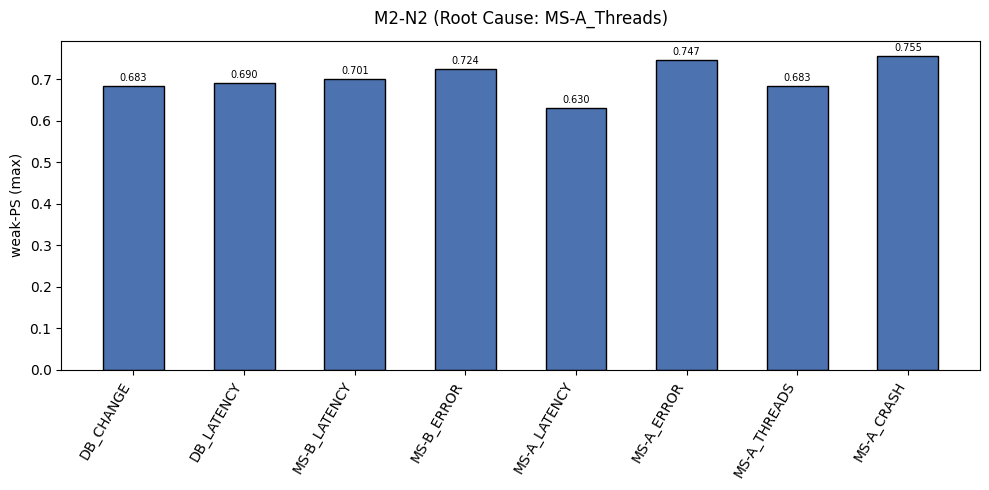

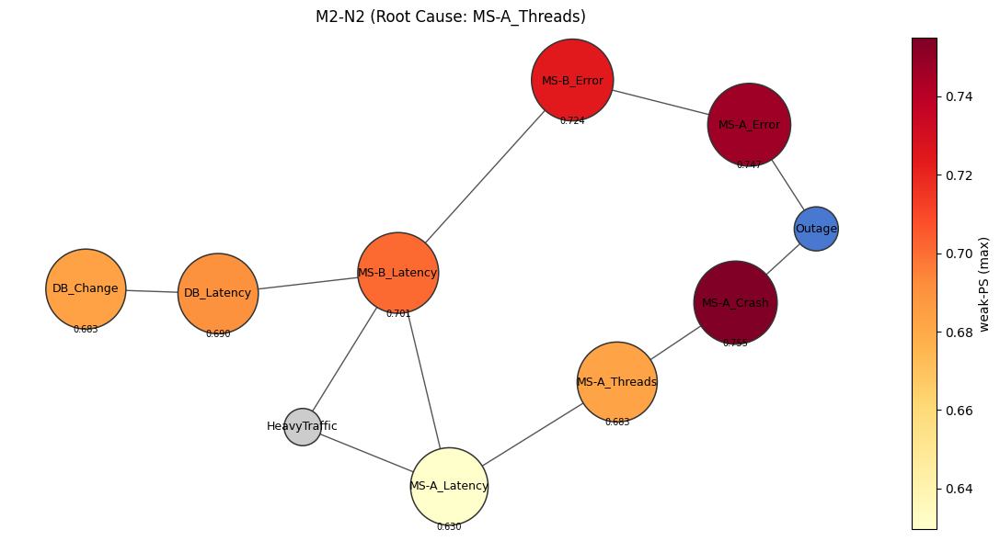

In [101]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PS,
                            which="max",
                            target="Outage",
                            score_name="weak-PS",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

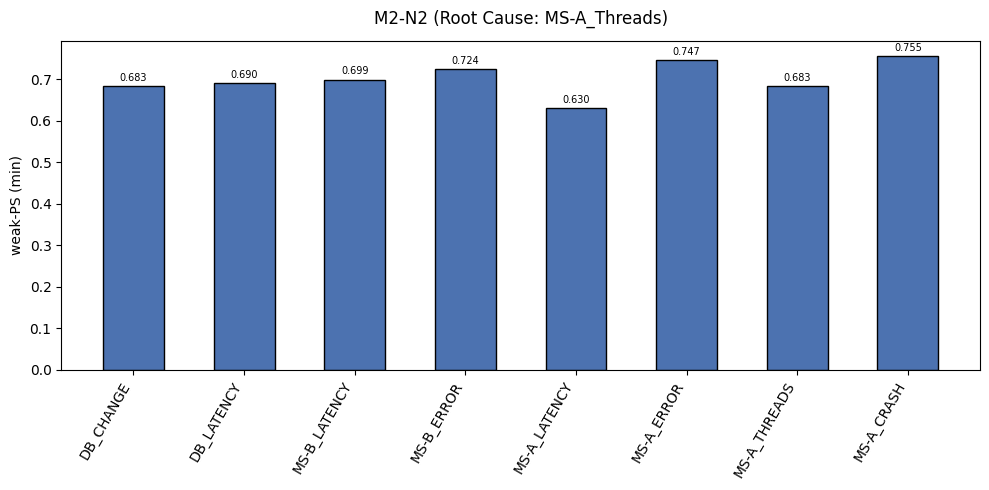

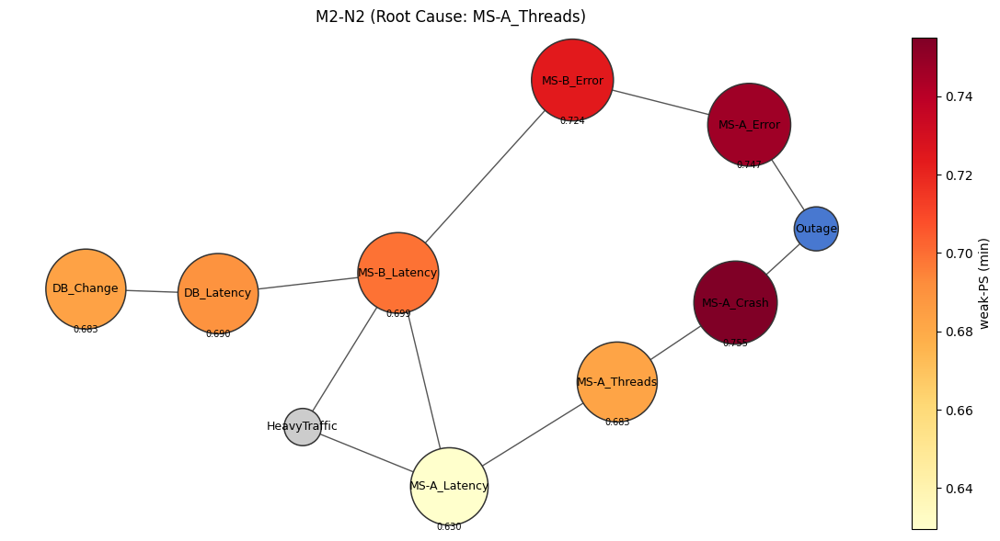

In [102]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PS,
                            which="min",
                            target="Outage",
                            score_name="weak-PS",
                            bar_title="M2-N2 (Root Cause: MS-A_Threads)",
                            dag_title="M2-N2 (Root Cause: MS-A_Threads)")

## Modelo 2 - Narrativa 3

### Root Cause: MS-B_Error

### PN

In [103]:
PN = {
	'DB_CHANGE': [0.08331942340684283, 0.13429650264919493],
	'DB_LATENCY': [0.10202512169817564, 0.16499908323194873],
	'MS-B_LATENCY': [0.09487237887366967, 0.2122278400694251],
	'MS-B_ERROR': [0.5517648944349258, 0.6442541717626291],
	'MS-A_LATENCY': [0.20293906634727707, 0.33257642214083016],
	'MS-A_ERROR': [0.6687202450710963, 0.7353373810282162],
	'MS-A_THREADS': [0.25897398927705517, 0.37757377243868584],
	'MS-A_CRASH': [0.31689201102219705, 0.47937497935844836]
}

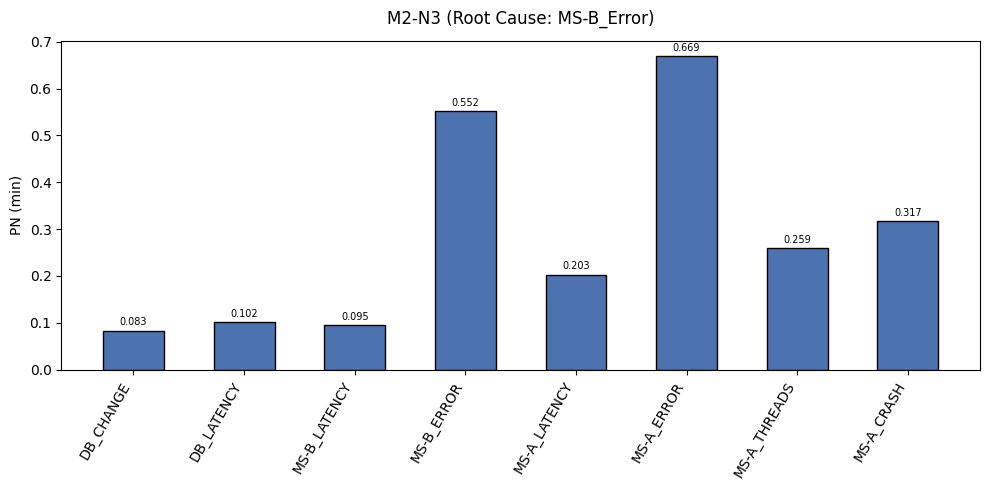

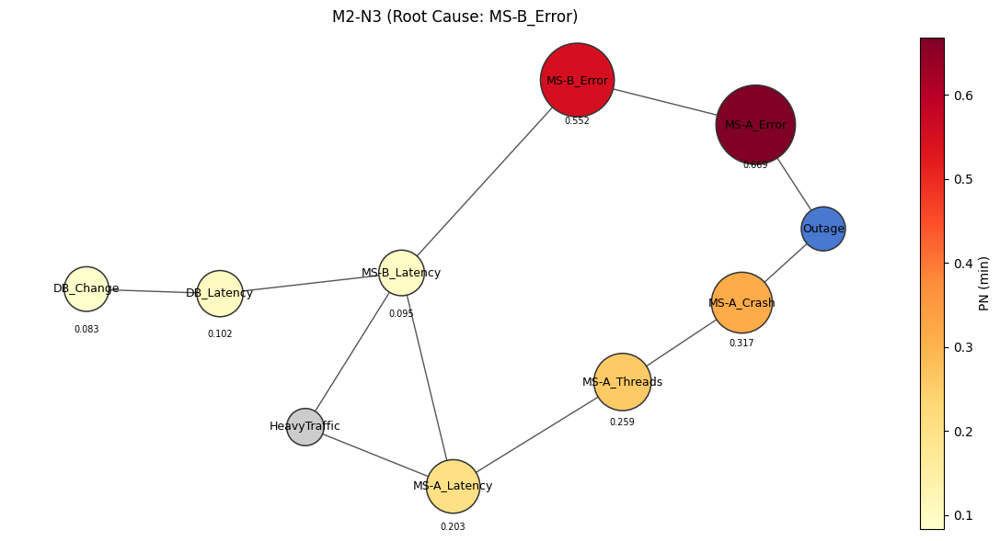

In [104]:
visualize_scores_and_graph(dot_graph_model2,
                            PN,
                            which="min",
                            target="Outage",
                            score_name="PN",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

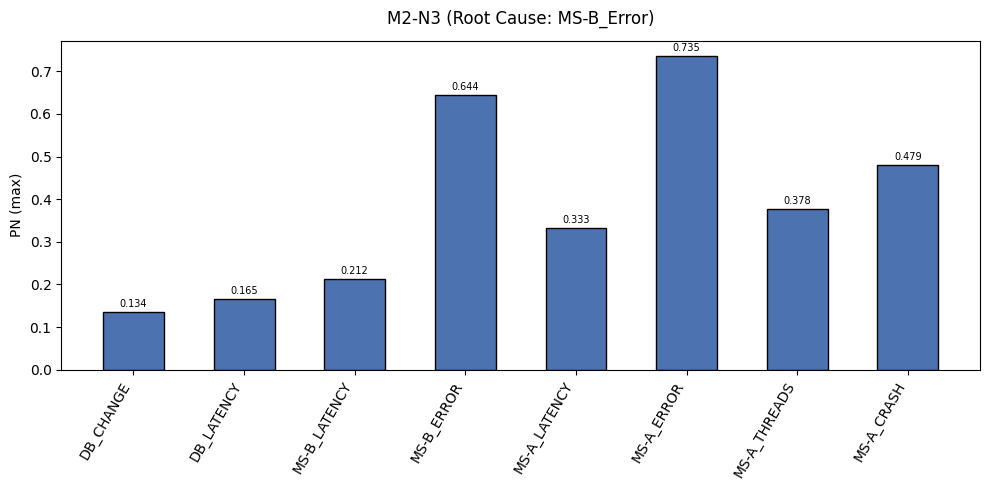

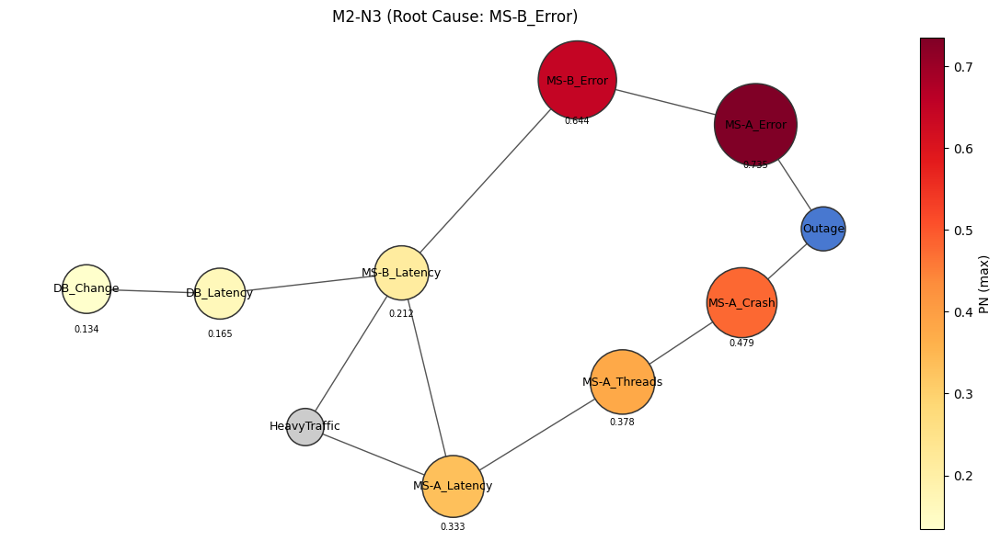

In [105]:
visualize_scores_and_graph(dot_graph_model2,
                            PN,
                            which="max",
                            target="Outage",
                            score_name="PN",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

### PS

In [106]:
PS = {
	'DB_CHANGE': [0.16612297207902818, 0.2677231234106657],
	'DB_LATENCY': [0.20309688096277873, 0.32844945617203475],
	'MS-B_LATENCY': [0.28124512086872555, 0.4682616537737259],
	'MS-B_ERROR': [0.5520430003114108, 0.6742632173155872],
	'MS-A_LATENCY': [0.33420957545148705, 0.59773369407361],
	'MS-A_ERROR': [0.7040341087937676, 0.7868760786975092],
	'MS-A_THREADS': [0.4408258931482077, 0.6824413618991049],
	'MS-A_CRASH': [0.5498061801583878, 0.8710200027356874]
}

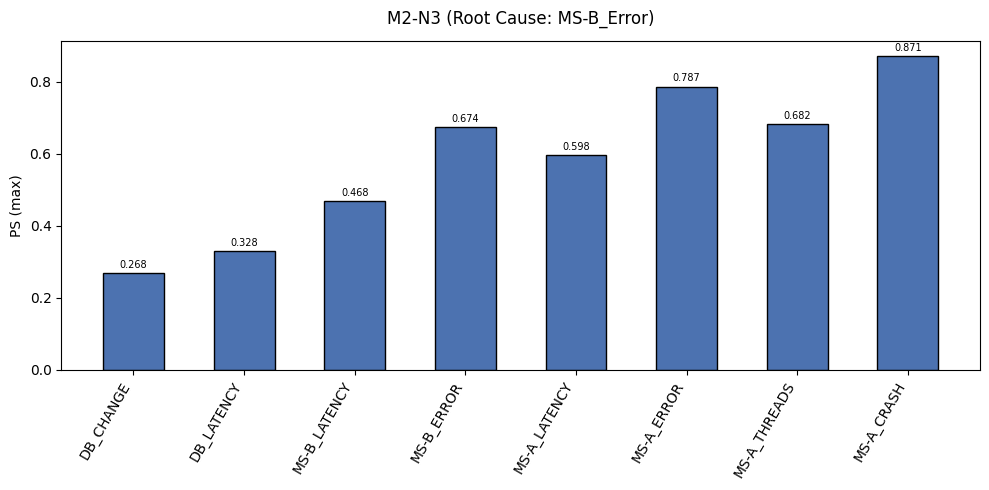

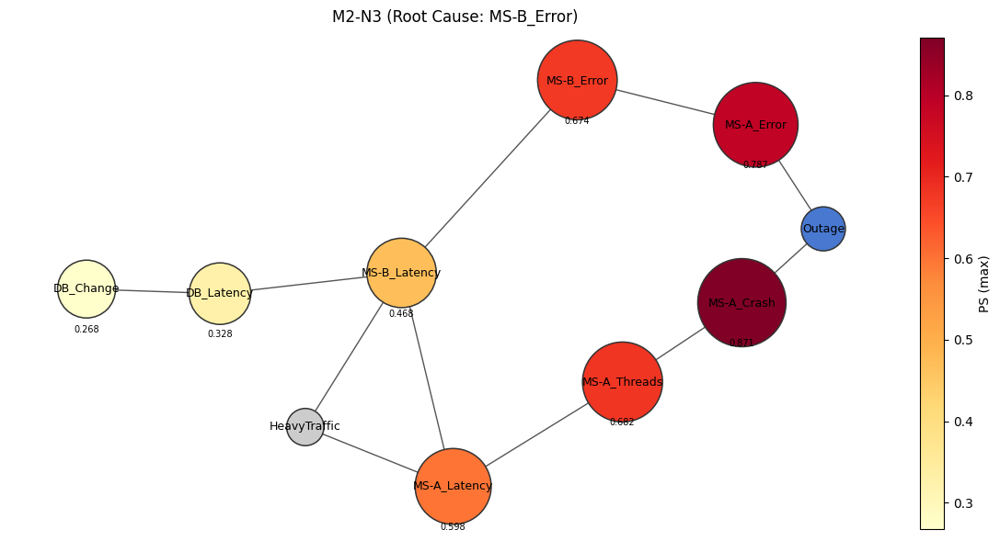

In [107]:
visualize_scores_and_graph(dot_graph_model2,
                            PS,
                            which="max",
                            target="Outage",
                            score_name="PS",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

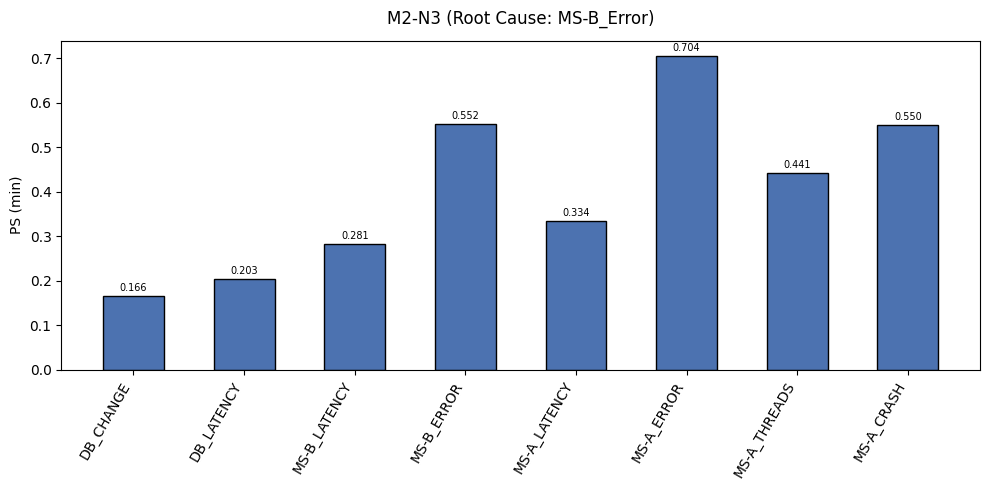

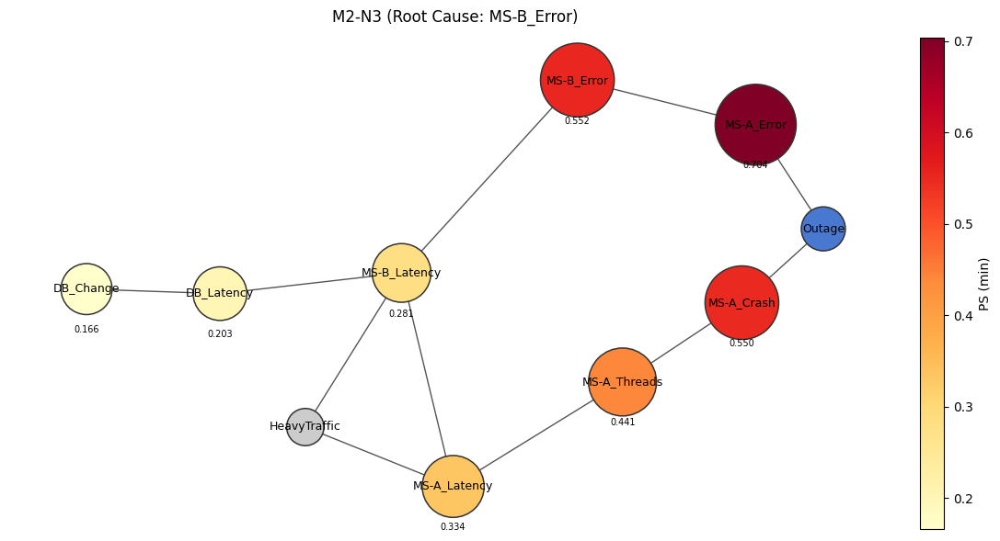

In [108]:
visualize_scores_and_graph(dot_graph_model2,
                            PS,
                            which="min",
                            target="Outage",
                            score_name="PS",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

### PNS

In [109]:
PNS = {
	'DB_CHANGE': [0.05645844488033294, 0.09099590800151182],
	'DB_LATENCY': [0.06949526923185538, 0.11238958032730115],
	'MS-B_LATENCY': [0.1022072412393608, 0.15057452573177638],
	'MS-B_ERROR': [0.37225910424129677, 0.43609853257888875],
	'MS-A_LATENCY': [0.1298736175330231, 0.223922159361809],
	'MS-A_ERROR': [0.4988398298103879, 0.5503525770101448],
	'MS-A_THREADS': [0.17523818997770238, 0.2646228031777418],
	'MS-A_CRASH': [0.22586604126128162, 0.3511052563986622]
}

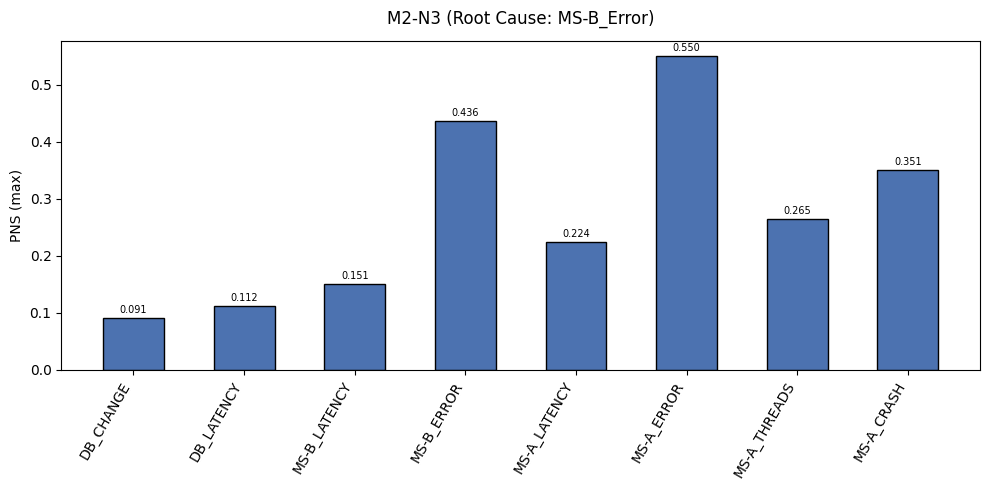

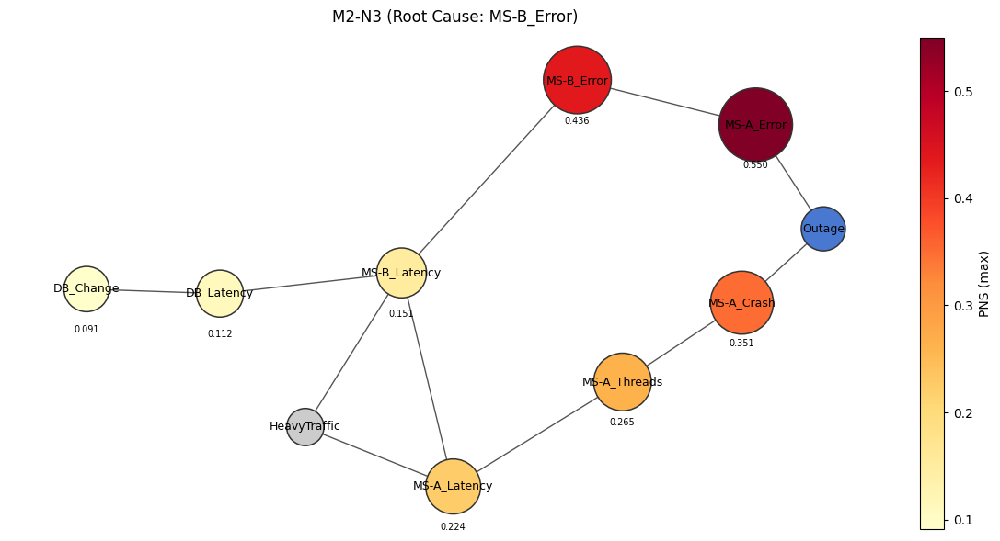

In [110]:
visualize_scores_and_graph(dot_graph_model2,
                            PNS,
                            which="max",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

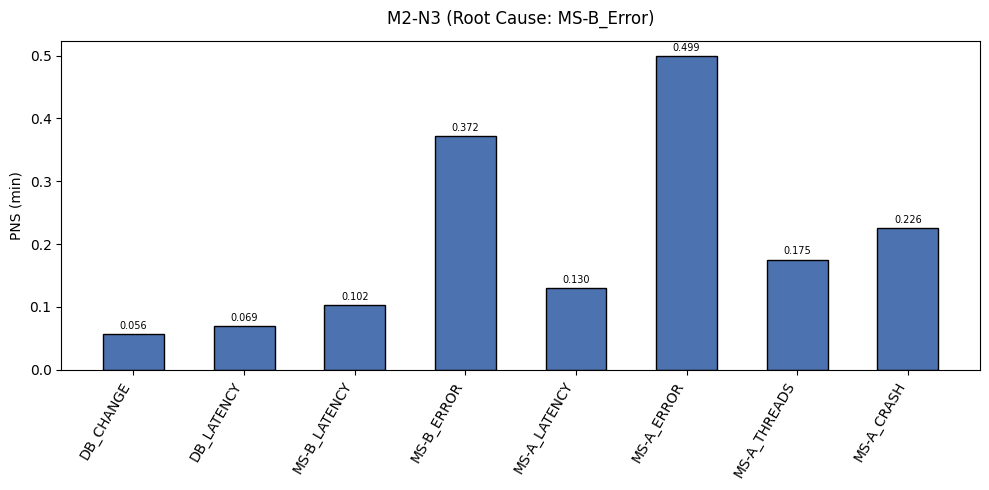

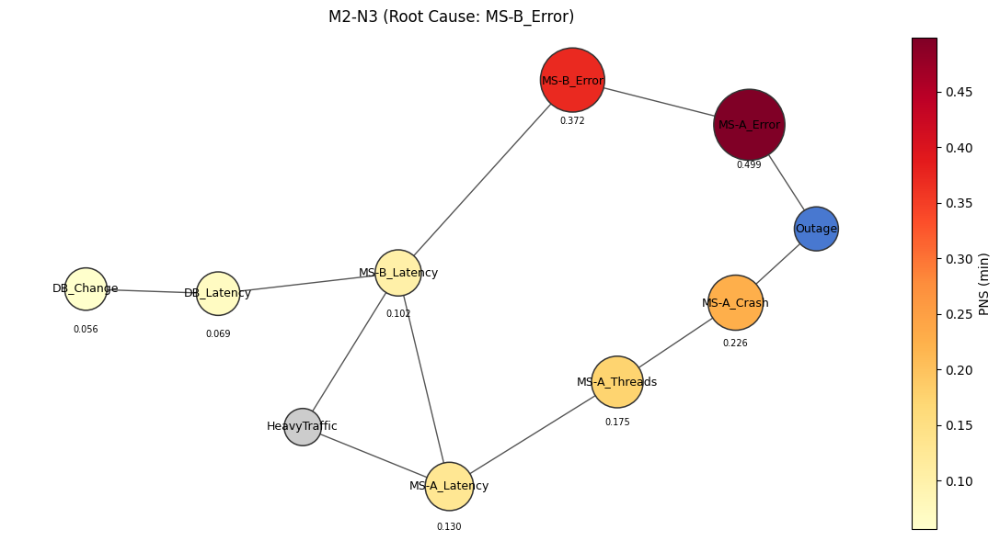

In [111]:
visualize_scores_and_graph(dot_graph_model2,
                            PNS,
                            which="min",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

### Weak PN

In [112]:
weak_PN = {
	'DB_CHANGE': [0.33973648188943556, 0.33988811590970225],
	'DB_LATENCY': [0.34205298656507455, 0.3422052319815972],
	'MS-B_LATENCY': [0.33940246508908944, 0.35101460942877893],
	'MS-B_ERROR': [0.6478636311061591, 0.6488152641011404],
	'MS-A_LATENCY': [0.3770856738678033, 0.3772938319822399],
	'MS-A_ERROR': [0.7024035810510496, 0.7025004281818845],
	'MS-A_THREADS': [0.3894369292994748, 0.38966065639552017],
	'MS-A_CRASH': [0.4049294530861852, 0.4051736407796781]
}

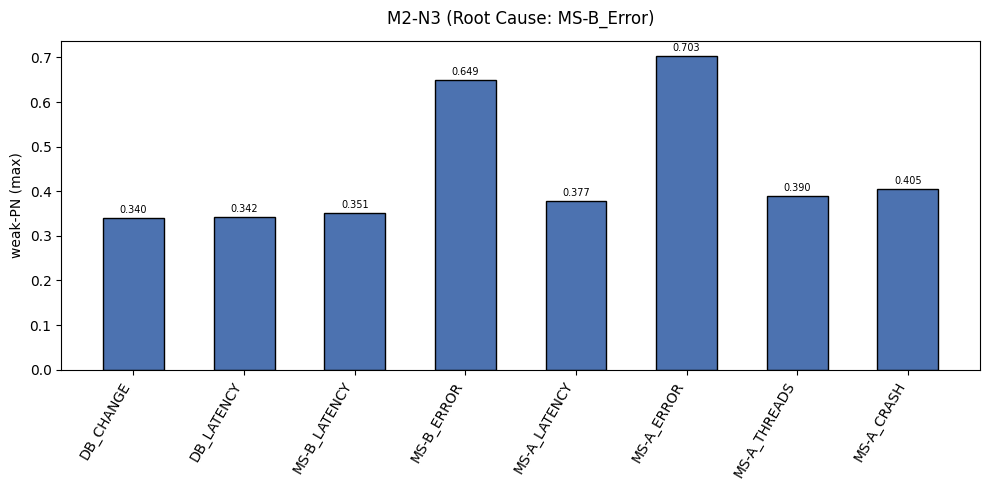

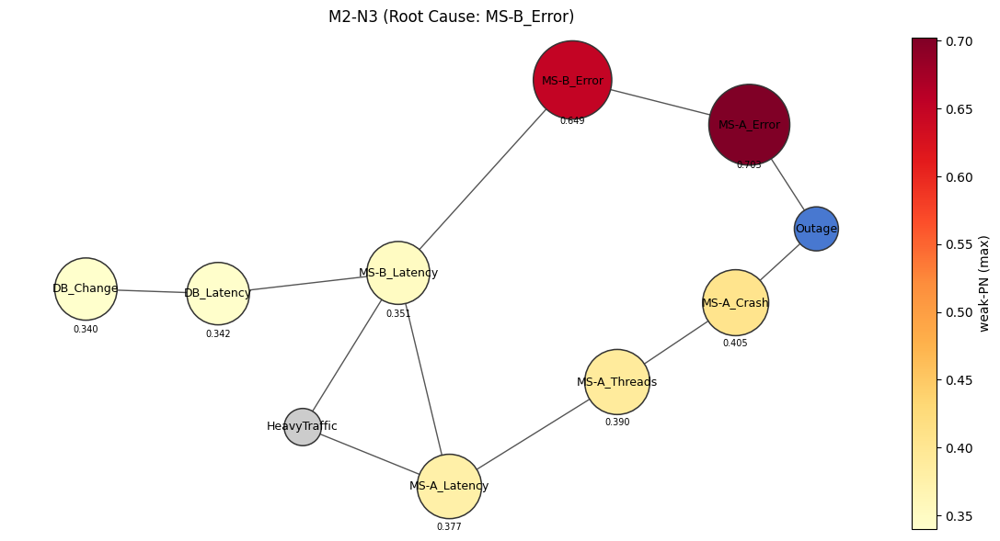

In [113]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PN,
                            which="max",
                            target="Outage",
                            score_name="weak-PN",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

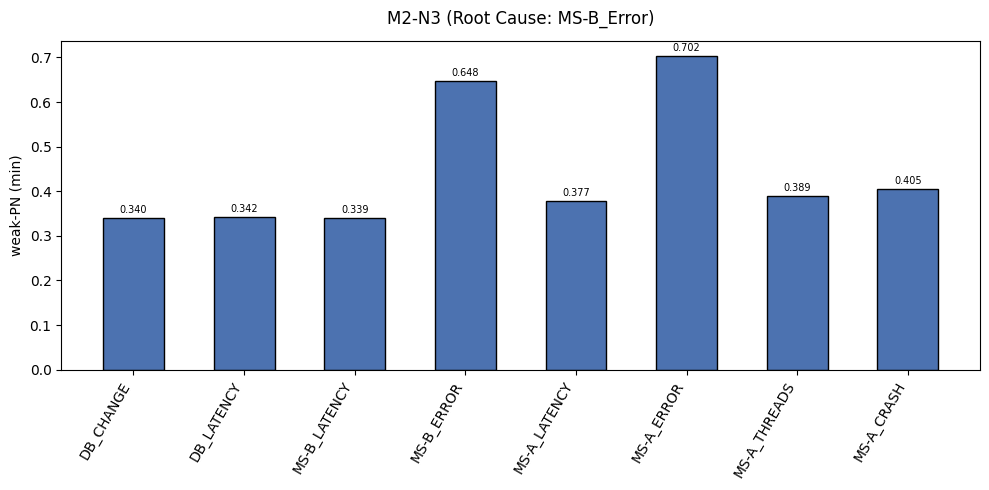

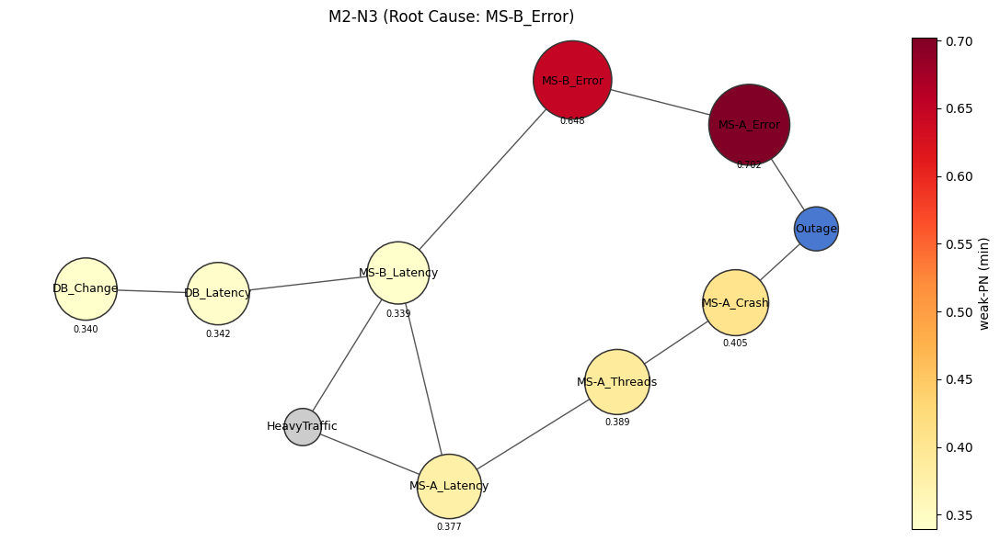

In [114]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PN,
                            which="min",
                            target="Outage",
                            score_name="weak-PN",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

### Weak PS

In [115]:
Weak_PS = {
	'DB_CHANGE': [0.6775746665511346, 0.6777216897511206],
	'DB_LATENCY': [0.6811163907341516, 0.6812624821000345],
	'MS-B_LATENCY': [0.6749344013182749, 0.6862647364966767],
	'MS-B_ERROR': [0.6856052509008279, 0.6856981151073811],
	'MS-A_LATENCY': [0.7105746706520683, 0.7106724369353689],
	'MS-A_ERROR': [0.7550871018279551, 0.7551169296969693],
	'MS-A_THREADS': [0.7290879270885153, 0.7291662932052824],
	'MS-A_CRASH': [0.7523811866824865, 0.7524461959635982]
}

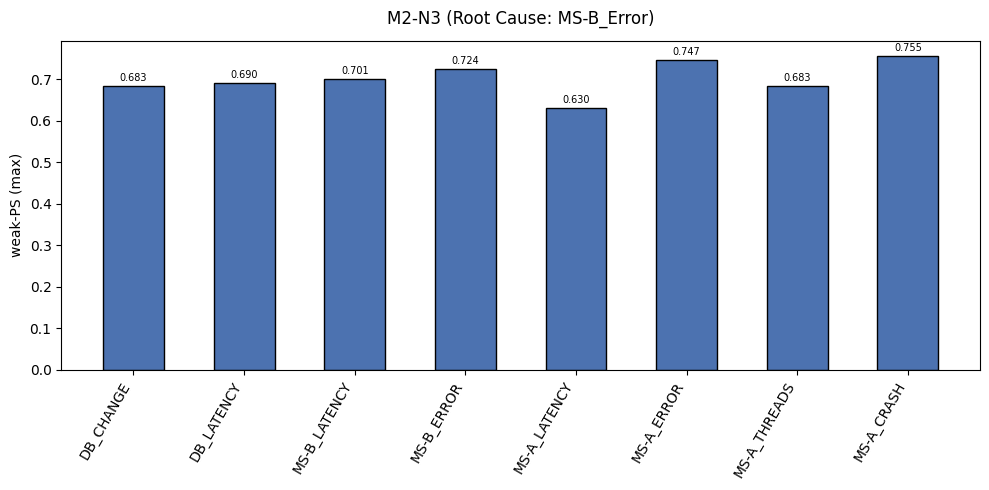

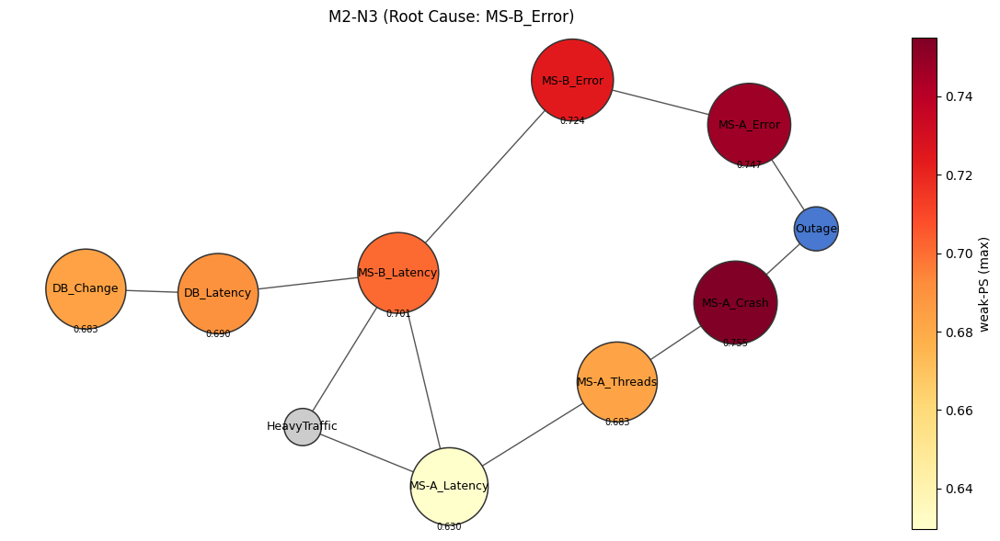

In [116]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PS,
                            which="max",
                            target="Outage",
                            score_name="weak-PS",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

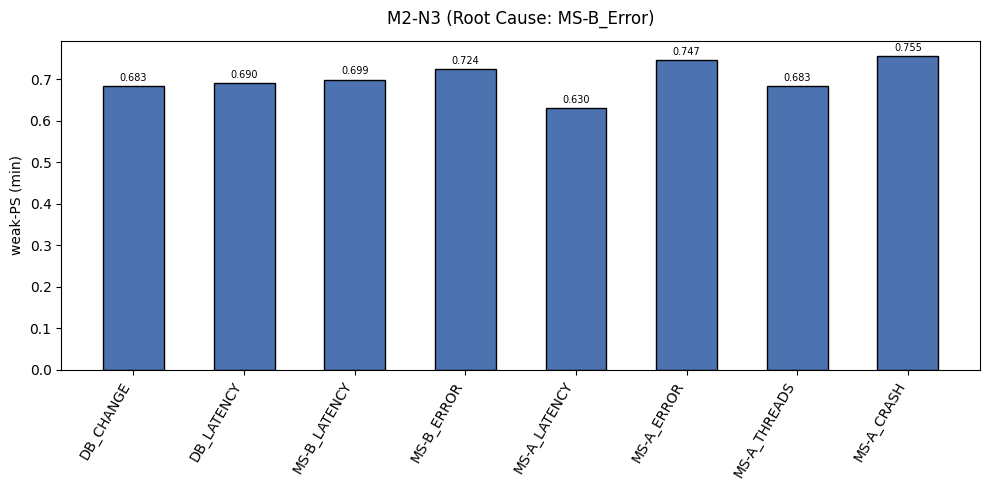

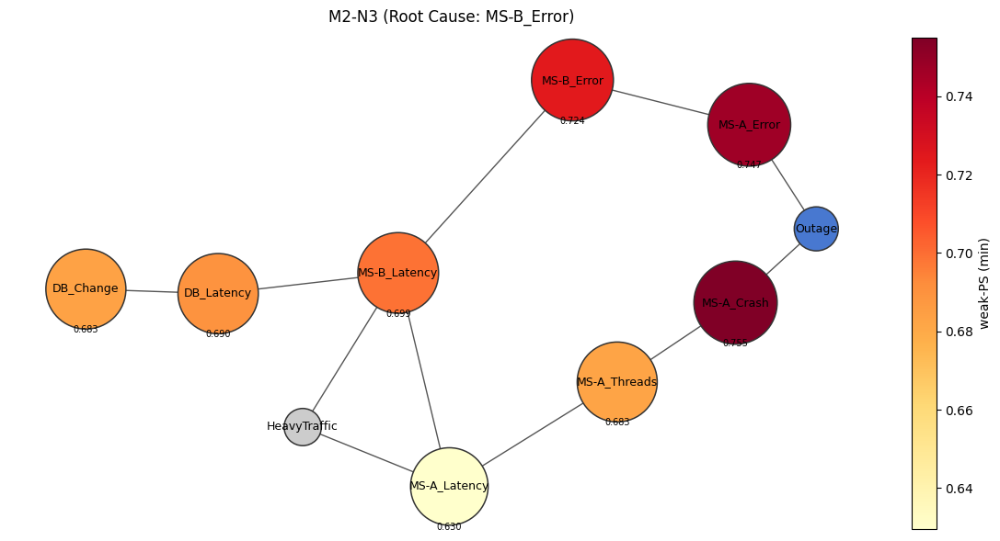

In [117]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PS,
                            which="min",
                            target="Outage",
                            score_name="weak-PS",
                            bar_title="M2-N3 (Root Cause: MS-B_Error)",
                            dag_title="M2-N3 (Root Cause: MS-B_Error)")

## Modelo 2 - Narrativa 4

### Root Cause: MS-A_Latency

### PN

In [118]:
PN = {
	'DB_CHANGE': [0.13234798641347362, 0.18685210636700017],
	'DB_LATENCY': [0.15427083822434817, 0.22609453923265305],
	'MS-B_LATENCY': [0.216097526434613, 0.3216085316417485],
	'MS-B_ERROR': [0.2749294736481928, 0.42061719249851864],
	'MS-A_LATENCY': [0.0171654768000404, 0.06082408975959067],
	'MS-A_ERROR': [0.3532032356462211, 0.5011939941084913],
	'MS-A_THREADS': [0.5774934624237659, 0.7066201495301351],
	'MS-A_CRASH': [0.6877621016905188, 0.7530466796085514]
}

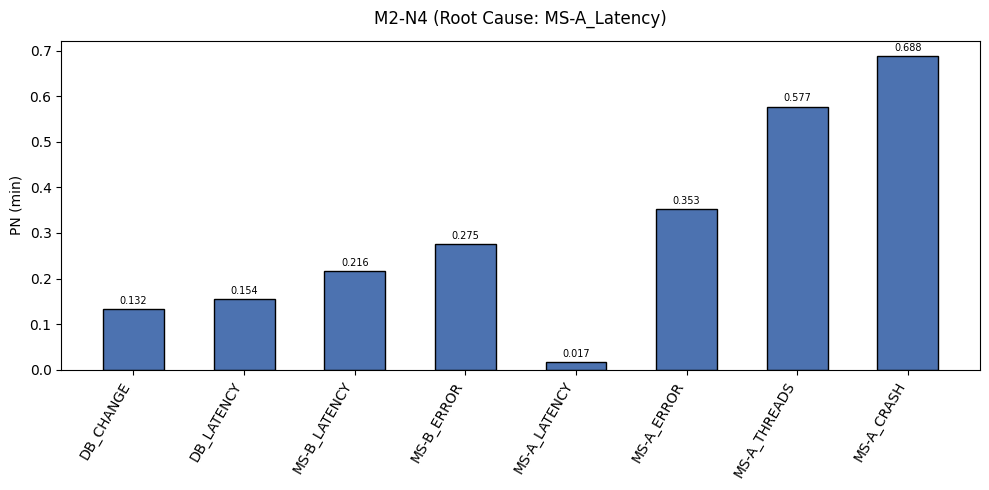

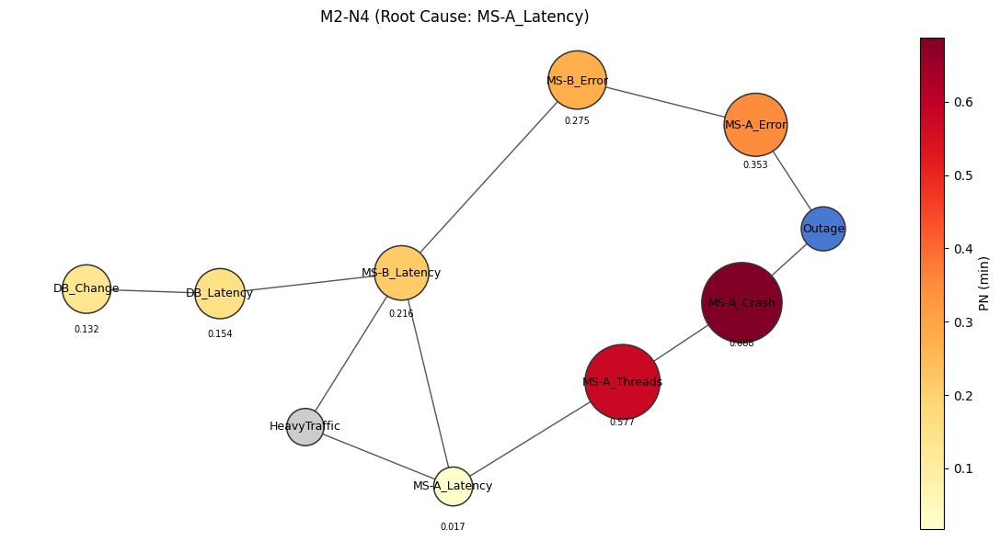

In [119]:
visualize_scores_and_graph(dot_graph_model2,
                            PN,
                            which="min",
                            target="Outage",
                            score_name="PN",
                            bar_title="M2-N4 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N4 (Root Cause: MS-A_Latency)")

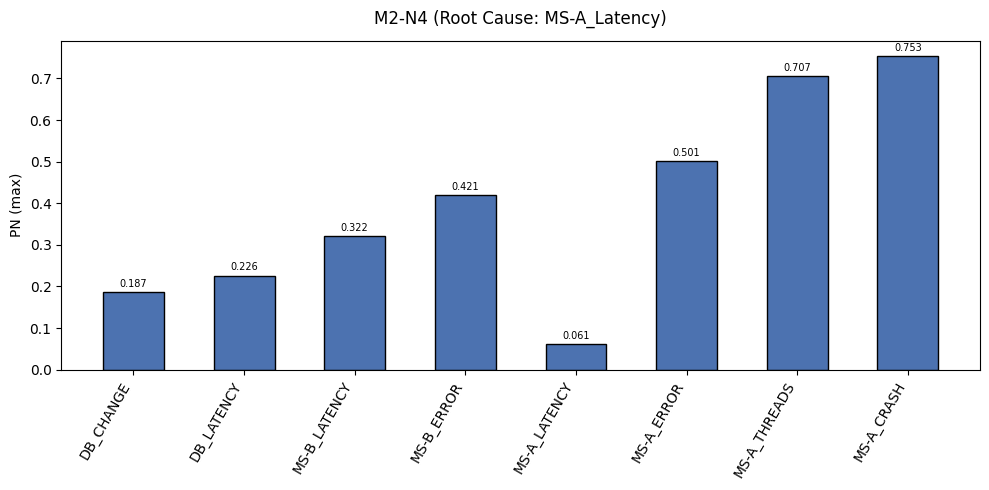

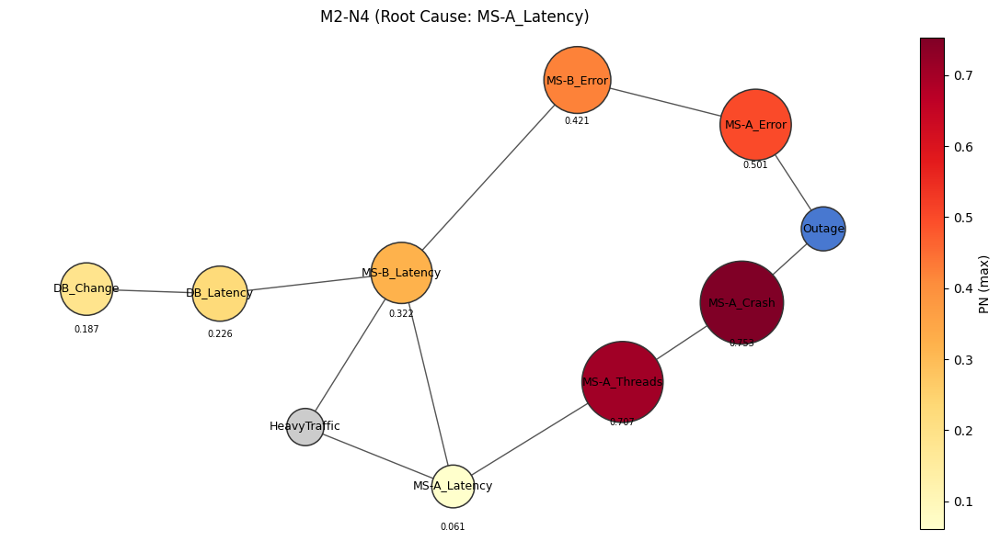

In [120]:
visualize_scores_and_graph(dot_graph_model2,
                            PN,
                            which="max",
                            target="Outage",
                            score_name="PN",
                            bar_title="M2-N4 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N4 (Root Cause: MS-A_Latency)")

### PS

In [121]:
PS = {
	'DB_CHANGE': [0.23176452317923057, 0.3272175278826308],
	'DB_LATENCY': [0.26956636339318235, 0.3950757548639507],
	'MS-B_LATENCY': [0.39154165356803267, 0.5672879225585991],
	'MS-B_ERROR': [0.46776179411102503, 0.7122227855973268],
	'MS-A_LATENCY': [0.03572885165414574, 0.11943106038607168],
	'MS-A_ERROR': [0.5970067592789445, 0.844171152590438],
	'MS-A_THREADS': [0.5804087449568528, 0.708323106587464],
	'MS-A_CRASH': [0.7149758903931883, 0.7817836886393803]
}

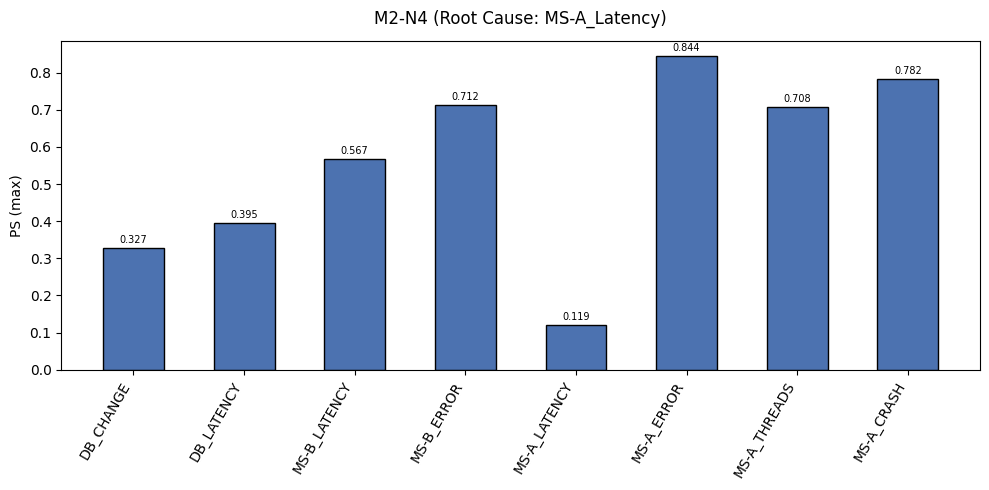

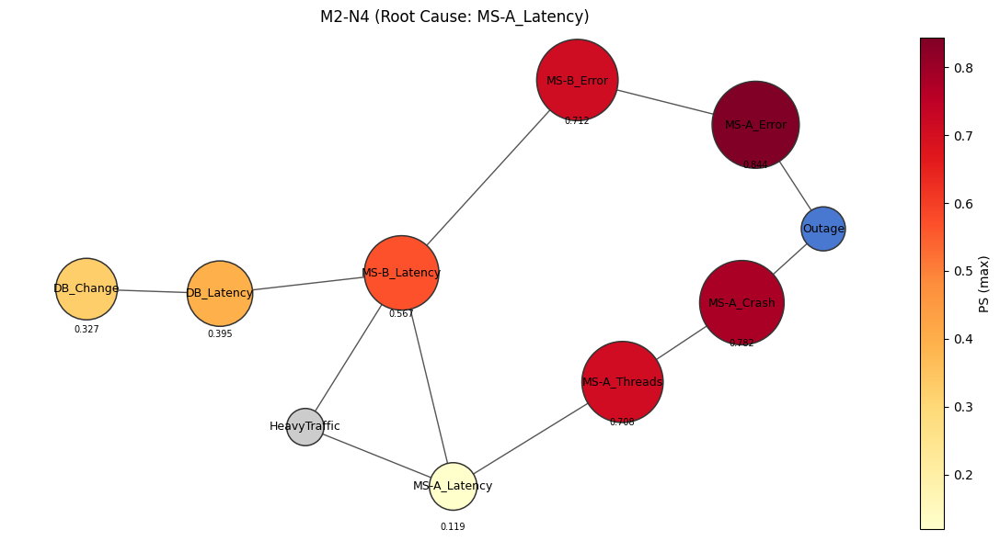

In [122]:
visualize_scores_and_graph(dot_graph_model2,
                            PS,
                            which="max",
                            target="Outage",
                            score_name="PS",
                            bar_title="M2-N4 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N4 (Root Cause: MS-A_Latency)")

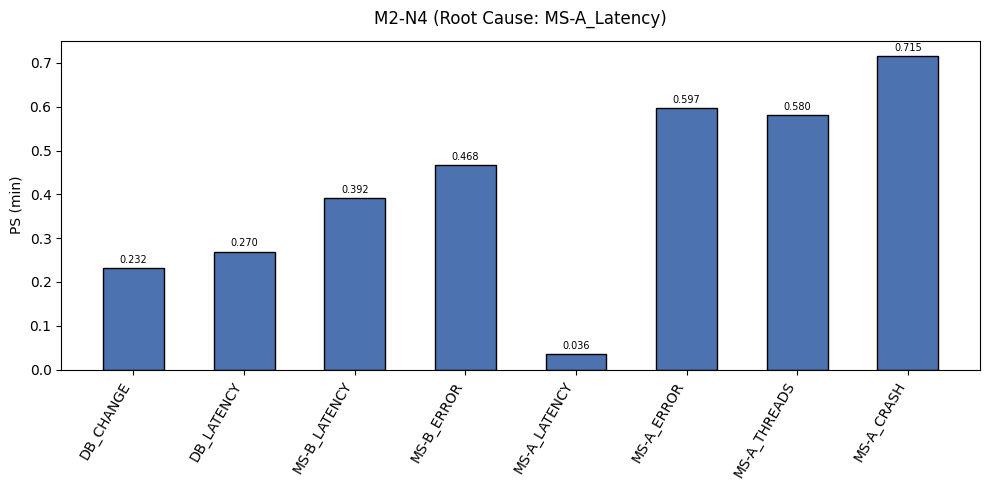

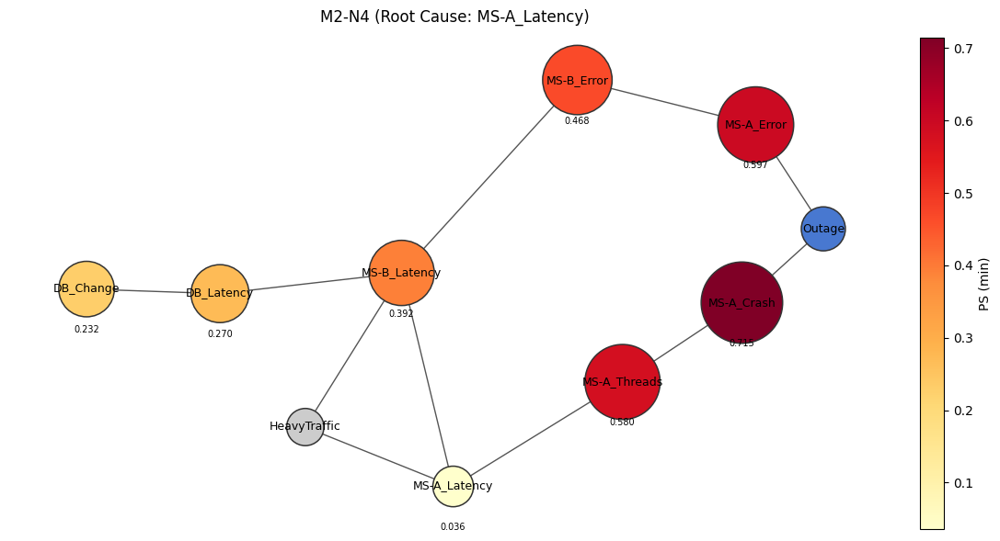

In [123]:
visualize_scores_and_graph(dot_graph_model2,
                            PS,
                            which="min",
                            target="Outage",
                            score_name="PS",
                            bar_title="M2-N4 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N4 (Root Cause: MS-A_Latency)")

### PNS

In [124]:
PNS = {
	'DB_CHANGE': [0.08847075648433875, 0.12490631824691605],
	'DB_LATENCY': [0.10469623268761696, 0.15344089980421602],
	'MS-B_LATENCY': [0.15695919683189782, 0.2285917115249552],
	'MS-B_ERROR': [0.19749756709249633, 0.30122793877449383],
	'MS-A_LATENCY': [0.010729454971309782, 0.037848667961493096],
	'MS-A_ERROR': [0.26282835349933337, 0.3721158128003224],
	'MS-A_THREADS': [0.393219763464539, 0.4809530307714759],
	'MS-A_CRASH': [0.5173719035234562, 0.5662859978558308]
}

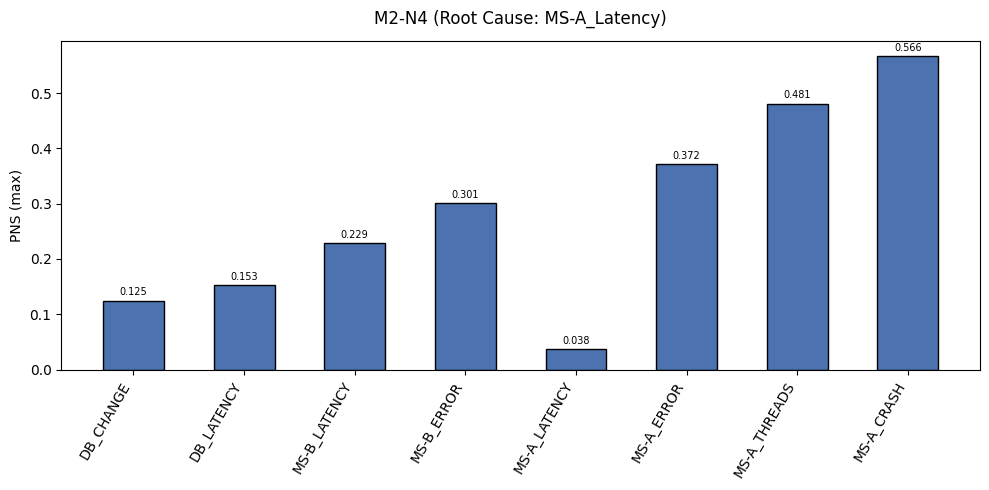

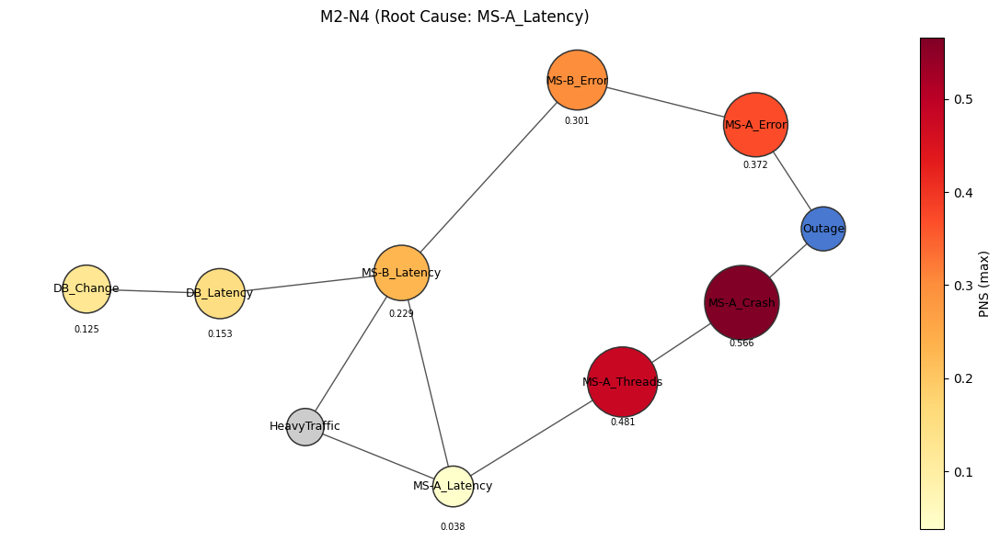

In [125]:
visualize_scores_and_graph(dot_graph_model2,
                            PNS,
                            which="max",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M2-N4 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N4 (Root Cause: MS-A_Latency)")

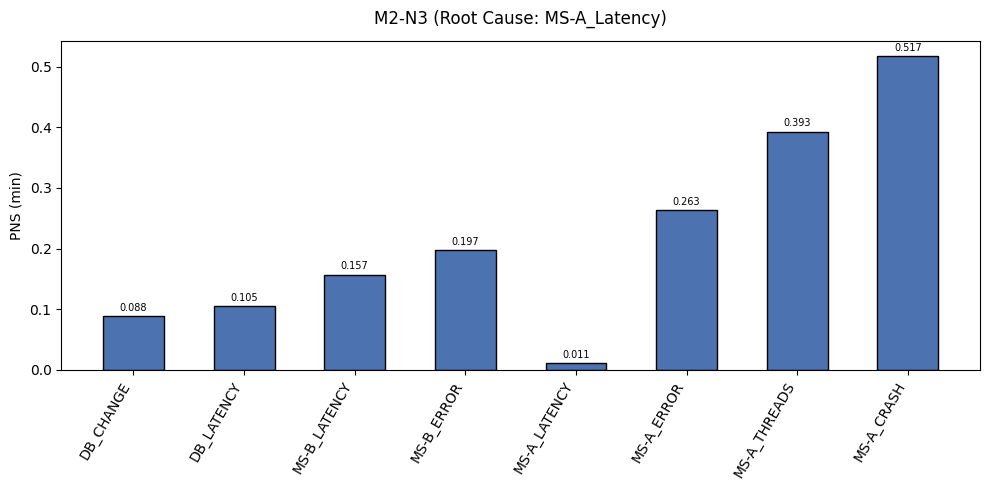

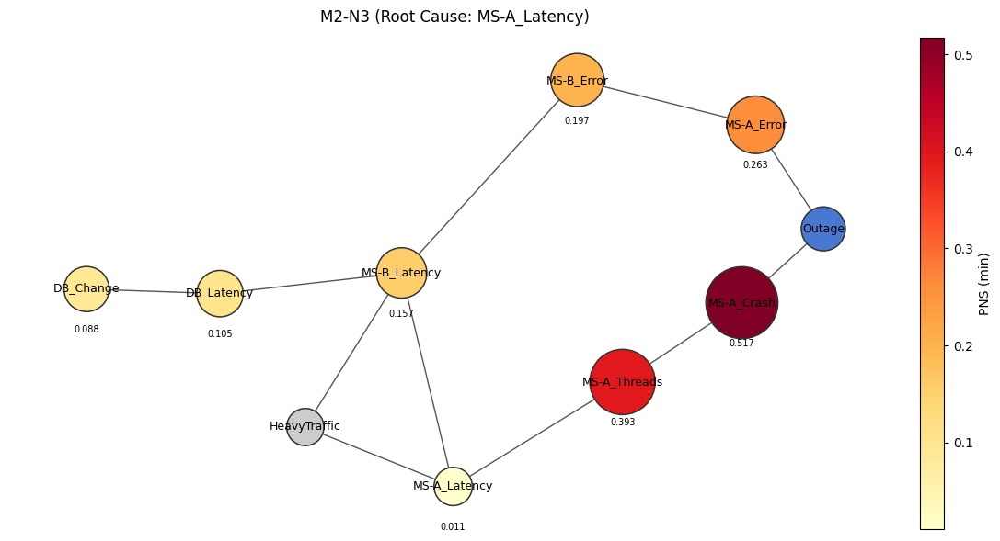

In [126]:
visualize_scores_and_graph(dot_graph_model2,
                            PNS,
                            which="min",
                            target="Outage",
                            score_name="PNS",
                            bar_title="M2-N3 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N3 (Root Cause: MS-A_Latency)")

### Weak PN

In [127]:
weak_PN = {
	'DB_CHANGE': [0.38172257780676877, 0.38177336869284095],
	'DB_LATENCY': [0.3883834882681053, 0.3884317393763633],
	'MS-B_LATENCY': [0.401003553733479, 0.4097554566616658],
	'MS-B_ERROR': [0.42276004427001374, 0.4228086428852966],
	'MS-A_LATENCY': [0.33428229310625074, 0.3345260125469812],
	'MS-A_ERROR': [0.44061366508333977, 0.4406784295411488],
	'MS-A_THREADS': [0.6785609694433787, 0.6787316767308842],
	'MS-A_CRASH': [0.7239967539784419, 0.7241864230687393]
}

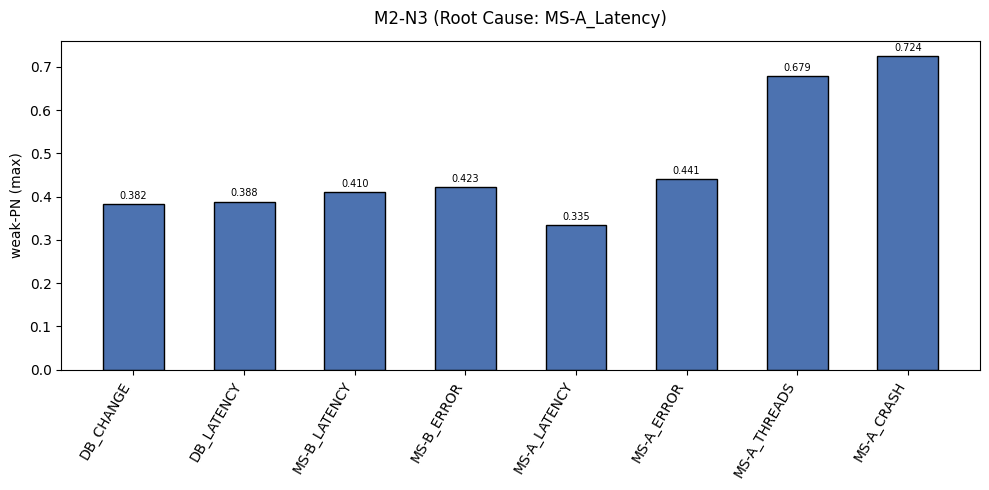

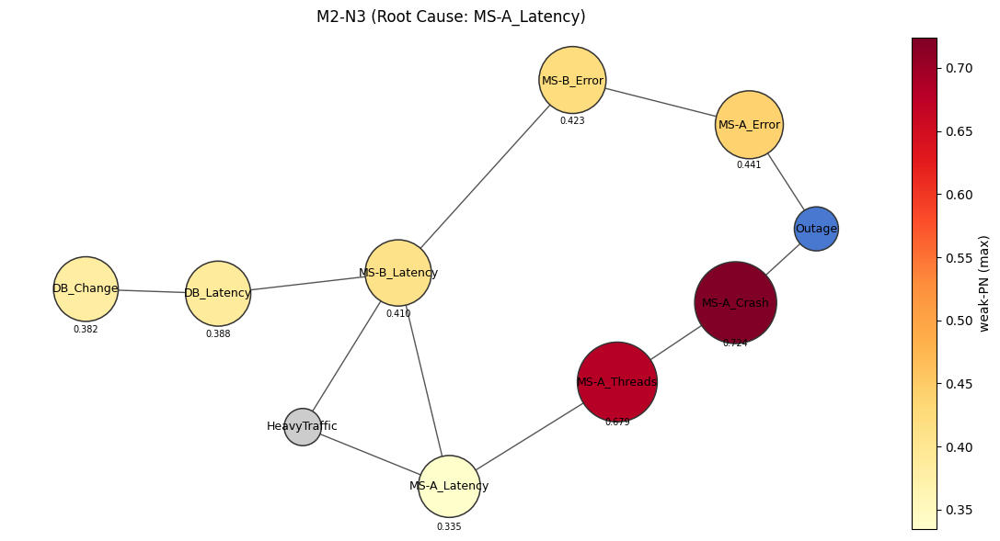

In [128]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PN,
                            which="max",
                            target="Outage",
                            score_name="weak-PN",
                            bar_title="M2-N3 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N3 (Root Cause: MS-A_Latency)")

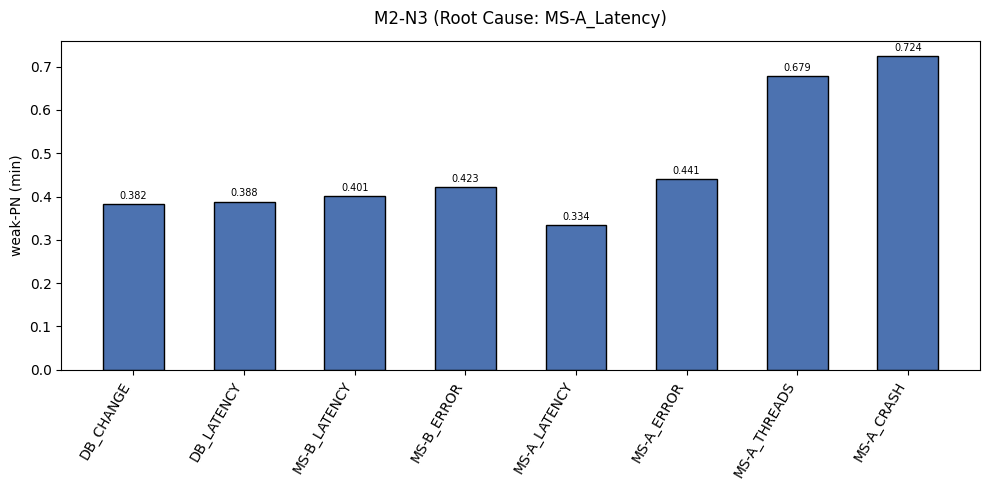

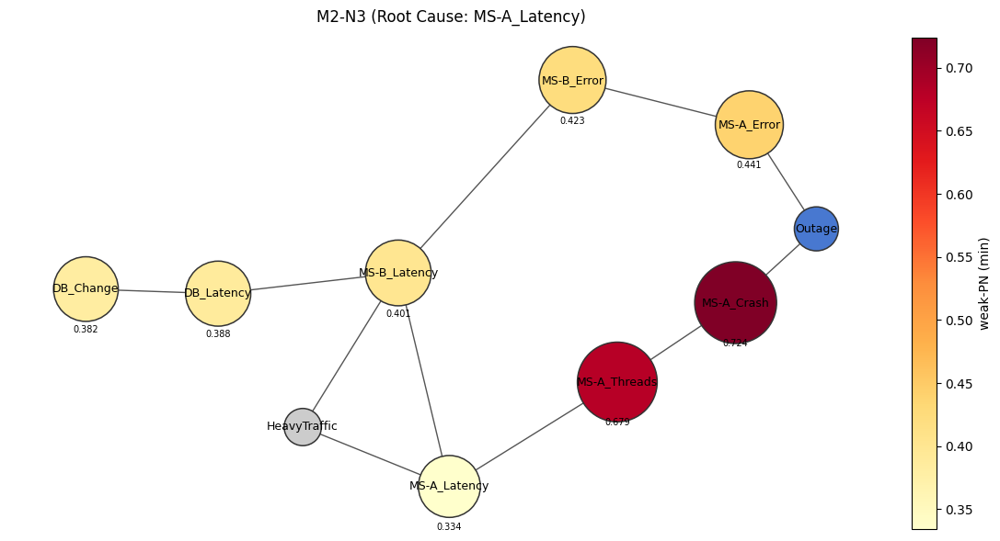

In [129]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PN,
                            which="min",
                            target="Outage",
                            score_name="weak-PN",
                            bar_title="M2-N3 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N3 (Root Cause: MS-A_Latency)")

### Weak PS

In [130]:
weak_PS = {
	'DB_CHANGE': [0.6684069665535238, 0.6684770062428902],
	'DB_LATENCY': [0.6785843277646364, 0.678660762386045],
	'MS-B_LATENCY': [0.6937050209707514, 0.6950893434176152],
	'MS-B_ERROR': [0.7133047731757773, 0.7134142475026224],
	'MS-A_LATENCY': [0.6230342862916238, 0.6230931190108887],
	'MS-A_ERROR': [0.7404919777209126, 0.7406248575757541],
	'MS-A_THREADS': [0.6798208450690726, 0.6798624278404163],
	'MS-A_CRASH': [0.7513302091186113, 0.7513876192974672]
}

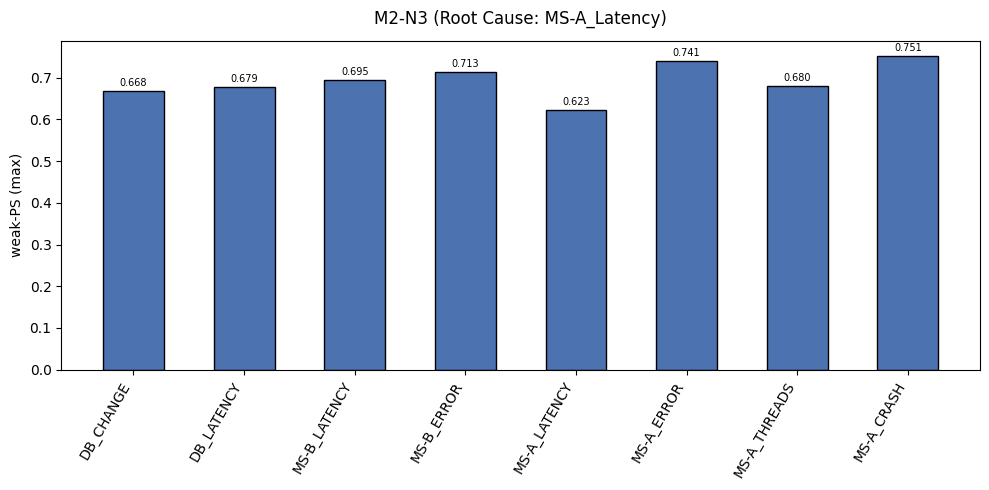

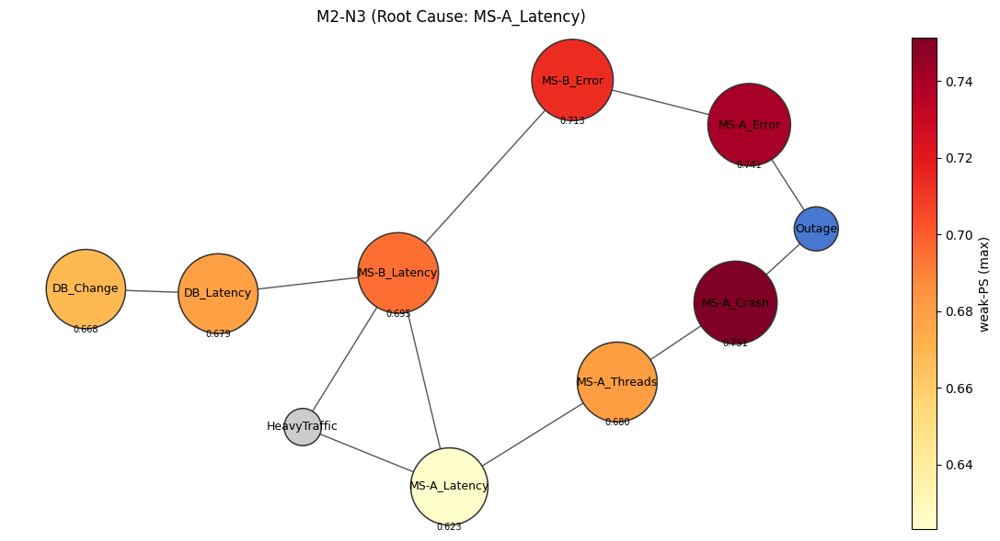

In [131]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PS,
                            which="max",
                            target="Outage",
                            score_name="weak-PS",
                            bar_title="M2-N3 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N3 (Root Cause: MS-A_Latency)")

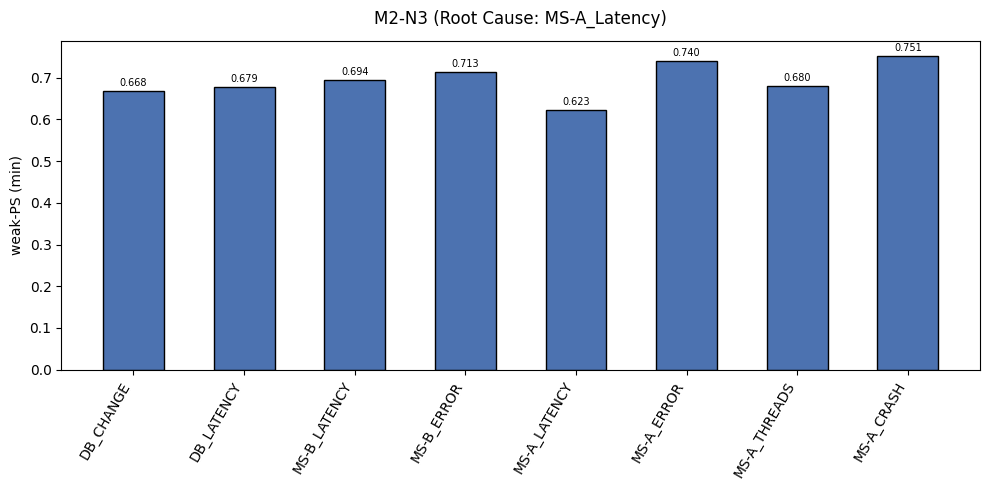

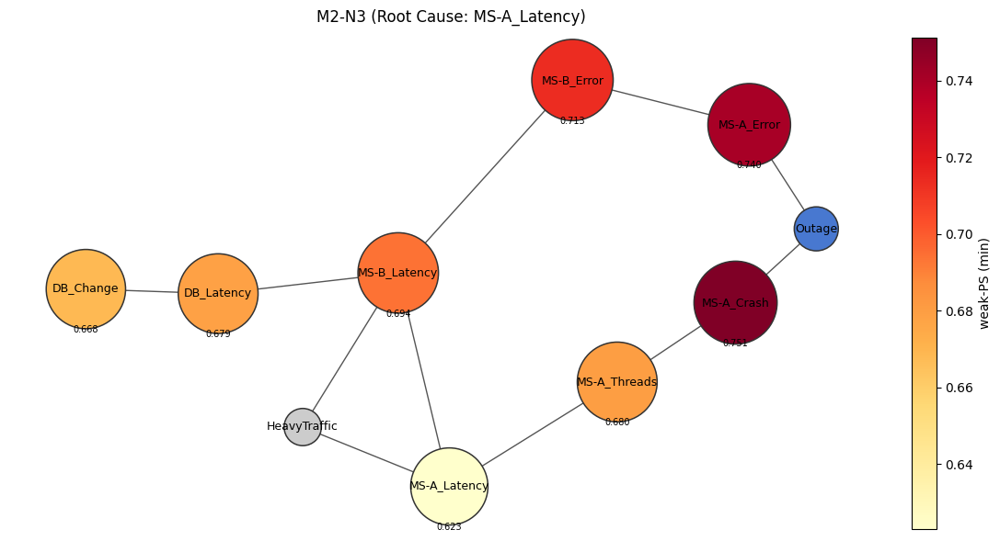

In [132]:
visualize_scores_and_graph(dot_graph_model2,
                            weak_PS,
                            which="min",
                            target="Outage",
                            score_name="weak-PS",
                            bar_title="M2-N3 (Root Cause: MS-A_Latency)",
                            dag_title="M2-N3 (Root Cause: MS-A_Latency)")